# Development: Drug2State - Drug clustering and prediction pluggin with molecular and functional casual semantics



- The rationale for developing the drug2state package stems from the need to harness the vast amount of information contained within drug-target interaction databases and multi-omic datasets, particularly those generated from single-cell RNA sequencing experiments. Traditional drug-target prediction approaches often yield large, unwieldy outputs with hundreds of potential gene targets for a single drug, making it challenging to extract meaningful insights or identify drugs with similar mechanistic actions.

- By integrating multiple kernels, including drug-gene prediction from cell scRNA expression (drug2cell output), drug-predicted gene overlap similarity, semantic descriptions embeddings from pre-trained language models (LLMs), and SMILES ChemBERTa embeddings, the drug2state package aims to provide a comprehensive landscape of drug similarity and mechanistic understanding.

- This integrated approach allows for the clustering of drugs based on their semantic, structural, and functional similarities, enabling the creation of a smooth manifold where drugs are grouped into clusters with semantic and causal meaning. Each cluster represents a distinct grouping of mechanistic action properties or biological programs, facilitating the identification of drugs with similar modes of action or therapeutic effects.

- The development of drug2state addresses the limitations of existing drug-target prediction methods by providing a systematic framework for analyzing drug-target interactions and identifying drugs with similar mechanistic actions. By leveraging transfer learning from pre-trained LLMs and advanced similarity analysis techniques, drug2state enables the extraction of actionable insights from complex multi-omic datasets, ultimately facilitating the discovery of novel drug candidates and the repurposing of existing drugs for specific perturbation cases.

In [285]:
import scanpy as sc
import drug2cell as d2c
import blitzgsea as blitz

import sys
import subprocess

#import pkg_resources
#required = {'harmonypy','sklearn','scanpy','pandas', 'numpy', 'bbknn', 'scipy', 'matplotlib', 'seaborn' ,'scipy'}
#installed = {pkg.key for pkg in pkg_resources.working_set}
#missing = required - installed
#if missing:
#    print("Installing missing packages:" )
#    print(missing)
#    python = sys.executable
#    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
from pathlib import Path
import seaborn as sns

# NLP
import scispacy
import spacy
#import en_core_sci_scibert

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis')
sc.logging.print_versions()

-----
anndata     0.10.6
scanpy      1.9.8
-----
Cython                      0.29.37
PIL                         10.2.0
annotated_types             0.6.0
asttokens                   NA
blis                        NA
blitzgsea                   NA
catalogue                   NA
certifi                     2024.02.02
charset_normalizer          3.3.2
click                       8.1.7
confection                  NA
cycler                      0.12.1
cymem                       NA
cython                      0.29.37
cython_runtime              NA
dateutil                    2.9.0
debugpy                     1.8.1
decorator                   5.1.1
drug2cell                   NA
en_core_sci_md              0.5.4
exceptiongroup              1.2.0
executing                   2.0.1
filelock                    3.13.1
h5py                        3.10.0
huggingface_hub             0.21.4
idna                        3.6
igraph                      0.11.4
ipykernel                   6.14.0
jedi     

In [286]:
import pandas as pd
import numpy as np
import scanpy as sc
from sklearn.metrics.pairwise import cosine_similarity
from sentence_transformers import SentenceTransformer
from transformers import AutoTokenizer, AutoModel
import torch
from scipy.special import softmax

class Drug2State:
    def __init__(self, adata, drug_gene_df, chembl_smiles_df, semantic_descriptors, chemberta_model='seyonec/ChemBERTa-zinc-base-v1'):
        """
        Initialize the Drug2State class with datasets and model parameters.

        :param adata: AnnData object containing single-cell expression data.
        :param drug_gene_df: DataFrame with drug-gene interactions.
        :param chembl_smiles_df: DataFrame with drugs and their corresponding SMILES strings.
        :param semantic_descriptors: List of columns in drug_gene_df for semantic analysis.
        :param chemberta_model: The ChemBERTa model for molecular structure analysis.
        """
        self.adata = adata
        self.drug_gene_df = drug_gene_df
        self.chembl_smiles_df = chembl_smiles_df
        self.semantic_descriptors = semantic_descriptors
        self.chemberta_model_name = chemberta_model
        self.semantic_model = SentenceTransformer('all-MiniLM-L6-v2')
        self.tokenizer, self.chemberta_model = self.load_chemberta_model_and_tokenizer(chemberta_model)
        
    def __init__(self, df, gene_column):
        """
        Initialize the Drug2State object with a DataFrame and the name of the column containing gene information.
        
        :param df: DataFrame containing drug-gene information.
        :param gene_column: The name of the column containing gene information.
        """
        self.df = df.copy()
        self.gene_column = gene_column
        self.mtx = {}  # Dictionary to store matrices of different weight types
        
        # Pre-process the gene data
        self._preprocess_genes()
        
    def _preprocess_genes(self):
        """
        Pre-process the gene data by converting the gene_column to lists of genes.
        """
        self.df['gene_list'] = self.df[self.gene_column].astype(str).str.split(',')
        self.df['gene_set'] = self.df['gene_list'].apply(set)
    
    def compute_gene_set_overlap(self):
        """
        Compute the overlap between gene sets of each pair of drugs and store the result as a "GSO" matrix.
        """
        # Compute overlaps
        overlap_df = self.df['gene_set'].apply(lambda x: self.df['gene_set'].apply(lambda y: self._compute_overlap(x, y)))
        
        # Normalize overlaps using softmax
        self.mtx['GSO'] = softmax(overlap_df.to_numpy(), axis=1)
        
        # Optionally, store the column names corresponding to the drugs
        self.mtx_name = overlap_df.columns.tolist()
    
    @staticmethod
    def _compute_overlap(set1, set2):
        """
        Compute the overlap between two sets of genes.
        
        :param set1: A set of genes.
        :param set2: Another set of genes.
        :return: The number of overlapping elements.
        """
        return len(set1.intersection(set2))
        
    def preprocess_data(self):
        """
        Preprocess the input dataframes for further analysis.
        """
        # Preprocess drug_gene_df as in your original code
        # Preprocess chembl_smiles_df as needed
        pass  # Placeholder for preprocessing code

    
    # load Chemberta
    def load_chemberta_model_and_tokenizer(self, model_name):
        """
        Load the ChemBERTa model and tokenizer.

        :param model_name: Name or path of the ChemBERTa model.
        :return: tokenizer, model
        """
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
        return tokenizer, model
    
    # load BERT
    def generate_semantic_embeddings(self):
        """
        Generate semantic embeddings for the descriptors in drug_gene_df.
        """
        embeddings_dict = {}
        for column in self.semantic_descriptors:
            texts = self.drug_gene_df[column].dropna().unique().tolist()  # Ensure unique, non-NaN texts
            embeddings = self.semantic_model.encode(texts, show_progress_bar=True)
            for text, embedding in zip(texts, embeddings):
                embeddings_dict[text] = embedding
        return embeddings_dict

    def generate_smiles_embeddings(self):
        """
        Generate embeddings for SMILES strings using ChemBERTa.
        """
        smiles_list = self.chembl_smiles_df['db_x_smilescanonical_smiles'].dropna().unique().tolist()
        embeddings = []
        for smiles in smiles_list:
            inputs = self.tokenizer(smiles, return_tensors="pt", padding=True, truncation=True, max_length=512)
            with torch.no_grad():
                outputs = self.chemberta_model(**inputs)
            embeddings.append(torch.mean(outputs.last_hidden_state, dim=1).squeeze().numpy())
        return np.array(embeddings)
    
    
    def compute_similarity_matrices(self, semantic_embeddings, smiles_embeddings):
        """
        Compute similarity matrices based on semantic and SMILES embeddings.
        """
        # Compute similarity matrices here
        pass  # Placeholder for similarity computation code
    
    def integrate_similarity_matrices(self, similarity_matrices_dict):
        """
        Integrate different similarity matrices using a dot product approach.

        :param similarity_matrices_dict: Dictionary of similarity matrices.
        :return: Integrated similarity matrix.
        """
        # Dot product or other nuanced integration method
        pass  # Placeholder for integration code
    
    def run_analysis(self):
        """
        Main method to run the complete analysis workflow.
        """
        self.preprocess_data()
        semantic_embeddings = self.generate_semantic_embeddings()
        smiles_embeddings = self.generate_smiles_embeddings()
        # Further analysis steps here...

        

# Run D2C with custom database

In [287]:
import pandas as pd
import drug2cell as d2c

In [288]:
adata = sc.read('/nfs/team205/ig7/projects/SCC_nano_string/010523_project_restart/A1_series_khavari_nanostring_integration/khavari_data_HVG_raw.h5ad')
sc.pp.filter_cells(adata, min_genes=100)
adata.var_names_make_unique()

original = pd.read_csv('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/build_databases/A1_V3_IG_chembl_33_filtered_merged_genesymbols_humans.csv')

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


filtered out 4 cells that have less than 100 genes expressed


In [289]:
original

,Unnamed: 0,activities|activity_id,activities|assay_id,activities|molregno,activities|pchembl_value,activities|type,activities|standard_relation,activities|standard_value,activities|standard_units,activities|standard_flag,...,target_components|component_id,db_x_smiles|molregno,db_x_smiles|canonical_smiles,db_x_ont|bao_id,db_x_ont|label,target_class,db_x_COMPONENT_GO|go_id,db_x_GO_CLASSIFICATION|path,keep,pchembl_active
0,6802,34230.0,33597.0,61181.0,9.54,pA2,=,0.2884,nM,1.0,...,146.0,61181.0,CCOc1ccccc1OCCN[C@H](C)Cc1ccc(OC)c(S(N)(=O)=O)c1,BAO_0000221,tissue-based format,GPCR,GO:0003013; GO:0005829; GO:0040007; GO:0048856...,biological_process circulatory system process...,False,True
1,6809,864717.0,33598.0,61181.0,9.54,pA2,=,0.2884,nM,1.0,...,146.0,61181.0,CCOc1ccccc1OCCN[C@H](C)Cc1ccc(OC)c(S(N)(=O)=O)c1,BAO_0000221,tissue-based format,GPCR,GO:0003013; GO:0005829; GO:0040007; GO:0048856...,biological_process circulatory system process...,False,True
2,6815,16748782.0,1617618.0,61181.0,8.66,IC50,=,2.2000,nM,1.0,...,146.0,61181.0,CCOc1ccccc1OCCN[C@H](C)Cc1ccc(OC)c(S(N)(=O)=O)c1,BAO_0000219,cell-based format,GPCR,GO:0003013; GO:0005829; GO:0040007; GO:0048856...,biological_process circulatory system process...,False,True
3,6820,22988532.0,2093431.0,61181.0,9.49,IC50,=,0.3200,nM,1.0,...,146.0,61181.0,CCOc1ccccc1OCCN[C@H](C)Cc1ccc(OC)c(S(N)(=O)=O)c1,BAO_0000219,cell-based format,GPCR,GO:0003013; GO:0005829; GO:0040007; GO:0048856...,biological_process circulatory system process...,False,True
4,6832,22988538.0,2093432.0,61181.0,8.38,IC50,=,4.2000,nM,1.0,...,258.0,61181.0,CCOc1ccccc1OCCN[C@H](C)Cc1ccc(OC)c(S(N)(=O)=O)c1,BAO_0000219,cell-based format,GPCR,GO:0003013; GO:0005886; GO:0005634; GO:0046982...,biological_process circulatory system process...,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41173,22438827,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1552.0,2739481.0,CCCCCCCCCCCCOS(=O)(=O)O.CCCCCCCCc1ccc(CCC(N)(C...,NaN,NaN,GPCR,GO:0005886; GO:0008289; GO:0007165; GO:0016020...,cellular_component membrane plasma membrane;...,True,False
41174,22438828,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,615.0,2739481.0,CCCCCCCCCCCCOS(=O)(=O)O.CCCCCCCCc1ccc(CCC(N)(C...,NaN,NaN,GPCR,GO:0005886; GO:0007165; GO:0016020; GO:0008150...,cellular_component membrane plasma membrane;...,True,False
41175,22438830,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,203.0,1407411.0,NCCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1CSSC[...,NaN,NaN,GPCR,GO:0003013; GO:0042277; GO:0048856; GO:0042592...,biological_process circulatory system process...,True,False
41176,22438831,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,237.0,1407411.0,NCCCC[C@H](NC(=O)[C@@H]1CCCN1C(=O)[C@@H]1CSSC[...,NaN,NaN,GPCR,GO:0003013; GO:0005886; GO:0019899; GO:0007165...,biological_process circulatory system process...,True,False


In [290]:
original.columns

Index(['Unnamed: 0', 'activities|activity_id', 'activities|assay_id',
       'activities|molregno', 'activities|pchembl_value', 'activities|type',
       'activities|standard_relation', 'activities|standard_value',
       'activities|standard_units', 'activities|standard_flag',
       'activities|standard_type', 'activities|activity_comment',
       'assays|description', 'assays|assay_type', 'assays|tid',
       'assays|confidence_score', 'assays|curated_by', 'assays|chembl_id',
       'assays|bao_format', 'drug_mechanism|molregno',
       'drug_mechanism|mechanism_of_action', 'drug_mechanism|tid',
       'drug_mechanism|action_type', 'activities_drug_mechanism|molregno',
       'assays_drug_mechanism|tid', 'molecule_dictionary|molregno',
       'molecule_dictionary|pref_name', 'molecule_dictionary|chembl_id',
       'molecule_dictionary|max_phase', 'molecule_dictionary|molecule_type',
       'molecule_dictionary|oral', 'molecule_dictionary|parenteral',
       'molecule_dictionary|topi

In [291]:
#pChEMBL is -log10() as per https://chembl.gitbook.io/chembl-interface-documentation/frequently-asked-questions/chembl-data-questions#what-is-pchembl
thresholds_dict={
    'none':7.53, #30nM
    'NHR':7, #100nM
    'GPCR':7, #100nM
    'Ion Channel':5, #10uM
    'Kinase':6, #1uM
}

We'll add some more criteria to the filtering. For a comprehensive list of available options, consult the documentation.

In [292]:
filtered_df = d2c.chembl.filter_activities(
    dataframe=original,
    drug_max_phase=4,
    assay_type='F',
    add_drug_mechanism=True,
    remove_inactive=True,
    include_active=True,
    pchembl_target_column="target_class",
    pchembl_threshold=thresholds_dict
)
print(filtered_df.shape)

(41178, 63)


In [293]:
filtered_df.loc[filtered_df['molecule_dictionary|chembl_id'].isin(['CHEMBL1004'])]

,Unnamed: 0,activities|activity_id,activities|assay_id,activities|molregno,activities|pchembl_value,activities|type,activities|standard_relation,activities|standard_value,activities|standard_units,activities|standard_flag,...,target_components|component_id,db_x_smiles|molregno,db_x_smiles|canonical_smiles,db_x_ont|bao_id,db_x_ont|label,target_class,db_x_COMPONENT_GO|go_id,db_x_GO_CLASSIFICATION|path,keep,pchembl_active
28294,7036598,5789203.0,737344.0,111498.0,NaN,Potency,NaN,10000.0,nM,1.0,...,4553.0,111498.0,CN(C)CCOC(C)(c1ccccc1)c1ccccn1,BAO_0000019,assay format,none,GO:0008168; GO:0003682; GO:0046677; GO:0005575...,molecular_function catalytic activity transf...,True,False
28295,7036599,5789203.0,737344.0,111498.0,NaN,Potency,NaN,10000.0,nM,1.0,...,4553.0,111498.0,CN(C)CCOC(C)(c1ccccc1)c1ccccn1,BAO_0000019,assay format,none,GO:0008168; GO:0003682; GO:0046677; GO:0005575...,molecular_function catalytic activity transf...,True,False


In [294]:
#filtered_df.to_csv('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/resources/A1_V2_IG_filtered_chembl_33_merged_genesymbols_humans.csv')

Now that we have our data frame subset to the drugs and targets of interest, we can convert them into a dictionary that can  be used by drug2cell. The exact form distributed with the package was created like so:

In [295]:
IG_custom_chembldict = d2c.chembl.create_drug_dictionary(
    filtered_df,
    drug_grouping='ATC_level'
)

In [296]:
d2c.score(adata, targets= IG_custom_chembldict, nested=True, categories=None, method='mean', layer=None, use_raw=False, n_bins=25, ctrl_size=50)

ranking genes


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/numpy/core/fromnumeric.py:86: FutureWarning: The behavior of DataFrame.sum with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return reduction(axis=axis, out=out, **passkwargs)


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:29)


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:398: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/tools/_rank_genes_groups.py:401: P

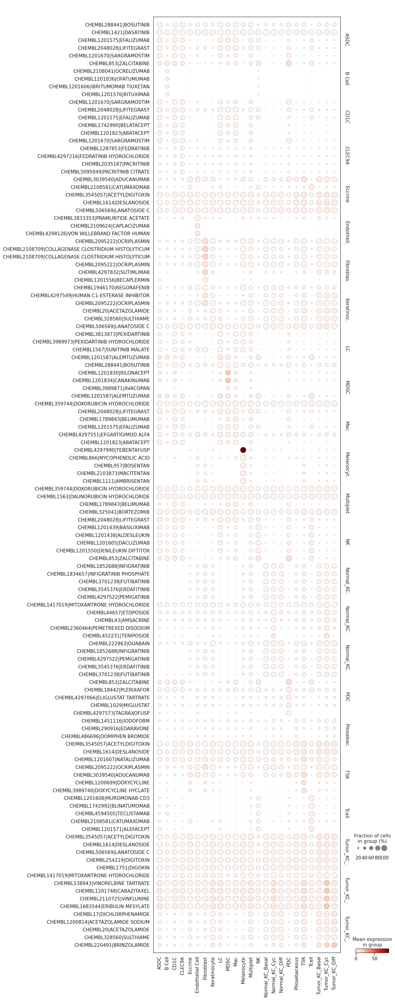

In [42]:
sc.tl.rank_genes_groups(adata.uns['drug2cell'], method="wilcoxon", groupby="level2_celltype")
sc.pl.rank_genes_groups_dotplot(adata.uns['drug2cell'], swap_axes=True, dendrogram=False, n_genes=5)

In [43]:
adata.var

,features,external_gene_name,ensembl_gene_id,hgnc_symbol,entrezgene_accession,entrezgene_id
AL627309.1,AL627309.1,AL627309.1,nan,nan,nan,nan
RP11-206L10.9,RP11-206L10.9,RP11-206L10.9,nan,nan,nan,nan
LINC00115,LINC00115,LINC00115,ENSG00000225880,LINC00115,LINC00115,79854.0
SAMD11,SAMD11,SAMD11,ENSG00000187634,SAMD11,SAMD11,148398.0
PLEKHN1,PLEKHN1,PLEKHN1,ENSG00000187583,PLEKHN1,PLEKHN1,84069.0
...,...,...,...,...,...,...
ITGB2-AS1,ITGB2-AS1,ITGB2-AS1,ENSG00000227039,ITGB2-AS1,ITGB2-AS1,100505746.0
LL21NC02-1C16.2,LL21NC02-1C16.2,LL21NC02-1C16.2,nan,nan,nan,nan
FTCD,FTCD,FTCD,ENSG00000281775,FTCD,FTCD,10841.0
MGC39584,MGC39584,MGC39584,nan,nan,nan,nan


In [44]:
adata.uns['drug2cell'].var[adata.uns['drug2cell'].var.index.str.contains('OCR')]

,genes,all_genes
CHEMBL493|BROMOCRIPTINE,"EHMT2,VDR","EHMT2,VDR,TDP1,DRD1"
CHEMBL2108041|OCRELIZUMAB,MS4A1,MS4A1
CHEMBL2095222|OCRIPLASMIN,"COL24A1,COL11A1,LAMC1,LAMC2,LAMB3,COL3A1,COL5A...","COL4A2,COL15A1,LAMA1,LAMC2,COL4A4,COL1A2,COL5A..."
CHEMBL1201147|OCTOCRYLENE,AR,"TDP1,AR"
CHEMBL1200503|BROMOCRIPTINE MESYLATE,"EHMT2,DRD4","DRD2,DRD3,DRD4,NPSR1,EHMT2"


# D2C modules

In [45]:
# Embeddings are stored as a nested dictionary
embeddings_dic = {}
# Weights are stored as a nested dictionary
weights_dic = {}

## Module 1: Geneset overlap between drugs
- We first compute a set of embeddings across geneset overlaps
- We then process this with linear decomposition into eigen vectors
- Compute neighborhoods based on these eigenvectors
- Representaitons are softmax transformed & activation function is applied

In [46]:
df = adata.uns['drug2cell'].var
drug2state = Drug2State(df, 'all_genes')
drug2state.compute_gene_set_overlap()
# Access the normalized weight matrix for gene set overlaps
gso_weights = pd.DataFrame(drug2state.mtx['GSO'],index=drug2state.df.index,columns = drug2state.df.index)
gso_weights.head(5)

,CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,CHEMBL3989924|LUTETIUM DOTATATE LU-177,CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,CHEMBL256997|ATALUREN,CHEMBL1201556|BECAPLERMIN,CHEMBL1229908|ETHAMIVAN,CHEMBL1200689|NITRIC OXIDE,CHEMBL2010601|IVACAFTOR,CHEMBL1255943|GLUTAMIC ACID HYDROCHLORIDE,CHEMBL1201130|BETAINE HYDROCHLORIDE,...,CHEMBL1788132|LOFEXIDINE HYDROCHLORIDE,CHEMBL1256400|XYLOMETAZOLINE HYDROCHLORIDE,CHEMBL239243|TAURINE,CHEMBL1200437|QUINIDINE GLUCONATE,CHEMBL1201541|INSULIN SUSP PROTAMINE ZINC PURIFIED BEEF,CHEMBL454|BUTALBITAL,CHEMBL3039526|LASMIDITAN SUCCINATE,CHEMBL1256818|DEXTROMETHORPHAN HYDROBROMIDE,CHEMBL1201039|BENZTHIAZIDE,CHEMBL4297147|HALOPERIDOL LACTATE
CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,1.442275e-03,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,...,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04,5.305833e-04
CHEMBL3989924|LUTETIUM DOTATATE LU-177,4.328073e-04,6.423429e-02,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,...,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04,4.328073e-04
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,6.943972e-12,6.943972e-12,5.000000e-01,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,...,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12,6.943972e-12
CHEMBL256997|ATALUREN,6.639677e-36,6.639677e-36,6.639677e-36,1.000000e+00,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,...,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36,6.639677e-36
CHEMBL1201556|BECAPLERMIN,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,3.750831e-03,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,...,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04,5.076198e-04


In [47]:
# Assign weights & embeddings
embeddings_dic['GSO'] = gso_weights
weights_dic['GSO'] = drug2state.mtx['GSO']

# Module 2: Drug_state_usage_profiles
- Learn some representation of drug-gene prediction profiles acrtoss cells. 

In [48]:
adata.uns['drug2cell'].T
adata_tt = adata.uns['drug2cell'].T #flip the data to access pca by drugs instead of by cell
sc.pp.pca(adata_tt)
sc.pp.neighbors(adata_tt, n_neighbors=15, method='umap', metric='euclidean', key_added=None, copy=False)
# Assign weights & embeddings
embeddings_dic['DSU'] = adata_tt.obsm['X_pca']
weights_dic['DSU'] = adata_tt.obsp['connectivities']

computing PCA
    with n_comps=50
    finished (0:00:22)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


# Module 3: LLM - Drug mechanism semantincs

# Generating Embeddings with a Pre-trained Language Model
- For this module, we'll use the sentence-transformers library, which provides a convenient way to generate sentence embeddings using pre-trained models. The library offers a variety of models specifically fine-tuned for generating semantically meaningful sentence embeddings.

## Implementation Notes:
- Ensure you have the sentence-transformers library installed in your 
environment. If not, you can install it using pip (pip install sentence-transformers).
- We'll select a suitable pre-trained model from the sentence-transformers library. A good default choice is 'all-MiniLM-L6-v2', which is a lightweight model that offers a good balance between performance and computational efficiency.
- The embeddings for each drug description will be generated and stored in a list or array. These embeddings can then be used to calculate pairwise cosine similarities, forming the basis of the similarity matrix.


## Methodology Overview:
In this approach, a pre-trained Language Model (LLM), specifically sourced from the Hugging Face's sentence-transformers library, is employed to generate semantically meaningful representations of textual data related to drugs. The underlying rationale is to leverage the advanced natural language processing capabilities of models like 'all-MiniLM-L6-v2', which have been fine-tuned for understanding and encapsulating the semantic essence of text in high-dimensional vector spaces.

- Data Preprocessing: Initial stages involve rigorous preprocessing of textual data, encompassing lowercase conversion, punctuation removal, and optional stop word elimination. This step ensures the textual input to the model is standardized and free from common linguistic redundancies.
- Aggregation of Drug Descriptions: Given the presence of multiple entries per drug, the data is aggregated to compile a unified, comma-separated representation of textual descriptors for each unique drug identifier. This aggregation not only consolidates the data but also ensures the uniqueness of textual information, enhancing the quality of semantic embeddings.
- Semantic Embedding Generation: The pre-trained LLM from the sentence-transformers library is then applied to these aggregated textual descriptors. The model generates dense vector embeddings that capture the nuanced semantic relationships and contextual meanings embedded within the drug descriptions.
- Rationale for Using Pre-trained LLMs: The choice of a pre-trained LLM is driven by the need for a sophisticated understanding of complex biomedical text, which often encompasses domain-specific terminology and intricate descriptions of mechanisms of action. Pre-trained models offer a substantial foundation of general language understanding, which, when applied to specialized domains, can significantly enhance the extraction of meaningful semantic patterns.
- Significance and Application:
Semantic Similarity Assessment: The high-dimensional embeddings serve as a basis for computing semantic similarities between drugs, facilitating the construction of a similarity matrix. This matrix is instrumental in identifying drugs with similar mechanisms or descriptors, thereby enabling nuanced clustering and classification tasks.
- Downstream Analysis: The embeddings and resultant similarity assessments provide a foundational layer for more advanced analyses, such as drug repositioning, understanding drug-target interactions, and exploring novel therapeutic pathways.
In summary, this approach harnesses the power of pre-trained LLMs to transform complex drug-related textual data into semantically rich vector embeddings. This transformation is pivotal for subsequent analytical tasks, offering a deepened understanding of drug similarities and differences based on their descriptive profiles.

# V1

In [49]:
import pandas as pd
import re
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

# Ensure NLTK stop words are downloaded
import nltk
nltk.download('punkt')
nltk.download('stopwords')

import pandas as pd
import re
from nltk.corpus import stopwords

# Ensure NLTK stop words are downloaded
import nltk
nltk.download('punkt')
nltk.download('stopwords')

def preprocess_text_vectorized(series, remove_stopwords=True):
    """
    Vectorized preprocessing of a Pandas Series by converting to lowercase, removing punctuation,
    and optionally removing stop words.

    Parameters:
    - series: Pandas Series, the series containing text to preprocess.
    - remove_stopwords: bool, whether to remove stop words from the text.

    Returns:
    - series: Pandas Series, the preprocessed text series.
    """
    # Ensure the series is in string format
    series = series.astype(str)
    
    # Convert text to lowercase
    series = series.str.lower()
    
    # Remove punctuation
    series = series.str.replace(r'[^\w\s]', '', regex=True)
    
    if remove_stopwords:
        # Load stop words
        stop_words = set(stopwords.words('english'))
        
        # Tokenize and remove stop words
        series = series.apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

    return series

def preprocess_columns_vectorized(df, columns, drug_name_column, remove_stopwords=True):
    """
    Apply vectorized text preprocessing to specified columns of a DataFrame, aggregate
    multiple rows per drug into a single row with comma-separated unique values, and
    remove NaN values during aggregation.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing the text to preprocess.
    - columns: list, a list of column names to preprocess.
    - drug_name_column: str, the column name that contains the unique drug identifier.
    - remove_stopwords: bool, whether to remove stop words from the text.

    Returns:
    - df_aggregated: Pandas DataFrame, the DataFrame with preprocessed, aggregated,
      and NaN-filtered text columns.
    """
    # Preprocess each column
    for column in columns:
        df[column] = preprocess_text_vectorized(df[column], remove_stopwords)

    # Define aggregation function to join unique, non-NaN values
    def unique_non_nan_join(series):
        # Filter out NaN values, convert to set for uniqueness, then join with comma
        unique_values = set(series.dropna())
        if len(unique_values) == 0:
            return pd.NA  # Return a single NaN value if no information remains
        return ', '.join(unique_values)

    # Apply aggregation function to each column
    aggregation_functions = {column: unique_non_nan_join for column in columns}
    df_aggregated = df.groupby(drug_name_column, as_index=False).agg(aggregation_functions)

    return df_aggregated

from sentence_transformers import SentenceTransformer
import numpy as np

def generate_embeddings(df, columns,combine=False, model_name='all-MiniLM-L6-v2'):
    """
    Generate embeddings for text data in specified columns of a DataFrame using a pre-trained model.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing preprocessed text data.
    - columns: list, a list of column names for which to generate embeddings.
    - model_name: str, the name of the pre-trained model to use for generating embeddings.

    Returns:
    - embeddings_dict: dict, a dictionary where keys are column names and values are lists of embeddings.
    """
    model = SentenceTransformer(model_name)
    embeddings_dict = {}
    
    if combine == True:
            print(f"Generating combined embeddings...")
            embeddings = model.encode(df[columns].apply(lambda row: '.'.join([str(val) for val in row if pd.notna(val) and str(val).lower() != 'nan']), axis=1), show_progress_bar=True)
            embeddings_dict["combined_embeddings"] = embeddings
    else:
        for column in columns:
            print(f"Generating embeddings for {column}...")
            embeddings = model.encode(df[column].tolist(), show_progress_bar=True)
            embeddings_dict[column] = embeddings
        
    
    
    return embeddings_dict

from sklearn.metrics.pairwise import cosine_similarity
import pandas as pd

def calculate_similarity_matrix(embeddings_dict):
    """
    Calculate the pairwise cosine similarity matrix for drug embeddings.

    Parameters:
    - embeddings_dict: dict, a dictionary where keys are column names and values are lists of embeddings.

    Returns:
    - similarity_matrix: Pandas DataFrame, a DataFrame where each element [i, j] represents the
      average cosine similarity between drugs i and j across all considered descriptions.
    """
    # Initialize a list to store the similarity matrices for each column
    similarity_matrices = []

    for column, embeddings in embeddings_dict.items():
        # Calculate pairwise cosine similarity for this column's embeddings
        similarity_matrix = cosine_similarity(embeddings)
        similarity_matrices.append(similarity_matrix)
    
    # Calculate the average similarity matrix across all columns
    average_similarity_matrix = np.mean(similarity_matrices, axis=0)
    
    
    # Convert the average similarity matrix to a DataFrame for easier handling
    similarity_matrix_df = pd.DataFrame(average_similarity_matrix)

    return similarity_matrix_df



# V3

from sentence_transformers import SentenceTransformer
import numpy as np

def generate_concatenated_embeddings(df, columns, model_name='all-MiniLM-L6-v2'):
    """
    Generate concatenated embeddings for text data in specified columns of a DataFrame using a pre-trained model.

    Parameters:
    - df: Pandas DataFrame, the DataFrame containing preprocessed text data.
    - columns: list, a list of column names for which to generate embeddings.
    - model_name: str, the name of the pre-trained model to use for generating embeddings.

    Returns:
    - concatenated_embeddings: numpy array, an array where each row is the concatenated embedding for a drug.
    """
    
    
    models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'BioBERT': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on large-scale biomedical corpora.',
        'installation': 'pip install transformers'
    },
    'BlueBERT': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes, suitable for biomedical text mining.',
        'installation': 'pip install transformers'
    },
    'PubMedBERT': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks.',
        'installation': 'pip install transformers'
    }
}
    
    model = SentenceTransformer(model_name)
    concatenated_embeddings = []

    # Generate embeddings and concatenate them for each row
    for index, row in df.iterrows():
        row_embeddings = []
        for column in columns:
            text = str(row[column]) if pd.notna(row[column]) and str(row[column]).lower() != 'nan' else ''
            embedding = model.encode(text, show_progress_bar=False)
            row_embeddings.append(embedding)
        concatenated_embeddings.append(np.concatenate(row_embeddings))

    return np.array(concatenated_embeddings)


[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /home/jovyan/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to /home/jovyan/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# V2 Generating Embeddings via feature extraction with Language Models and Advanced Preprocessing Techniques

In this revised methodology, we extend our approach to leverage not only pre-trained language models from the `sentence-transformers` and `transformers` libraries for generating semantically meaningful embeddings but also employ advanced preprocessing techniques, including SciSpaCy for domain-specific text normalization. This combination enhances the embeddings' ability to capture the semantic nuances of biomedical texts.

## Implementation Notes:
- **Prerequisites**: Ensure the `sentence-transformers`, `transformers`, and `scispacy` libraries, along with a SciSpaCy model such as `en_core_sci_sm`, are installed in your environment.
- **Model Selection**: We utilize models like 'all-MiniLM-L6-v2' from the `sentence-transformers` library for their balance between performance and computational efficiency. Additionally, we consider domain-specific models from the `transformers` library, such as 'dmis-lab/biobert-v1.1', to cater to the specialized nature of biomedical texts.
- **Advanced Text Preprocessing**: Employ SciSpaCy for lemmatization and domain-specific text normalization. This step is crucial for handling biomedical terminology and ensuring the input text is in a standardized form suitable for semantic analysis.
- **Embedding Generation**: The embeddings are generated by processing the preprocessed text through the selected models, resulting in dense vector representations that encapsulate the semantic content of the text.

## Methodology Overview:
This refined approach integrates advanced NLP models and preprocessing techniques to generate high-quality semantic embeddings of biomedical text, capturing the intricate semantic relationships inherent in domain-specific descriptions.

1. **Advanced Preprocessing**: Utilizing SciSpaCy, we perform lemmatization and domain-specific normalization on the textual data. This preprocessing step ensures that the text is optimally prepared for semantic analysis, enhancing the model's ability to understand complex biomedical terms and concepts.

2. **Combining Textual Data**: To enrich the context provided to the embedding models, we combine text from multiple relevant columns for each data entry. This aggregation captures a broader semantic landscape, providing the models with comprehensive information to generate more accurate and representative embeddings.

3. **Semantic Embedding Generation with Domain-Specific Models**: We leverage both general-purpose models like 'all-MiniLM-L6-v2' and domain-specific models such as 'dmis-lab/biobert-v1.1'. The choice of model depends on the task at hand, with domain-specific models offering enhanced performance on biomedical texts due to their training on relevant corpora.

4. **Rationale for Method Choices**:
    - **SciSpaCy Preprocessing**: Essential for dealing with the specialized vocabulary and complex syntactic structures common in biomedical texts, ensuring that the input to the embedding models is clean and standardized.
    - **Model Diversity**: The selection of both general-purpose and domain-specific models allows for flexibility in handling a wide range of texts, from general descriptions to highly specialized biomedical literature.

5. **Applications and Implications**:
    - **Semantic Similarity and Clustering**: The generated embeddings enable the computation of semantic similarities between text entries, facilitating tasks such as clustering and the identification of related entities.
    - **Enhanced Drug Discovery and Research**: The rich semantic embeddings can be instrumental in drug discovery processes, offering insights into drug mechanisms, potential repurposing opportunities, and novel therapeutic targets.

In conclusion, this comprehensive approach, combining advanced preprocessing with the strategic use of both general and domain-specific language models, provides a robust framework for generating semantically rich embeddings of biomedical text. These embeddings are foundational for a myriad of analytical and discovery tasks within the biomedical domain, offering nuanced insights and enhancing the understanding of complex relationships in biomedical data.


## Lemmatization
Process: Lemmatization is performed using SciSpaCy, specifically with the en_core_sci_md model. This process involves reducing words to their base or dictionary form (lemma). For instance, "running" becomes "run", and "mice" become "mouse".
Purpose: The aim is to normalize the text, reducing the variability of word forms and focusing on the essential meaning of the words. In the biomedical domain, where terminology is crucial, this helps in standardizing different forms of medical terms to their root form, ensuring consistency in processing and analysis.
Component Choice: SciSpaCy is chosen for its optimization in the biomedical domain, providing models trained on medical corpora that are more adept at understanding biomedical terminology than general-purpose NLP tools.
## Tokenization
Process: Following lemmatization, the processed text is passed to a pre-trained transformer model, which begins with tokenization. This step is performed by the transformer's associated tokenizer (e.g., AutoTokenizer for Hugging Face models). Tokenization involves breaking down text into smaller units (tokens) that the model can understand, often words or subwords.
Purpose: Tokenization is essential for transforming natural language text into a format that can be processed by neural networks. It also allows the model to handle a wide range of vocabulary, including out-of-vocabulary words, by breaking them down into subword tokens.
Component Choice: Each transformer model comes with its tokenizer, trained to optimally tokenize text in a manner consistent with the model's training. Using the model-specific tokenizer ensures compatibility and maximizes the model's performance.
## Embedding Generation
Process: Once the text is tokenized, it's input into a pre-trained transformer model (e.g., BioBERT, BlueBERT, MiniLM). The model processes the tokenized text through multiple layers of self-attention and feedforward networks, ultimately producing contextual embeddings for each token.
Purpose: The generated embeddings are high-dimensional vector representations of tokens that capture semantic meanings and contextual relationships. Unlike static word embeddings, these contextual embeddings reflect the usage of words within the specific context they appear, allowing for a nuanced understanding of text.
Component Choice: Pre-trained transformer models are selected based on their training corpus and intended application. For biomedical text processing, models like BioBERT or BlueBERT are preferred as they are trained on biomedical literature, making them more adept at capturing the nuances of medical terminology and concepts.
Final Embedding Aggregation: For each piece of text, embeddings of individual tokens are aggregated (e.g., by taking the mean) to produce a single embedding vector that represents the entire text. This vector can then be used for downstream tasks like similarity comparison, clustering, or classification.
## Summary of Workflow and Rationale
- Lemmatization with SciSpaCy: Standardizes word forms to their base form, particularly useful in the biomedical domain for consistency in terminology.
- Tokenization with Transformer's Tokenizer: Breaks down the lemmatized text into tokens that the transformer model can process, using subword tokenization to handle a broad vocabulary.
- Contextual Embedding Generation with Transformer Models: Produces rich, contextualized representations of text, leveraging the advanced capabilities of models like BioBERT and BlueBERT, which are specifically tuned for biomedical contexts.
This workflow leverages the strengths of specialized tools at each stage, from lemmatization with SciSpaCy to contextualized embeddings with transformers, to process and analyze biomedical text effectively. Each component is chosen for its suitability to the task and the domain, ensuring that the final embeddings capture the rich semantic and contextual information necessary for downstream biomedical NLP tasks.

In [50]:
import scispacy
import en_core_sci_md  # Updated to medium model

import numpy as np
import pandas as pd
import torch
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
#from tqdm.notebook import tqdm



def biomedical_preprocess(text):
    doc = nlp(text)
    lemmatized = [token.lemma_ for token in doc]
    return ' '.join(lemmatized)

# def biomedical_preprocess(text):
#     doc = nlp(text)
#     processed_tokens = []
#     for token in doc:
#         # Extract morphological features such as prefix, suffix, and POS tag
# #         morph_features = 
# #             "text": token.text,
# #             "lemma": token.lemma_,
# #             "prefix": token.prefix_,
# #             "suffix": token.suffix_,
# #             "POS": token.pos_
# #         }
#         processed_tokens.append(token.lemma_)
#     return processed_tokens

# Define available models with details for dynamic access
models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'dmis-lab/biobert-v1.1': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on biomedical literature (BioBERT).',
    },
    'bionlp/bluebert_pubmed_mimic_uncased_L-12_H-768_A-12': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes (BlueBERT).',
    },
    'microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks (PubMedBERT).',
    }
}

# Function to load a model dynamically
def load_model(model_name):
    if models_dict[model_name]['library'] == 'transformers':
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
    elif models_dict[model_name]['library'] == 'sentence_transformers':
        model = SentenceTransformer(model_name)
        tokenizer = None  # Sentence Transformers handle tokenization internally
    return tokenizer, model

def preprocess_text_with_go_terms(text):
    # Split the text into parts (assuming GO terms are separated by semicolons)
    parts = text.split(';')

    # Process natural language parts with SpaCy
    processed_parts = []
    for part in parts:
        if part.startswith('GO:'):  # Skip GO terms or handle them differently
            processed_parts.append(part)  # You might want to map GO terms to descriptive names here
        else:
            doc = nlp(part)
            processed_parts.append(' '.join([token.lemma_ for token in doc]))

    # Rejoin the processed parts
    return '; '.join(processed_parts)

def print_NLP_models():
    print(models_dict)

# Function to generate embeddings using the selected model
def generate_embeddings(df, columns, **kwargs):
    """
    Generate embeddings for given text columns in a DataFrame using a specified pre-trained model.

    Parameters:
    - df (pandas.DataFrame): DataFrame containing the text data.
    - columns (list): List of column names in df that contain text to be processed.
    - **kwargs: Keyword arguments for model configuration and processing options.
        - model_name (str): Name of the pre-trained model to use. Default is 'all-MiniLM-L6-v2'.
        - batch_size (int): Size of batches for processing texts. Default is 128.
        - combine (bool): Whether to combine all columns into a single text for embedding. Default is False.
        - max_length (int): Maximum sequence length for the model tokenizer. Default is 128.
        - pooling_strategy (str): Strategy for pooling token embeddings to get sentence embedding. Options are 'mean', 'max', and 'attention_weighted'. Default is 'mean'.
        - layer_index (int): Index of the transformer layer from which to extract token embeddings. -1 refers to the last layer. Default is -1.
        - layer_range (tuple): A tuple specifying the start and end layer indices for pooling. For example, (2, 5) would pool over layers 2 to 5. Default is None, which means using the layer_index parameter.
        - all_layers (bool): If True, pools over all layers. This overrides layer_index and layer_range. Default is False.

    Returns:
    - embeddings_dict (dict): Dictionary with column names as keys and their corresponding embeddings as values.

    Description of Pooling Strategies:
    - 'mean' pooling computes the mean of all token embeddings in a sequence, providing an average representation.
    - 'max' pooling takes the maximum value over the token embeddings for each dimension, capturing the most salient features.
    - 'attention_weighted' uses the model's attention scores to perform weighted pooling, giving more weight to tokens deemed more important by the model.
    
    Layer Selection:
    - The layer_index parameter allows selection of specific layers from the transformer model. Different layers capture different types of information, with earlier layers generally capturing more about the syntax and later layers more about the semantics.
    """
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')
    layer_index = kwargs.get('layer_index', -1)  # -1 refers to the last layer

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings for {column}...")
        column_embeddings = []
        texts = combined_text if combine else df[column]
        print("Processing text with sciSpacy -- lemmatisation")

        # Wrap the batch processing loop with tqdm for a progress bar
        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_embeddings = None
            batch_texts = texts[i:i+batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                
                
                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
            
                # Implement attention-weighted pooling if selected
                if pooling_strategy == 'attention_weighted':
                    # Aggregate attention across all heads
                    attention_weights = torch.stack(model_output.attentions).mean(dim=1)  # Averaging across all heads
                    avg_attention_weights = attention_weights[-1].mean(dim=0).unsqueeze(0).repeat(embeddings.size(0), 1, 1)
#                     print(avg_attention_weights[-1].shape)
#                     print(embeddings.shape)
                    # Compute weighted sum of embeddings using attention weights
                    weighted_embeddings = torch.einsum('bnm,bmd->bnd', avg_attention_weights, embeddings)  # Use last layer's attention
                    batch_embeddings = weighted_embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'mean':
                    batch_embeddings = embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'max':
                    batch_embeddings = embeddings.max(dim=1).values.numpy()
            else:
                batch_embeddings = model.encode(batch_texts)
            column_embeddings.extend(batch_embeddings)

        embeddings_dict[column] = np.array(column_embeddings)

    return embeddings_dict

def generate_embeddings_opt(df, columns, **kwargs):
    """
    Generate embeddings for given text columns in a DataFrame using a specified pre-trained model.

    Parameters:
    - df (pandas.DataFrame): DataFrame containing the text data.
    - columns (list): List of column names in df that contain text to be processed.
    - **kwargs: Keyword arguments for model configuration and processing options.
        - model_name (str): Name of the pre-trained model to use. Default is 'all-MiniLM-L6-v2'.
        - batch_size (int): Size of batches for processing texts. Default is 128.
        - combine (bool): Whether to combine all columns into a single text for embedding. Default is False.
        - max_length (int): Maximum sequence length for the model tokenizer. Default is 128.
        - pooling_strategy (str): Strategy for pooling token embeddings to get sentence embedding. Options are 'mean', 'max', and 'attention_weighted'. Default is 'mean'.
        - layer_index (int): Index of the transformer layer from which to extract token embeddings. -1 refers to the last layer. Default is -1.
        - layer_range (tuple): A tuple specifying the start and end layer indices for pooling. For example, (2, 5) would pool over layers 2 to 5. Default is None, which means using the layer_index parameter.
        - all_layers (bool): If True, pools over all layers. This overrides layer_index and layer_range. Default is False.

    Returns:
    - embeddings_dict (dict): Dictionary with column names as keys and their corresponding embeddings as values.

    Description of Pooling Strategies:
    - 'mean' pooling computes the mean of all token embeddings in a sequence, providing an average representation.
    - 'max' pooling takes the maximum value over the token embeddings for each dimension, capturing the most salient features.
    - 'attention_weighted' uses the model's attention scores to perform weighted pooling, giving more weight to tokens deemed more important by the model.
    
    Layer Selection:
    - The layer_index parameter allows selection of specific layers from the transformer model. Different layers capture different types of information, with earlier layers generally capturing more about the syntax and later layers more about the semantics.
    """
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}
    attention_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings for {column}...")
        column_embeddings = []
        column_attention = []
        texts = combined_text if combine else df[column]

        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_texts = texts[i:i + batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
                attention = torch.stack(model_output.attentions).mean(dim=1).mean(dim=0)  # Averaging over heads and layers

                batch_embeddings = embeddings.mean(dim=1).numpy()  # Mean pooling over token embeddings
                batch_attention = attention.numpy()
            else:
                raise NotImplementedError("Sentence Transformers not supported in this context.")

            column_embeddings.extend(batch_embeddings)
            column_attention.extend(batch_attention)

        embeddings_dict[column] = np.array(column_embeddings)
        attention_dict[column] = np.array(column_attention)

    return embeddings_dict, attention_dict



#import hdbscan
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import umap  # Make sure umap-learn is installed
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import networkx as nx
from pydiffmap import diffusion_map as dm  # Diffusion Maps
from pydiffmap import kernel as pdk
import igraph as ig
import leidenalg as la

def plot_embeddings_neighborhood(embeddings_input, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden'):
    if not isinstance(embeddings_input, dict):  # If input is not a dictionary, treat it as a single set of embeddings
        embeddings_input = {'Single Embedding Set': embeddings_input}

    results = {}
    for column, embeddings in embeddings_input.items():
        print('Generating KNN')
        knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
        sources, targets = knn_graph.nonzero()
        
        if clustering_method == 'leiden':
            # Create an igraph Graph from the nearest neighbors graph
            g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))

            # Apply the Leiden algorithm for community detection
            partition = la.find_partition(g, la.ModularityVertexPartition)

            # Extract cluster labels
            cluster_labels = np.array(partition.membership)
        elif clustering_method == 'hdbscan':
            # Apply HDBSCAN for clustering
            clusterer = hdbscan.HDBSCAN(min_samples=n_neighbors, min_cluster_size=15)
            clusterer.fit(embeddings)

            # Extract cluster labels
            cluster_labels = clusterer.labels_

        # Dimensionality reduction
        if method == 'TSNE':
            tsne = TSNE(n_components=n_components, learning_rate=200, perplexity=30)
            reduced_embeddings = tsne.fit_transform(embeddings)
        elif method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components)
            reduced_embeddings = reducer.fit_transform(embeddings)
        elif method == 'FDG':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2)
            umap_embeddings = reducer.fit_transform(embeddings)
            G = nx.from_numpy_matrix(umap_embeddings)
            reduced_embeddings = nx.spring_layout(G)
        elif method == 'DiffusionMaps':
            kernel_obj = pdk.Kernel(data=embeddings, k=n_neighbors, epsilon='bgh', metric='euclidean')
            mydmap = dm.DiffusionMap(kernel_object=kernel_obj, n_evecs=n_components, alpha=1.0)
            reduced_embeddings = mydmap.fit_transform(embeddings)

        # Plotting
        plt.figure(figsize=(10, 8))
        if method == 'FDG':
            nx.draw_networkx_nodes(G, reduced_embeddings, node_size=50, node_color=cluster_labels, alpha=0.6)
            nx.draw_networkx_edges(G, reduced_embeddings, alpha=0.2)
        else:
            plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], c=cluster_labels, s=10, cmap='Spectral')

        plt.title(f'Embeddings Plot (using {method}) - {column}')
        plt.show()

        results[column] = reduced_embeddings

    return results, knn_graph, cluster_labels



def generate_knn_graph(embeddings, n_neighbors=5):
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(embeddings)
    connectivity_matrix = knn.kneighbors_graph(embeddings, mode='connectivity').toarray()
    return connectivity_matrix



# optimiser
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap
from scipy.stats import entropy
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import igraph as ig
import leidenalg as la
from scipy.stats import entropy
from collections import Counter

# Assuming 'generate_embeddings' and 'biomedical_preprocess' functions are defined as in your provided code

def sample_data(df, sample_size=0.05):
    """Randomly sample data from the DataFrame."""
    return df.sample(frac=sample_size)

def calculate_cluster_entropy(labels):
    """Calculate the entropy of cluster labels to measure semantic diversity."""
    label_counts = Counter(labels)
    total_count = sum(label_counts.values())
    probabilities = [count / total_count for count in label_counts.values()]
    return entropy(probabilities)

def leiden_clustering(embeddings, n_neighbors=15):
    """Apply the Leiden algorithm to cluster embeddings."""
    knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
    partition = la.find_partition(g, la.ModularityVertexPartition)
    cluster_labels = np.array(partition.membership)
    return cluster_labels, knn_graph


def plot_embeddings_with_summary(df, embeddings_dict, cluster_labels, method='TSNE', title='Embeddings Plot', tokenizer=None):
    """Plot embeddings and display a table with a semantic summary of each cluster."""
    embeddings = embeddings_dict['embeddings']  # Access the actual embeddings
    attention_weights = embeddings_dict['attention_weights']  # Access the attention weights

    if method == 'TSNE':
        reducer = TSNE(n_components=2, learning_rate=200, perplexity=30)
    elif method == 'UMAP':
        reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2)

    reduced_embeddings = reducer.fit_transform(embeddings)
    plt.figure(figsize=(12, 8))

    # Unique cluster labels
    unique_labels = np.unique(cluster_labels)

    # Generate a color map based on the number of unique labels
    colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))

    for label, color in zip(unique_labels, colors):
        indices = [i for i, l in enumerate(cluster_labels) if l == label]
        plt.scatter(reduced_embeddings[indices, 0], reduced_embeddings[indices, 1], c=[color], s=10, label=f'Cluster {label}')

    plt.title(title)
    plt.legend(markerscale=2, title='Clusters')
    plt.axis('off')
    plt.show()

#     # Assuming generate_cluster_summary_with_attention is properly defined
#     if tokenizer:
#         cluster_summary = generate_cluster_summary_with_attention(df, cluster_labels, attention_weights, tokenizer, n_words=10)
#         # Plot the cluster summary table
#         table = plt.table(cellText=cluster_summary.values, colLabels=cluster_summary.columns, cellLoc='center', loc='bottom')
#         plt.axis('off')
#         plt.show()

        
def experiment_layer_combinations(df, columns, layer_combinations, tokenizer, **kwargs):
    results = {}
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        kwargs['layer_range'] = layers
        embeddings_dict, attention_dict = generate_embeddings_opt(df, columns, **kwargs)
        
        for column in embeddings_dict.keys():
            embeddings = embeddings_dict[column]  # Now embeddings_dict[column] directly refers to the embeddings
            attention_weights = attention_dict[column]  # Using the separate attention_dict for attention weights
            cluster_labels, _ = leiden_clustering(embeddings)
            cluster_entropy = calculate_cluster_entropy(cluster_labels)
            
            # Combining embeddings and attention weights into a single dict for the plotting function
            combined_dict = {'embeddings': embeddings, 'attention_weights': attention_weights}
            
            # Pass the combined_dict along with other necessary parameters to the plotting function
            plot_embeddings_with_summary(df, combined_dict, cluster_labels, method='TSNE', title=f"TSNE - Layers {layers} - {column}", tokenizer=tokenizer)
            
            results[(layers, column)] = {'entropy': cluster_entropy, 'embeddings': embeddings,'attention_weights':attention_weights, 'cluster_labels': cluster_labels}
    
    return results


from collections import defaultdict
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np
def generate_cluster_summary_with_attention(df, cluster_labels, attention_weights, tokenizer, n_words=10):
    cluster_summary = defaultdict(list)
    
    # Convert attention_weights to a tensor if it's not already one
    if not isinstance(attention_weights, torch.Tensor):
        attention_weights = torch.tensor(attention_weights)
    
    # Aggregate attention weights for each token across all sequences
    # We assume attention_weights is a 2D array: [num_sequences, seq_length]
    aggregated_attention = attention_weights.mean(dim=0)
    
    # Get the indices of the top n tokens based on attention weights
    top_n_indices = torch.topk(aggregated_attention, n_words).indices

    # Convert top token indices to words
    top_tokens = tokenizer.convert_ids_to_tokens(top_n_indices.tolist())

    for label in np.unique(cluster_labels):
        cluster_summary[label] = ' '.join(top_tokens[:n_words])

    summary_df = pd.DataFrame(list(cluster_summary.items()), columns=['Cluster ID', 'Representative Tokens'])
    return summary_df

# V3

In [159]:
import scispacy
import en_core_sci_md  # Updated to medium model

import numpy as np
import pandas as pd
import torch
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
from transformers import AutoTokenizer, AutoModel
from sentence_transformers import SentenceTransformer
from tqdm.auto import tqdm
#from tqdm.notebook import tqdm



def biomedical_preprocess(text):
    doc = nlp(text)
    lemmatized = [token.lemma_ for token in doc]
    return ' '.join(lemmatized)

# def biomedical_preprocess(text):
#     doc = nlp(text)
#     processed_tokens = []
#     for token in doc:
#         # Extract morphological features such as prefix, suffix, and POS tag
# #         morph_features = 
# #             "text": token.text,
# #             "lemma": token.lemma_,
# #             "prefix": token.prefix_,
# #             "suffix": token.suffix_,
# #             "POS": token.pos_
# #         }
#         processed_tokens.append(token.lemma_)
#     return processed_tokens

# Define available models with details for dynamic access
models_dict = {
    'all-MiniLM-L6-v2': {
        'library': 'sentence_transformers',
        'description': 'A general-purpose compact model suitable for a wide range of tasks.'
    },
    'dmis-lab/biobert-v1.1': {
        'library': 'transformers',
        'description': 'A domain-specific model pre-trained on biomedical literature (BioBERT).',
    },
    'bionlp/bluebert_pubmed_mimic_uncased_L-12_H-768_A-12': {
        'library': 'transformers',
        'description': 'Pre-trained on PubMed abstracts and MIMIC-III clinical notes (BlueBERT).',
    },
    'microsoft/BiomedNLP-PubMedBERT-base-uncased-abstract-fulltext': {
        'library': 'transformers',
        'description': 'BERT model pre-trained on PubMed articles, optimized for biomedical NLP tasks (PubMedBERT).',
    }
}

# Function to load a model dynamically
def load_model(model_name):
    if models_dict[model_name]['library'] == 'transformers':
        tokenizer = AutoTokenizer.from_pretrained(model_name)
        model = AutoModel.from_pretrained(model_name)
    elif models_dict[model_name]['library'] == 'sentence_transformers':
        model = SentenceTransformer(model_name)
        tokenizer = None  # Sentence Transformers handle tokenization internally
    return tokenizer, model

def preprocess_text_with_go_terms(text):
    # Split the text into parts (assuming GO terms are separated by semicolons)
    parts = text.split(';')

    # Process natural language parts with SpaCy
    processed_parts = []
    for part in parts:
        if part.startswith('GO:'):  # Skip GO terms or handle them differently
            processed_parts.append(part)  # You might want to map GO terms to descriptive names here
        else:
            doc = nlp(part)
            processed_parts.append(' '.join([token.lemma_ for token in doc]))

    # Rejoin the processed parts
    return '; '.join(processed_parts)

def print_NLP_models():
    print(models_dict)
def generate_knn_graph(embeddings, n_neighbors=5):
    knn = NearestNeighbors(n_neighbors=n_neighbors)
    knn.fit(embeddings)
    connectivity_matrix = knn.kneighbors_graph(embeddings, mode='connectivity').toarray()
    return connectivity_matrix



# optimiser
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
import umap
from scipy.stats import entropy
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import igraph as ig
import leidenalg as la
from scipy.stats import entropy
from collections import Counter

def sample_data(df, sample_size=0.05):
    """Randomly sample data from the DataFrame."""
    return df.sample(frac=sample_size)

def calculate_cluster_entropy(labels):
    """Calculate the entropy of cluster labels to measure semantic diversity."""
    label_counts = Counter(labels)
    total_count = sum(label_counts.values())
    probabilities = [count / total_count for count in label_counts.values()]
    return entropy(probabilities)

def leiden_clustering(embeddings, n_neighbors=15):
    """Apply the Leiden algorithm to cluster embeddings."""
    knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
    partition = la.find_partition(g, la.ModularityVertexPartition)
    cluster_labels = np.array(partition.membership)
    return cluster_labels, knn_graph

def generate_embeddings_and_attention(df, columns, **kwargs):
    # Extract parameters from kwargs or set defaults
    layer_range = kwargs.get('layer_range', None)
    all_layers = kwargs.get('all_layers', False)
    model_name = kwargs.get('model_name', 'all-MiniLM-L6-v2')
    batch_size = kwargs.get('batch_size', 128)
    combine = kwargs.get('combine', False)
    max_length = kwargs.get('max_length', 128)
    pooling_strategy = kwargs.get('pooling_strategy', 'mean')
    top_n = kwargs.get('top_n', 15)  # Number of top tokens to extract
    layer_index = kwargs.get('layer_index', -1)  # Default is the last layer

    print(f"Using model {model_name}")
    tokenizer, model = load_model(model_name)
    embeddings_dict = {}
    attention_dict = {}
    top_tokens_dict = {}

    if combine:
        combined_text = df[columns].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)
        combined_text = combined_text.str.replace(';','. ')
        combined_text = combined_text.str.replace('nan','') 
        columns = ['combined']

    for column in columns:
        print(f"Generating embeddings and attention for {column}...")
        column_embeddings = []
        column_attention = []
        column_top_tokens = []

        texts = combined_text if combine else df[column]
        print("Processing text with sciSpacy -- lemmatisation")

        for i in tqdm(range(0, len(texts), batch_size), desc=f"Processing {column}"):
            batch_texts = texts[i:i + batch_size].apply(biomedical_preprocess).tolist()
            if tokenizer:
                encoded_input = tokenizer(batch_texts, padding=True, truncation=True, max_length=max_length, return_tensors='pt')
                with torch.no_grad():
                    model_output = model(**encoded_input, output_attentions=True, output_hidden_states=True)
                
                # Handle pooling across all layers or specific layer ranges
                if all_layers:
                    embeddings = torch.stack(model_output.hidden_states).mean(dim=0)  # Averaging across all layers
                elif layer_range:
                    embeddings = torch.stack(model_output.hidden_states[layer_range[0]:layer_range[1]+1]).mean(dim=0)
                else:
                    embeddings = model_output.hidden_states[layer_index]
                
                # Extract attention scores and pool them
                attention = model_output.attentions[layer_index] if not all_layers and not layer_range else torch.stack(model_output.attentions).mean(dim=0)
                pooled_attention = attention.mean(dim=1)  # Pooling across heads

                # Extract top tokens based on attention scores
                token_ids = encoded_input['input_ids']
                tokens = [tokenizer.convert_ids_to_tokens(ids) for ids in token_ids]
                # Extract top tokens based on attention scores, filtering out special tokens and punctuation
                top_tokens = []
                for seq_attention, seq_tokens in zip(pooled_attention, tokens):
                    seq_attention = seq_attention.mean(dim=0)  # Pooling across sequence length
                    filtered_tokens = [(token, attn) for token, attn in zip(seq_tokens, seq_attention) if token not in ['[CLS]', '[SEP]','[PAD]'] and token.isalpha()]
                    filtered_tokens.sort(key=lambda x: x[1], reverse=True)  # Sort by attention, descending
                    top_tokens.append([token for token, _ in filtered_tokens[:top_n]])

                # Pool embeddings based on the selected strategy
                if pooling_strategy == 'mean':
                    batch_embeddings = embeddings.mean(dim=1).numpy()
                elif pooling_strategy == 'max':
                    batch_embeddings = embeddings.max(dim=1).values.numpy()

            else:
                # For Sentence Transformers or models without a tokenizer, embeddings are generated directly
                batch_embeddings = model.encode(batch_texts)
                # Attention and top tokens are not applicable in this case
                top_tokens = [[] for _ in range(len(batch_texts))]

            column_embeddings.extend(batch_embeddings)
            column_top_tokens.extend(top_tokens)

        embeddings_dict[column] = np.array(column_embeddings)
        top_tokens_dict[column] = column_top_tokens

    return {'embeddings': embeddings_dict, 'top_tokens': top_tokens_dict}

def create_semantic_summaries(top_tokens_dict):
    """
    Create semantic summaries for each cluster based on the top tokens.

    Parameters:
    - top_tokens_dict (dict): Dictionary with lists of top tokens for each text.

    Returns:
    - semantic_summaries (dict): Dictionary with semantic summaries for each cluster.
    """
    semantic_summaries = {}
    for column, top_tokens_list in top_tokens_dict.items():
        # Aggregate top tokens across all texts to form a cluster summary
        cluster_summary = list(set([token for sublist in top_tokens_list for token in sublist]))
        semantic_summaries[column] = cluster_summary

    return semantic_summaries

def extract_top_tokens(attention, tokens, top_n=15, pooling_strategy='mean'):
    """
    Extract the top N tokens based on attention scores.

    Parameters:
    - attention (torch.Tensor): Attention tensor of shape [num_layers, num_heads, seq_len, seq_len]
    - tokens (List[str]): List of tokens corresponding to the attention scores
    - top_n (int): Number of top tokens to extract
    - pooling_strategy (str): Strategy for pooling attention scores across layers and heads ('mean' or 'max')

    Returns:
    - top_tokens (List[str]): List of top N tokens based on attention
    """
    if pooling_strategy == 'mean':
        pooled_attention = attention.mean(dim=0).mean(dim=0)  # Pooling across layers and heads
    elif pooling_strategy == 'max':
        pooled_attention = attention.max(dim=0)[0].max(dim=0)[0]  # Pooling across layers and heads

    # Sum attention across the sequence length to get a score per token
    token_attention_scores = pooled_attention.sum(dim=-1)
    
    # Get indices of top N attention scores
    top_indices = token_attention_scores.topk(top_n).indices.tolist()
    
    # Map indices to tokens
    top_tokens = [tokens[i] for i in top_indices if i < len(tokens)]  # Ensure index is within token list bounds

    return top_tokens

def build_sentence_descriptions(top_tokens, original_sentences):
    """
    Build sentence descriptions using top tokens. This function attempts to find sentences from the original text
    that contain the top tokens and uses them to build a description.

    Parameters:
    - top_tokens (List[str]): List of top tokens for a cluster or an item.
    - original_sentences (List[str]): List of original sentences from the text.

    Returns:
    - sentence_descriptions (List[str]): List of sentences that include the top tokens.
    """
    sentence_descriptions = []
    for token in top_tokens:
        for sentence in original_sentences:
            if token in sentence and sentence not in sentence_descriptions:
                sentence_descriptions.append(sentence)
                break  # Move to the next token after finding a sentence

    return sentence_descriptions


#import hdbscan
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import umap  # Make sure umap-learn is installed
from sklearn.manifold import TSNE
from sklearn.neighbors import NearestNeighbors, kneighbors_graph
import networkx as nx
from pydiffmap import diffusion_map as dm  # Diffusion Maps
from pydiffmap import kernel as pdk
import igraph as ig
import leidenalg as la

def plot_embeddings_neighborhood(embeddings_input, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden'):
    if not isinstance(embeddings_input, dict):  # If input is not a dictionary, treat it as a single set of embeddings
        embeddings_input = {'Single Embedding Set': embeddings_input}

    results = {}
    for column, embeddings in embeddings_input.items():
        print('Generating KNN')
        knn_graph = kneighbors_graph(embeddings, n_neighbors=n_neighbors, mode='connectivity', include_self=True)
        sources, targets = knn_graph.nonzero()
        
        if clustering_method == 'leiden':
            # Create an igraph Graph from the nearest neighbors graph
            g = ig.Graph(n=embeddings.shape[0], edges=list(zip(sources, targets)))
            # Define a resolution parameter
            resolution_param = 3.0  # Adjust this value as needed

            # Apply the Leiden algorithm for community detection
            #partition = la.find_partition(g, la.ModularityVertexPartition)
            partition = la.find_partition(g, la.RBConfigurationVertexPartition, resolution_parameter=resolution_param)


            # Extract cluster labels
            cluster_labels = np.array(partition.membership)
        elif clustering_method == 'hdbscan':
            # Apply HDBSCAN for clustering
            clusterer = hdbscan.HDBSCAN(min_samples=n_neighbors, min_cluster_size=15)
            clusterer.fit(embeddings)

            # Extract cluster labels
            cluster_labels = clusterer.labels_

        # Dimensionality reduction
        if method == 'TSNE':
            tsne = TSNE(n_components=n_components, learning_rate=200, perplexity=30)
            reduced_embeddings = tsne.fit_transform(embeddings)
        elif method == 'UMAP':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=n_components)
            reduced_embeddings = reducer.fit_transform(embeddings)
        elif method == 'FDG':
            reducer = umap.UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2)
            umap_embeddings = reducer.fit_transform(embeddings)
            G = nx.from_numpy_matrix(umap_embeddings)
            reduced_embeddings = nx.spring_layout(G)
        elif method == 'DiffusionMaps':
            kernel_obj = pdk.Kernel(data=embeddings, k=n_neighbors, epsilon='bgh', metric='euclidean')
            mydmap = dm.DiffusionMap(kernel_object=kernel_obj, n_evecs=n_components, alpha=1.0)
            reduced_embeddings = mydmap.fit_transform(embeddings)

        import matplotlib.pyplot as plt
        import matplotlib.colors as mcolors

        # Plotting
        plt.figure(figsize=(12, 8))  # Adjusted for additional space for the legend

        # Define a colormap
        cmap = plt.cm.Spectral

        # Find the range of cluster_labels and normalize
        norm = mcolors.Normalize(vmin=cluster_labels.min(), vmax=cluster_labels.max())

        # Apply the colormap and normalization to cluster_labels for coloring
        colors = cmap(norm(cluster_labels))

        if method == 'FDG':
            nx.draw_networkx_nodes(G, reduced_embeddings, node_size=50, node_color=colors, alpha=0.6)
            nx.draw_networkx_edges(G, reduced_embeddings, alpha=0.2)
        else:
            scatter = plt.scatter(reduced_embeddings[:, 0], reduced_embeddings[:, 1], color=colors, s=10)

        plt.title(f'Embeddings Plot (using {method}) - {column}')

        # Create custom legend
        unique_labels = np.unique(cluster_labels)
        legend_colors = [cmap(norm(label)) for label in unique_labels]
        legend_handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=6, linestyle='None') for color in legend_colors]

        # Convert unique_labels to a list to avoid ValueError
        unique_labels_list = unique_labels.tolist()

        # Create legend with custom handles, placing it outside the plot
        plt.legend(handles=legend_handles, labels=unique_labels_list, title="Clusters", markerscale=2, loc='center left', bbox_to_anchor=(1, 0.5))

        plt.tight_layout()  # Adjust layout to not cut off elements
        plt.show()

        results[column] = reduced_embeddings

    return results, knn_graph, cluster_labels

def aggregate_top_tokens_by_cluster(top_tokens, cluster_labels):
    cluster_top_tokens = {}
    
    # Iterate over each drug's top tokens and its cluster label
    for tokens_list, label in zip(top_tokens, cluster_labels):
        # Initialize the cluster key in the dictionary if not already present
        if label not in cluster_top_tokens:
            cluster_top_tokens[label] = []
        
        # Extend the list of tokens for this cluster with the current drug's top tokens
        cluster_top_tokens[label].extend(tokens_list)
    
    # Deduplicate tokens in each cluster
    for label, tokens in cluster_top_tokens.items():
        cluster_top_tokens[label] = list(set(tokens))
    
    return cluster_top_tokens


def generate_text(input_text, max_length=50):
    input_text = "summarize: " + input_text
    inputs = t5_tokenizer.encode(input_text, return_tensors="pt", max_length=512, truncation=True)
    summary_ids = t5_model.generate(inputs, max_length=max_length, num_return_sequences=1, early_stopping=True)
    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return summary

def prepare_input_text_for_cluster(cluster_top_tokens, original_texts, cluster_labels):
    input_texts = {}
    for cluster, tokens in cluster_top_tokens.items():
        texts_in_cluster = [text for text, label in zip(original_texts, cluster_labels) if label == cluster]
        # Concatenate all relevant texts and top tokens
        input_text = " ".join(tokens) + " " + " ".join(texts_in_cluster)
        input_texts[cluster] = input_text
    return input_texts


In [131]:
def run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.05):
    # Sample the DataFrame for the experiment
    sampled_df = sample_data(df, sample_size=sample_size)
    
    # Load the model and tokenizer
    model_name = sem_model_params['model_name']
    tokenizer, _ = load_model(model_name)

    # Initialize the T5 model for summarization
    t5_model_name = "t5-base"
    t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
    t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

    experiment_results = []
    
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        sem_model_params['layer_range'] = layers
        
        # Generate embeddings and attention
        emb_results = generate_embeddings_and_attention(sampled_df, descriptors, **sem_model_params)
        embeddings_dict = emb_results['embeddings']
        top_tokens_dict = emb_results['top_tokens']
        column_name = 'combined'  # Assuming combined text

        results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')
        
        top_tokens = top_tokens_dict[column_name] 
        sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
        original_texts = sampled_df[column_name]
        
        # Apply clustering and obtain cluster labels
        for column, embeddings in embeddings_dict.items():
#            cluster_labels, _ = leiden_clustering(embeddings)
#            cluster_entropy = calculate_cluster_entropy(cluster_labels)
            
            # Aggregate top tokens by cluster using the cluster labels
            cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

            # Prepare input text for each cluster
            input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

            # Generate summaries for each cluster
            cluster_summaries = {}
            for cluster, input_text in input_texts_for_clusters.items():
                summary = generate_text(input_text, max_length=20)  # You can adjust max_length as needed
                cluster_summaries[cluster] = summary

            # Construct DataFrame
            labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
            experiment_results.append({
                'layers': layers,
                'column': column,
                #'entropy': cluster_entropy,
                'summaries': cluster_summaries
            })

    return pd.DataFrame(experiment_results)


In [132]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
import matplotlib.pyplot as plt
from collections import defaultdict

from itertools import combinations
from sklearn.metrics.pairwise import cosine_distances

def calculate_inter_drug_cosine_distances(cluster_top_tokens, embeddings_dict, cluster_labels, column_name):
    cluster_cosine_distances = {}

    # Iterate over each cluster
    for cluster, tokens in cluster_top_tokens.items():
        # Get indices of drugs in the current cluster
        drug_indices = [i for i, label in enumerate(cluster_labels) if label == cluster]

        # Calculate pairwise cosine distances between drugs in the cluster
        distances = []
        for idx1, idx2 in combinations(drug_indices, 2):  # Pairwise combinations of drug indices
            embeddings1 = embeddings_dict[column_name][idx1]
            embeddings2 = embeddings_dict[column_name][idx2]
            
            # Compute cosine distance between the two sets of embeddings
            dist = cosine_distances([embeddings1], [embeddings2])[0][0]
            distances.append(dist)

        # Calculate the average cosine distance for the cluster
        if distances:
            avg_distance = sum(distances) / len(distances)
        else:
            avg_distance = None  # No distances to average

        cluster_cosine_distances[cluster] = avg_distance

    return cluster_cosine_distances


def run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.05):
    sampled_df = sample_data(df, sample_size=sample_size)
    model_name = sem_model_params['model_name']
    tokenizer, _ = load_model(model_name)
    
    t5_model_name = "t5-base"
    t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
    t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)
    
    experiment_results = []
    cosine_distances = defaultdict(list)  # To track cosine distance changes across layer combinations
    
    for layers in layer_combinations:
        print(f"Testing layers: {layers}")
        sem_model_params['layer_range'] = layers
        emb_results = generate_embeddings_and_attention(sampled_df, descriptors, **sem_model_params)
        embeddings_dict = emb_results['embeddings']
        top_tokens_dict = emb_results['top_tokens']
        column_name = 'combined'
        
        results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')
        
        top_tokens = top_tokens_dict[column_name]
        sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
        original_texts = sampled_df[column_name]
        
        # Aggregate top tokens by cluster using the cluster labels
        cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

        # Prepare input text for each cluster
        input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

        # Generate summaries for each cluster
        cluster_summaries = {}
        for cluster, input_text in input_texts_for_clusters.items():
            summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
            cluster_summaries[cluster] = summary
            #print(summary)
        
#         # Prepare input text for each cluster and generate summaries
#         cluster_summaries = {}
#         for cluster, tokens in cluster_top_tokens.items():
#             input_text = " ".join(tokens)
#             summary = generate_text(input_text)
#             cluster_summaries[cluster] = summary
#             print(summary)
            
            # Calculate cosine distance for the tokens within the cluster
            token_embeddings = [embeddings_dict[column_name][i] for i, label in enumerate(cluster_labels) if label == cluster]
            if token_embeddings:
                cosine_dist = calculate_inter_drug_cosine_distances(cluster_top_tokens, embeddings_dict, cluster_labels, column_name)
                #print(cosine_dist)
                #                 cosine_dist = cosine_similarity(token_embeddings)
                avg_cosine_dist = np.mean(list(cosine_dist.values()))
                cosine_distances[cluster].append(avg_cosine_dist)
        
        # Construct DataFrame for this layer combination
        labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
        experiment_results.append({'layers': layers, 'summaries': labels_df_T5, 'cosine_dist':cosine_dist,'avg_cosine':cosine_distances})
        # After plt.show() for the t-SNE plot
#         fig, ax = plt.subplots(figsize=(5, len(labels_df_T5) * 0.3))  # Adjust size as needed
#         ax.axis('tight')
#         ax.axis('off')
#         ax.table(cellText=labels_df_T5.values, colLabels=labels_df_T5.columns, cellLoc='center', loc='center')
#         plt.show()
        pd.set_option('display.max_colwidth', 50)
        print(labels_df_T5)

    plt.figure(figsize=(10, 6))
    layer_comb_str = [str(layers) for layers in layer_combinations]  # Convert layer combinations to strings for plotting

    for cluster, distances in cosine_distances.items():
        if len(distances) == len(layer_combinations):  # Ensure we have matching x and y dimensions
            plt.plot(layer_comb_str, distances, label=f'Cluster {cluster}')
        else:
            print(f"Skipping cluster {cluster} due to dimension mismatch")

    plt.xlabel('Layer Combinations')
    plt.ylabel('Average Cosine Distance')
    plt.title('Change in Cosine Distance Within Clusters Across Layer Combinations')
    plt.legend()
    plt.show()

    return experiment_results

## Filter the database for drugs that are relevant

In [126]:
df = filtered_df.copy()
filtered_df.columns
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]

## Pre-process the semantic information

In [127]:
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']
#df_procc = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )

In [128]:
# Load the SciSpaCy model
nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# nlp.add_pipe("morphologizer")
nlp.max_length = 2000000

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


Testing layers: (0, 4)
Using model dmis-lab/biobert-v1.1
Generating embeddings and attention for combined...
Processing text with sciSpacy -- lemmatisation


Processing combined: 100%|██████████| 4/4 [03:24<00:00, 51.07s/it]


Generating KNN


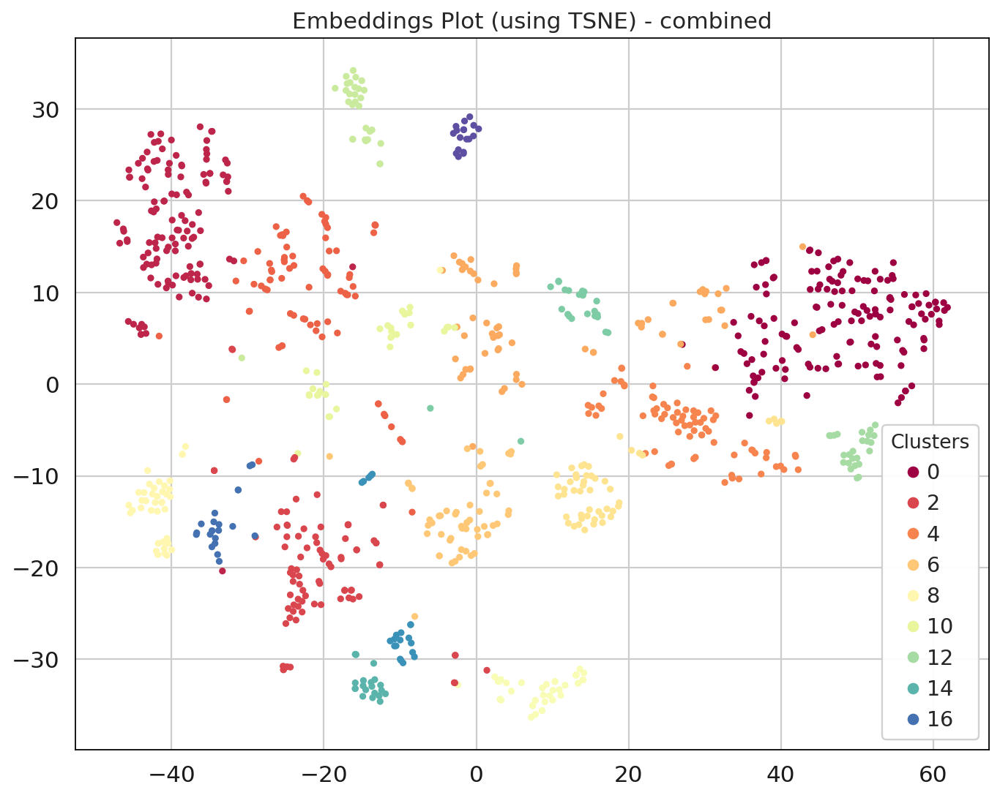

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

    Cluster                                            Summary
0         4  antineoplastic and immunomolecular agents. ant...
1         2  antineoplastic and immunomodulating agents. ty...
2        13  NERVOUS SYSTEM. PSYCHOANALEPTICS. ANTIDEPRESSA...
3         0  a m molecule component generation drug contain...
4         5  cAMP accumulation is a non-selective beta-adre...
5        12  carbonic anhydrase inhibitors. carbonic anhydr...
6         9        NERVOUS SYSTEM. Other NERVOUS SYSTEM DRUGS.
7         1  local human for ion be control acid after divi...
8        10  beta-blockers are non-selective. pA2 is a mole...
9         8  genito urinary SYSTEM and sex hormones. hPR an...
10       16  antagonist activity at AR in human LNCAP cells...
11        3  qHTS: a qHTS-based sensitivity assay for a sex...
12       17  genito urinary system and sex hormones. antiin...
13        6  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. PL...
14        7  tubulin inhibitors are used to inhibit tub

Processing combined: 100%|██████████| 4/4 [03:12<00:00, 48.21s/it]


Generating KNN


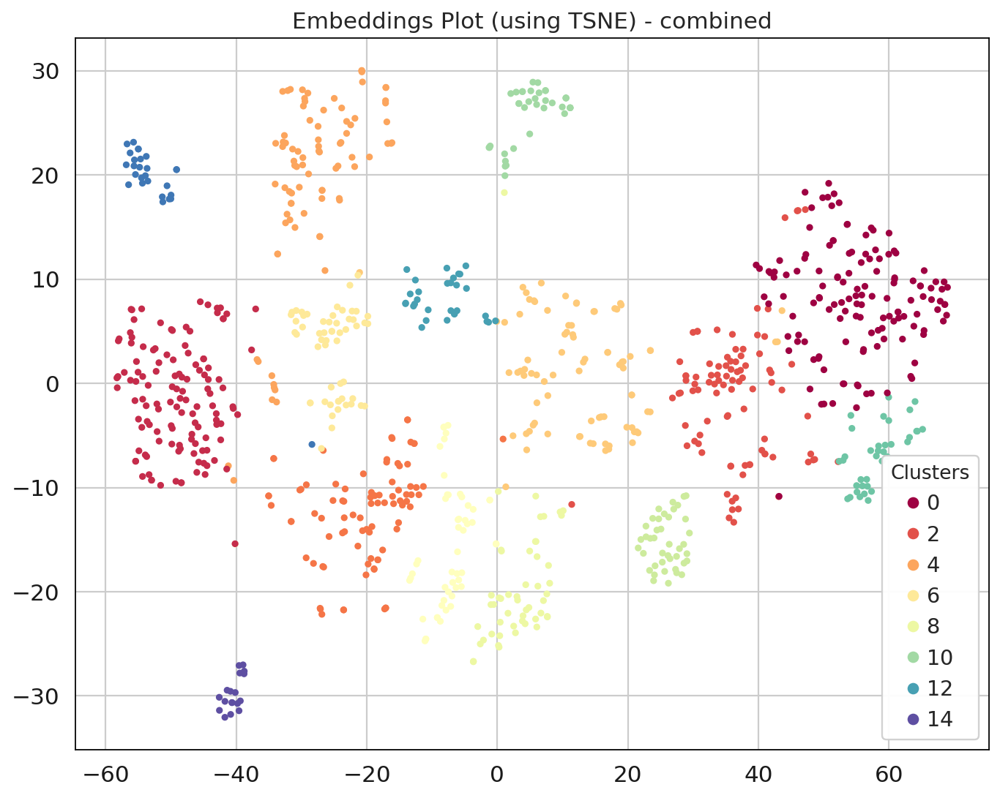

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

    Cluster                                            Summary
0         2  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. AN...
1         3  antineoplastic and immunomolecular agents. tyr...
2         5  NERVOUS SYSTEM. PSYCHOANALEPTICS. ANTIDEPRESSA...
3        11  Domain o ion coupled d pub selective increase ...
4        10        NERVOUS SYSTEM. Other NERVOUS SYSTEM DRUGS.
5         1  local human for ion current. local human for i...
6        12  human beta-2 adrenergic receptor expressed in ...
7         6  genito urinary SYSTEM and sex hormones. hPR ex...
8         0  CHO cells expressing histamine H1 receptor inh...
9         4  v human for ion block pub disease v human for ...
10       14  genito urinary system and sex hormones. antiin...
11        8  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. PL...
12        9  tubulin inhibitors are used to inhibit tubulin...
13       13  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS. OT...
14        7  antineoplastic and immunomodulating agents

Processing combined: 100%|██████████| 4/4 [03:11<00:00, 47.87s/it]


Generating KNN


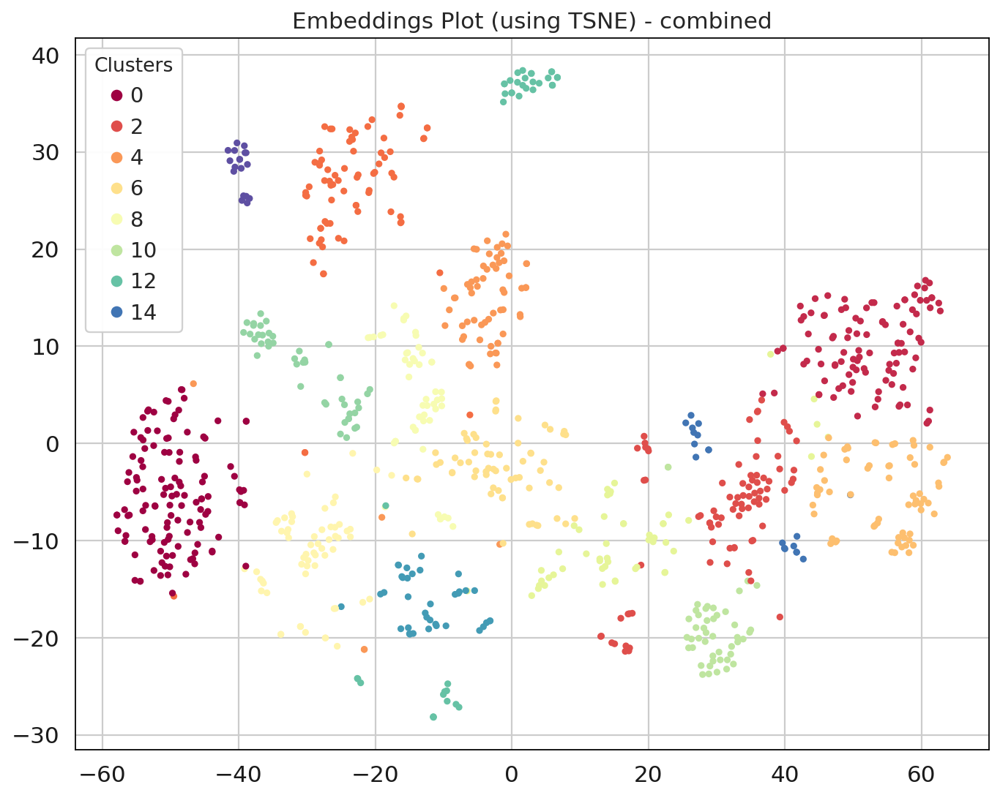

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(
/home/jovy

In [ ]:
# Perform a test across different layer contributions to semantic relations
from transformers import T5Tokenizer, T5ForConditionalGeneration
# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

sem_model_params = {
    'model_name': 'dmis-lab/biobert-v1.1',  # Custom model
    'batch_size': 256,  # Custom batch size
    'max_length': 256,  # Custom maximum token length
    'combine': True,  # Whether to combine text from multiple columns
    'pooling_strategy': 'mean'#'attention_weighted'  # Use mean/max pooling
}
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']

df = df[descriptors]

# Define your layer combinations here, e.g., [(0, 3), (4, 7), (8, 11), (0, 11)]
layer_combinations = [(0, 4), (4, 8), (8, 11), (0, 11)]

experiment_results_df = run_experiment_with_summarization(df, descriptors, layer_combinations, sem_model_params, sample_size=0.025)

print(experiment_results_df)

In [60]:
experiment_results_df

[{'layers': (0, 4),
  'summaries':     Cluster                                            Summary
  0         4  antineoplastic and immunomolecular agents. ant...
  1         2  antineoplastic and immunomodulating agents. ty...
  2        13  NERVOUS SYSTEM. PSYCHOANALEPTICS. ANTIDEPRESSA...
  3         0  a m molecule component generation drug contain...
  4         5  cAMP accumulation is a non-selective beta-adre...
  5        12  carbonic anhydrase inhibitors. carbonic anhydr...
  6         9        NERVOUS SYSTEM. Other NERVOUS SYSTEM DRUGS.
  7         1  local human for ion be control acid after divi...
  8        10  beta-blockers are non-selective. pA2 is a mole...
  9         8  genito urinary SYSTEM and sex hormones. hPR an...
  10       16  antagonist activity at AR in human LNCAP cells...
  11        3  qHTS: a qHTS-based sensitivity assay for a sex...
  12       17  genito urinary system and sex hormones. antiin...
  13        6  ANTINEOPLASTIC AND IMMUNOMODULATING AGENTS

In [ ]:
pd.set_option('display.max_colwidth', 50)
print(labels_df_T5)

In [ ]:
labels_df_T5

In [ ]:
# sem_model_params = {
#     'model_name': 'dmis-lab/biobert-v1.1',  # Custom model
#     'batch_size': 256,  # Custom batch size
#     'max_length': 256,  # Custom maximum token length
#     'combine': True,  # Whether to combine text from multiple columns
#     #'all_layers':False 
#     'layer_range':(4,12),
#     #'layer_index': -10,  # Use the second to last layer
#     'pooling_strategy': 'attention_weighted'#'attention_weighted'  # Use mean/max pooling
# }
# # Load the SciSpaCy model
# nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# #nlp = en_core_sci_md.load(disable=["parser", "ner"])# tagger,exclude=["lemmatizer"]
# # nlp.add_pipe("morphologizer")
# nlp.max_length = 2000000

# embeddings_dict,attention_dict = generate_embeddings(df, descriptors, **sem_model_params)
# print(embeddings_dict[list(embeddings_dict.keys())[-1]].shape)
# methods = ['TSNE']#UMAP'
# for x in methods: 
#     results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict,method=x)
# connectivity_matrix = generate_knn_graph(embeddings_dict['combined'])

# V3

In [ ]:
df = filtered_df.copy()
descriptors = ['assays|description',
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description',
               'drug_mechanism|mechanism_of_action', 
               'drug_mechanism|action_type', 
               'db_x_GO_CLASSIFICATION|path']

df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]
df['molecule_dictionary|chembl_id'].to_csv('keep_drugs.csv')
# Define parameters for the model and processing
sem_model_params = {
    'model_name': 'dmis-lab/biobert-v1.1',  # Using BioBERT for biomedical text
    'batch_size': 256,  # Processing texts in batches of 256
    'max_length': 256,  # Truncating/padding texts to 256 tokens
    'combine': True,  # Combining texts from multiple columns before processing
    'layer_range': (4, 11),  # Pooling attention scores from layers 4 to 12
    'pooling_strategy': 'mean',  # Using mean pooling for embeddings
    'top_n': 30  # Extracting top 15 tokens based on attention
}


# Load the SciSpaCy model
nlp = en_core_sci_md.load(disable=[ "parser", "ner"])
# nlp.add_pipe("morphologizer")
nlp.max_length = 2000000
df = df[descriptors]
# Sample of your DataFrame 'df' for testing
sampled_df = df

# Assuming 'df' is your DataFrame and 'columns' is the list of text columns to process
columns = descriptors
emb_results = generate_embeddings_and_attention(sampled_df, columns, **sem_model_params)

# The results dictionary contains embeddings and top tokens
embeddings_dict = emb_results['embeddings']
top_tokens_dict = emb_results['top_tokens']

results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=30, min_dist=0.1, n_components=2, clustering_method='leiden')

import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

# Build sentence descriptions for a given column and its top tokens
column_name = 'combined'  # Example column
top_tokens = top_tokens_dict[column_name] 
sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
sampled_df[column_name] = sampled_df[column_name].str.replace('nan','')
original_texts = sampled_df[column_name]

# Aggregate top tokens by cluster using the cluster labels
cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

# Prepare input text for each cluster
input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

# Generate summaries for each cluster
cluster_summaries = {}
for cluster, input_text in input_texts_for_clusters.items():
    summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
    cluster_summaries[cluster] = summary

# Construct DataFrame
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)


Generating KNN


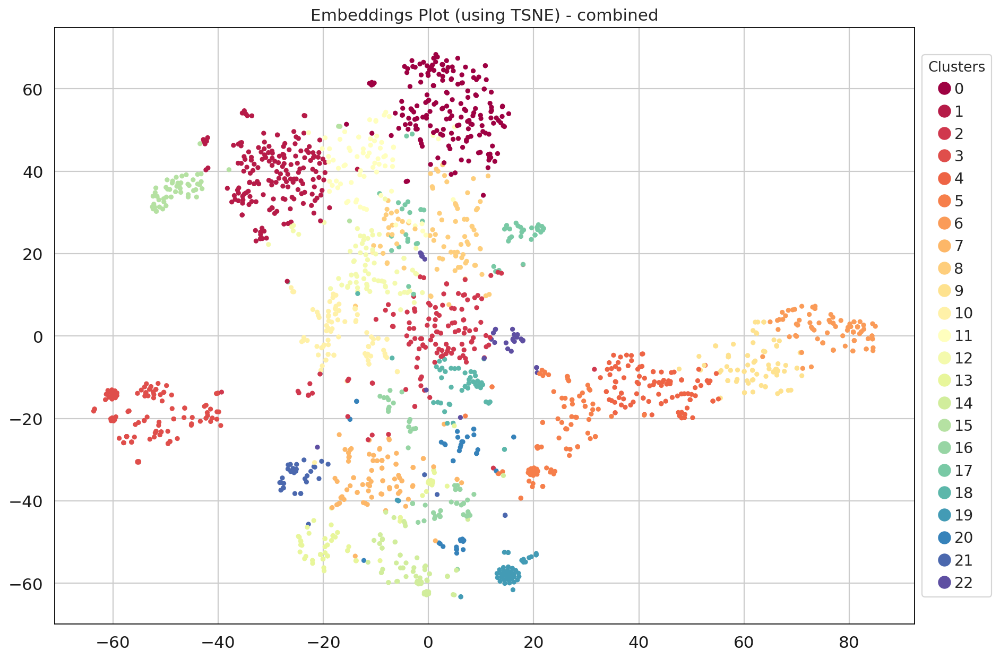

    Cluster                                            Summary
0         2  contain v simultaneously block human ion scree...
1         3  human b activate pathway outcome via navigate ...
2         0  human b activate pathway outcome via mm naviga...
3         1  local human b activate pathway outcome via mm ...
4        17  human ion disease is a pulmonary disease that ...
5         8  acetylcholinesterase inhibitors are used to in...
6        16  qhts assay inhibitors bloomaposs syndrome heli...
7        11  ion jump space z organization center confirm n...
8        10  human pathology is a complex of a number of ge...
9         7  histamine h1 receptor antagonist. antagonist. ...
10        5  local block human ion n organization um outcom...
11       23  antiepileptics. antiepileptics. carboxamide de...
12       21  contain local v human ion pub disease outcome ...
13       19  human for ion space organization via um outcom...
14       15  beta2 adrenergic receptor agonist. agonist

In [274]:
results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings_dict, method='TSNE', n_neighbors=30, min_dist=0.1, n_components=2, clustering_method='leiden')
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)

In [297]:
df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
# filter DF for relevant drugs
adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]
df['molecule_dictionary|chembl_id'].to_csv('keep_drugs.csv')

In [298]:
keep_drugs = df['molecule_dictionary|chembl_id']

In [299]:
keep_drugs

0       CHEMBL1002
1       CHEMBL1004
2       CHEMBL1008
3       CHEMBL1009
4        CHEMBL101
           ...    
2465     CHEMBL989
2466     CHEMBL991
2467     CHEMBL995
2468    CHEMBL9967
2469     CHEMBL998
Name: molecule_dictionary|chembl_id, Length: 1883, dtype: object

In [282]:
df.shape

(2470, 9)

In [275]:
embeddings_dict['combined'].shape

(1883, 768)

In [140]:
weights_dic['SLLM']

array(<38181x38181 sparse matrix of type '<class 'numpy.float64'>'
	with 572715 stored elements in Compressed Sparse Row format>,
      dtype=object)

In [141]:
# embeddings_combined =  generate_embeddings(df, combine=True,columns=descriptors)
# embeddings_dict = generate_embeddings(df, columns=descriptors)

In [142]:
# similarity_matrix_df = calculate_similarity_matrix(embeddings_dict)
# similarity_matrix_df.to_csv('semantics_similarity_matrix.csv')

In [143]:
embeddings_dict

{'combined': array([[ 0.03942404, -0.07268759, -0.424528  , ..., -0.13911518,
          0.19940841,  0.22521396],
        [-0.00074003, -0.16183591, -0.5684055 , ..., -0.1785612 ,
          0.04663793,  0.3365327 ],
        [ 0.01746507, -0.1254557 , -0.28656992, ...,  0.18641573,
          0.02233614,  0.11592761],
        ...,
        [ 0.0612883 , -0.20660876, -0.5446938 , ..., -0.22386   ,
          0.02617588,  0.20061143],
        [ 0.1432468 ,  0.04704822, -0.4277961 , ...,  0.11945362,
         -0.02740093,  0.12206519],
        [ 0.14505255, -0.1600025 , -0.38262624, ...,  0.13980922,
         -0.01843744,  0.18691339]], dtype=float32)}

In [144]:
# similarity_matrix_df_com = calculate_similarity_matrix(embeddings_combined)
# similarity_matrix_df_com.to_csv('semantics_similarity_matrix_com.csv')

In [145]:
# similarity_matrix_df_com

In [237]:
# Assign weights & embeddings
embeddings_dic['SLLM'] = embeddings_dict
embeddings_dic['SLLM_database'] = df
weights_dic['SLLM'] = (knn_graph)

In [162]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'sem_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dict, f)

In [163]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
tokens_filename = 'top_tokens.pkl'

# Save the embeddings dictionary to a .pkl file
with open(tokens_filename, 'wb') as f:
    pickle.dump(top_tokens_dict, f)


In [164]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'all_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dic, f)
    
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
weights_dic_filename = 'all_weights.pkl'

# Save the embeddings dictionary to a .pkl file
with open(weights_dic_filename, 'wb') as f:
    pickle.dump(weights_dic, f)

In [165]:
embeddings_dict['combined'].shape

(1883, 768)

# V1 Module 5: Molecular structure casual semantics with attention

## BERT loves chemistry
### Rationale and Approach for Utilising ChemBERTa in Drug Clustering

#### Background
ChemBERTa, a variant of the BERT model adapted for chemical data, leverages the transformer architecture to capture the semantic essence of molecules encoded as SMILES strings. This adaptation enables the model to learn complex patterns within chemical structures, facilitating a deeper understanding of molecular properties and relationships. The model's ability to generate semantically rich embeddings from SMILES strings positions it as a powerful tool in cheminformatics, particularly in tasks such as drug clustering where understanding subtle differences and similarities between molecules is crucial.

#### Methodology
The approach involves preprocessing a dataset of drugs, where each row represents a unique drug and includes a column of SMILES strings encoding the molecular structure. These strings serve as input to the ChemBERTa model, which generates high-dimensional embeddings reflecting the semantic and structural features of each molecule. The process capitalizes on the model's pre-training on extensive chemical databases, ensuring that the embeddings encapsulate a broad spectrum of chemical knowledge.

#### Embedding Generation
For each SMILES string, the ChemBERTa tokenizer converts the chemical language into a format understandable by the model, maintaining the integrity of molecular structures. The model then processes these tokenized inputs, outputting embeddings that serve as a numerical representation of the molecules' semantic properties. These embeddings are aggregated, typically by averaging, to produce a singular vector that encapsulates the essence of each molecule's structure and potential function.

#### Similarity Matrix Construction
With the embeddings generated, a similarity matrix is computed, typically using cosine similarity measures. This matrix quantifies the pairwise similarities between all drugs in the dataset, providing a foundation for clustering algorithms to identify groups of drugs with similar molecular characteristics. The similarity matrix serves as a kernel, with its values indicating the degree of similarity between drug pairs, thereby guiding the clustering process.

#### Application in Drug Clustering
The utility of ChemBERTa in this context lies in its ability to discern intricate molecular similarities that might be overlooked by traditional clustering methods. By grounding the clustering process in semantically meaningful embeddings, the approach facilitates the identification of clusters based on deep molecular insights. This methodology is particularly beneficial in drug discovery and repurposing, where understanding nuanced molecular relationships can unveil new therapeutic potentials.

#### Conclusion
In summary, leveraging ChemBERTa for generating molecular embeddings introduces a novel dimension to drug clustering, enriching the analysis with deep semantic understanding of molecular structures. This approach exemplifies the integration of advanced NLP techniques in cheminformatics, paving the way for more informed and nuanced analyses in drug discovery and development processes.

### References
- The original BERT model and its applications in NLP: Devlin et al., 2018.
- ChemBERTa and its adaptation for chemical data: Chithrananda et al., "ChemBERTa: Large-Scale Self-Supervised Pretraining for Molecular Property Prediction," 2020.
- Applications of molecular embeddings in cheminformatics: [Digital Discovery (RSC Publishing) DOI:10.1039/D3DD00119A](https://pubs.rsc.org/en/content/articlelanding/2022/dd/d3dd00119a).

In [166]:
# pip install transformers
# pip install rdkit-pypi
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem

In [167]:
import pandas as pd
from transformers import AutoTokenizer, AutoModel  # Changed from AutoModelForMaskedLM to AutoModel
import torch
import numpy as np

def load_chemberta_model_and_tokenizer(model_name="seyonec/ChemBERTa-zinc-base-v1"):
    """
    Load the ChemBERTa model and its tokenizer.
    """
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name)  # Changed from AutoModelForMaskedLM to AutoModel
    return tokenizer, model

from tqdm.auto import tqdm  # Import tqdm for progress bars

def generate_chemberta_embeddings(df, column, tokenizer, model):
    """
    Generate embeddings for SMILES strings in a DataFrame column using ChemBERTa.

    Parameters:
    - df: DataFrame containing the SMILES strings.
    - column: The column name in the DataFrame containing SMILES strings.
    - tokenizer: Tokenizer for ChemBERTa.
    - model: Pre-trained ChemBERTa model.

    Returns:
    - embeddings: NumPy array of embeddings.
    """
    embeddings = []
    for smiles in tqdm(df[column], desc="Generating embeddings"):  # Add a tqdm progress bar
        # Tokenize the SMILES string and prepare input tensors
        inputs = tokenizer(smiles, return_tensors="pt", padding=True, truncation=True, max_length=512)

        # Generate model output
        with torch.no_grad():
            outputs = model(**inputs)

        # Extract embeddings, using the last hidden states
        last_hidden_states = outputs.last_hidden_state
        
        # Aggregate the embeddings, for example, by taking the mean
        smile_embedding = torch.mean(last_hidden_states, dim=1).squeeze().numpy()
        embeddings.append(smile_embedding)
    
    return np.array(embeddings)



# V2 

In [168]:
import pandas as pd
from transformers import AutoTokenizer, AutoModel
import torch
import numpy as np
from tqdm.auto import tqdm

models_dict = {
    "seyonec/ChemBERTa-zinc-base-v1": "ChemBERTa model trained on the ZINC database.",
    "seyonec/ChemBERTa-zinc250k-v2": "A larger ChemBERTa model for potentially capturing more complex chemical relationships.",
    "seyonec/PubChem10M_SMILES_BPE_450k": "ChemBERTa model trained on a diverse set of molecules from PubChem.",
    "BenevolentAI/MolBERT": "MolBERT model for learning representations of molecular structures.",
    "Dlux/SMILES-Transformer": "SMILES Transformer model for capturing the syntax and semantics of SMILES notations."
}

def load_model_and_tokenizer(model_name):
    """
    Load the ChemBERTa model and its tokenizer.
    """
    tokenizer = AutoTokenizer.from_pretrained(model_name)
    model = AutoModel.from_pretrained(model_name)
    return tokenizer, model

def generate_embeddings(df, column, tokenizer, model, batch_size=32):
    """
    Generate embeddings for SMILES strings in a DataFrame column using ChemBERTa.

    Parameters:
    - df: DataFrame containing the SMILES strings.
    - column: The column name in the DataFrame containing SMILES strings.
    - tokenizer: Tokenizer for ChemBERTa.
    - model: Pre-trained ChemBERTa model.

    Returns:
    - embeddings: NumPy array of embeddings.
    """
    embeddings = []
    for i in tqdm(range(0, len(df), batch_size), desc="Generating embeddings"):
        batch = df[column].iloc[i:i + batch_size].tolist()
        inputs = tokenizer(batch, return_tensors="pt", padding=True, truncation=True, max_length=512)
        with torch.no_grad():
            outputs = model(**inputs)
        batch_embeddings = torch.mean(outputs.last_hidden_state, dim=1).squeeze().cpu().numpy()
        embeddings.append(batch_embeddings)
    return np.vstack(embeddings)

Generating KNN


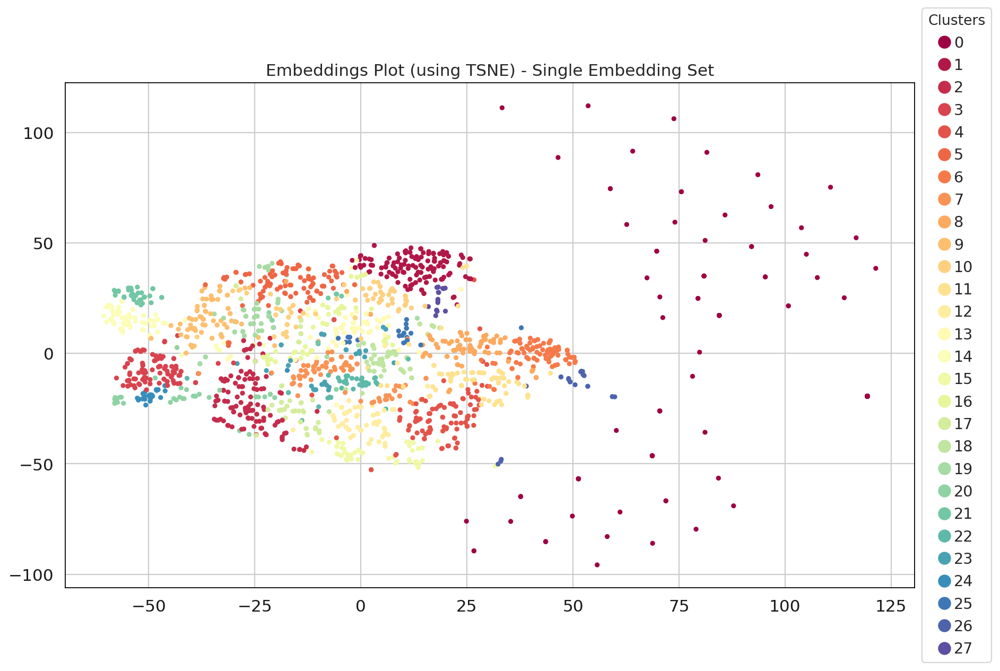

In [239]:
# filter DF for relevant drugs
df = filtered_df.copy()


adata.uns['drug2cell'].var['chembl'] = adata.uns['drug2cell'].var.index.str.split('|').str[0]
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata.uns['drug2cell'].var['chembl'])]

descriptors = ['db_x_smiles|canonical_smiles']

df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
print(df.head)
# Assuming 'df' is your DataFrame and 'smiles_column' is the column with SMILES strings
tokenizer, model = load_model_and_tokenizer('seyonec/ChemBERTa-zinc-base-v1')
embeddings = generate_chemberta_embeddings(df, 'db_x_smiles|canonical_smiles', tokenizer, model)

# Now 'embeddings' contains the ChemBERTa embeddings for the SMILES strings in your DataFrame column

results, knn_graph, cluster_labels = plot_embeddings_neighborhood(embeddings, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')

In [259]:
embeddings.shape

(1883, 768)

In [262]:
len(cluster_labels)

1883

In [240]:
# Assign weights & embeddings
embeddings_dic['CBERT'] = embeddings
weights_dic['CBERT'] = knn_graph

In [241]:
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
embeddings_filename = 'all_embeddings.pkl'

# Save the embeddings dictionary to a .pkl file
with open(embeddings_filename, 'wb') as f:
    pickle.dump(embeddings_dic, f)
    
import pickle
# Assuming 'embeddings_dict' is your embeddings dictionary
weights_dic_filename = 'all_weights.pkl'

# Save the embeddings dictionary to a .pkl file
with open(weights_dic_filename, 'wb') as f:
    pickle.dump(weights_dic, f)

# Integration

# Let's attempt: WNN


# D2C modules

# Module 2: Drug_state_usage_profiles
- Learn some representation of drug-gene prediction profiles acrtoss cells. 

In [260]:
df = filtered_df.copy()
df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )

In [261]:
df

,molecule_dictionary|chembl_id,db_x_smiles|canonical_smiles
0,CHEMBL1002,ccccncchoc1cccoccoc1
1,CHEMBL1004,cncccoccc1ccccc1c1ccccn1
2,CHEMBL1008,ccccocccncc1ccccc1c1ccccc1n1cccc1
3,CHEMBL1009,nchcc1cccococ1coo
4,CHEMBL101,ccccc1conc2ccccc2nc2ccccc2c1o
...,...,...
2465,CHEMBL989,cc1coch2cch3ch4cchfc5ccoccc5cc4fchocc3cc2cocoo1
2466,CHEMBL991,cc1cnch2ccchcoo2conhc1o
2467,CHEMBL995,ccccc1ncclccon1cc1cccc2ccccc2c2nnnn2cc1k
2468,CHEMBL9967,cn1ccnccon2c3ccccc3conc3cccnc32cc1


In [314]:
adata = sc.read('/nfs/team205/ig7/projects/SCC_nano_string/drug2state/D2C_KH_SCC_PS_EZ_HL.h5ad')
# adata.uns['drug2cell'].T
adata_tt = adata.T #flip the data to access pca by drugs instead of by cell               

/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/anndata/__init__.py:55: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [315]:
adata_tt.obs['chembl'] = adata_tt.obs.index.str.split('|').str[0]
adata_tt = adata_tt[adata_tt.obs['chembl'].isin(keep_drugs)]

In [316]:
sc.pp.pca(adata_tt)
sc.pp.neighbors(adata_tt, n_neighbors=15, method='umap', metric='euclidean', key_added=None, copy=False)
# Assign weights & embeddings
embeddings_dic['DSU'] = adata_tt.obsm['X_pca']
weights_dic['DSU'] = adata_tt.obsp['connectivities']

computing PCA
    with n_comps=50


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/preprocessing/_pca.py:229: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm['X_pca'] = X_pca


    finished (0:03:32)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [317]:
adata_tt

AnnData object with n_obs × n_vars = 1883 × 499758
    obs: 'genes', 'all_genes', 'chembl'
    var: 'sample_id', 'mad_prd', 'Status', 'Site', 'Tissue', 'Enrichment', 'Location', 'Sex', 'Age', 'stage', 'full_clustering', 'level3_celltype', 'tum.norm', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'patient', 'level1_celltype', 'level2_celltype', 'batch_id', 'auto_prd', 'batch', 'n_genes'
    uns: 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [318]:
pd.DataFrame(adata_tt.obs.index.str.split('|').str[0]).to_csv('keep_drugs_A2_V6.csv')

In [319]:
weights_dic

{'GSO': array([[1.44227488e-03, 5.30583276e-04, 5.30583276e-04, ...,
         5.30583276e-04, 5.30583276e-04, 5.30583276e-04],
        [4.32807274e-04, 6.42342948e-02, 4.32807274e-04, ...,
         4.32807274e-04, 4.32807274e-04, 4.32807274e-04],
        [6.94397184e-12, 6.94397184e-12, 4.99999993e-01, ...,
         6.94397184e-12, 6.94397184e-12, 6.94397184e-12],
        ...,
        [4.74260591e-04, 4.74260591e-04, 4.74260591e-04, ...,
         9.52577862e-03, 4.74260591e-04, 4.74260591e-04],
        [4.71619052e-04, 4.71619052e-04, 4.71619052e-04, ...,
         4.71619052e-04, 9.47272187e-03, 4.71619052e-04],
        [3.18753622e-04, 3.18753622e-04, 3.18753622e-04, ...,
         3.18753622e-04, 3.18753622e-04, 1.74033581e-02]]),
 'DSU': <1883x1883 sparse matrix of type '<class 'numpy.float32'>'
 	with 35182 stored elements in Compressed Sparse Row format>,
 'SLLM': array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
   

In [320]:
# import torch
# import numpy as np
# import scipy.sparse as sp
# from torch_geometric.data import Data
# from torch_geometric.nn import GCNConv
# import torch.nn.functional as F
# from torch_geometric.utils import negative_sampling, train_test_split_edges, to_undirected

# def matrix_to_graph(similarity_matrix):
#     """
#     Converts a similarity matrix to a graph object, ensuring the edge_index tensor is correctly formatted.
#     """
#     if isinstance(similarity_matrix, np.ndarray):
#         src, dst = np.where(similarity_matrix != 0)
#         edge_attr = torch.tensor(similarity_matrix[src, dst], dtype=torch.float)
#     elif sp.issparse(similarity_matrix):
#         similarity_matrix = similarity_matrix.tocoo()
#         src, dst = similarity_matrix.row, similarity_matrix.col
#         edge_attr = torch.tensor(similarity_matrix.data, dtype=torch.float)
#     else:
#         raise TypeError("Unsupported similarity matrix type.")

#     edge_index = torch.tensor([src, dst], dtype=torch.long)
#     num_nodes = max(src.max(), dst.max()) + 1
#     x = torch.eye(num_nodes)
    
#     return Data(x=x, edge_index=edge_index, edge_attr=edge_attr)


# class GCNLinkPrediction(torch.nn.Module):
#     """
#     GCN model with link prediction capability.
#     """
#     def __init__(self, num_features, hidden_dim, output_dim):
#         super(GCNLinkPrediction, self).__init__()
#         self.conv1 = GCNConv(num_features, hidden_dim)
#         self.conv2 = GCNConv(hidden_dim, output_dim)

#     def forward(self, data):
#         x, edge_index = data.x, data.edge_index
#         x = F.relu(self.conv1(x, edge_index))
#         x = self.conv2(x, edge_index)
#         return x

# def train_and_predict(model, data, optimizer, epochs=100):
#     """
#     Trains the model and performs link prediction.
#     """
#     for epoch in range(epochs):
#         model.train()
#         optimizer.zero_grad()
#         z = model(data)
#         pos_edge_index = data.pos_edge_label_index
#         neg_edge_index = negative_sampling(edge_index=data.edge_index, num_nodes=data.num_nodes,
#                                            num_neg_samples=pos_edge_index.size(1))
#         pos_pred = (z[pos_edge_index[0]] * z[pos_edge_index[1]]).sum(dim=1)
#         neg_pred = (z[neg_edge_index[0]] * z[neg_edge_index[1]]).sum(dim=1)
#         loss = F.binary_cross_entropy_with_logits(torch.cat([pos_pred, neg_pred]), 
#                                                   torch.cat([torch.ones(pos_pred.size(0)), torch.zeros(neg_pred.size(0))]))
#         loss.backward()
#         optimizer.step()

# # Convert similarity matrices to graph objects and prepare them for link prediction
# graphs = []
# for key in weights_dic:
#     graph = matrix_to_graph(weights_dic[key])
#     graph.edge_index = to_undirected(graph.edge_index)  # Make sure edges are undirected
#     graph = train_test_split_edges(graph)
#     graphs.append(graph)

# # Initialize model and optimizer
# model = GCNLinkPrediction(num_features=graphs[0].num_nodes, hidden_dim=128, output_dim=64)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# # Train model and generate embeddings
# embeddings = []
# for graph in graphs:
#     train_and_predict(model, graph, optimizer)
#     with torch.no_grad():
#         embeddings.append(model(graph))


In [326]:
weights_dic_back  = weights_dic

In [327]:
weights_dic_back.keys()

dict_keys(['GSO', 'DSU', 'SLLM', 'CBERT'])

In [328]:
weights_dic['DSU'].shape

(1883, 1883)

In [329]:
weights_dic

{'GSO': array([[1.44227488e-03, 5.30583276e-04, 5.30583276e-04, ...,
         5.30583276e-04, 5.30583276e-04, 5.30583276e-04],
        [4.32807274e-04, 6.42342948e-02, 4.32807274e-04, ...,
         4.32807274e-04, 4.32807274e-04, 4.32807274e-04],
        [6.94397184e-12, 6.94397184e-12, 4.99999993e-01, ...,
         6.94397184e-12, 6.94397184e-12, 6.94397184e-12],
        ...,
        [4.74260591e-04, 4.74260591e-04, 4.74260591e-04, ...,
         9.52577862e-03, 4.74260591e-04, 4.74260591e-04],
        [4.71619052e-04, 4.71619052e-04, 4.71619052e-04, ...,
         4.71619052e-04, 9.47272187e-03, 4.71619052e-04],
        [3.18753622e-04, 3.18753622e-04, 3.18753622e-04, ...,
         3.18753622e-04, 3.18753622e-04, 1.74033581e-02]]),
 'DSU': array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.16329859, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.       

In [332]:
weights_dic['DSU'] =np.array(weights_dic['DSU'].todense())
weights_dic['SLLM'] =np.array(weights_dic['SLLM'].todense())
weights_dic['CBERT'] =  np.array(weights_dic['CBERT'].todense())

In [342]:
keys_int = ['DSU','SLLM']
int_weights_dic = {key: weights_dic[key] for key in keys_int if key in weights_dic}

In [413]:
keys_int = ['DSU','SLLM']
embeddings_dic = {key: embeddings_dic[key] for key in keys_int if key in embeddings_dic}
embeddings_dic

{'DSU': array([[-1.2044158e+02, -2.5504442e+01,  1.5866807e+01, ...,
         -8.8737427e+01, -1.1066239e+02,  6.0390270e+01],
        [-2.3815001e+02, -3.6571198e+01,  1.8430952e+01, ...,
          4.7784176e+00, -4.6291313e+00, -8.8619643e-01],
        [ 7.4592506e+01, -3.7610664e+01, -1.1072499e+02, ...,
          2.2636236e+01,  4.5601494e+01, -2.0706465e+01],
        ...,
        [-2.3642363e+02, -3.7035744e+01,  1.7674204e+01, ...,
          5.1438990e+00, -4.9116068e+00, -1.6394593e+00],
        [-2.4018216e+02, -3.7131199e+01,  1.7863909e+01, ...,
          5.4643688e+00, -3.6447451e+00, -1.3309687e+00],
        [-9.7978683e+01, -3.5685184e+01,  2.7824572e+01, ...,
         -6.7014928e+00,  3.7611015e-02, -1.0839438e+00]], dtype=float32),
 'SLLM': {'combined': array([[ 0.08139955, -0.05704261, -0.43720964, ..., -0.15884535,
           0.19812919,  0.22854818],
         [ 0.00560862, -0.17121002, -0.5774389 , ..., -0.17967255,
           0.04174213,  0.34110793],
         [ 0.01

In [422]:
from mofapy2.run.entry_point import entry_point

In [426]:
embeddings_dic['SLLM'] = embeddings_dic['SLLM']['combined']

In [428]:
embeddings_dic

{'DSU': array([[-1.2044158e+02, -2.5504442e+01,  1.5866807e+01, ...,
         -8.8737427e+01, -1.1066239e+02,  6.0390270e+01],
        [-2.3815001e+02, -3.6571198e+01,  1.8430952e+01, ...,
          4.7784176e+00, -4.6291313e+00, -8.8619643e-01],
        [ 7.4592506e+01, -3.7610664e+01, -1.1072499e+02, ...,
          2.2636236e+01,  4.5601494e+01, -2.0706465e+01],
        ...,
        [-2.3642363e+02, -3.7035744e+01,  1.7674204e+01, ...,
          5.1438990e+00, -4.9116068e+00, -1.6394593e+00],
        [-2.4018216e+02, -3.7131199e+01,  1.7863909e+01, ...,
          5.4643688e+00, -3.6447451e+00, -1.3309687e+00],
        [-9.7978683e+01, -3.5685184e+01,  2.7824572e+01, ...,
         -6.7014928e+00,  3.7611015e-02, -1.0839438e+00]], dtype=float32),
 'SLLM': array([[ 0.08139955, -0.05704261, -0.43720964, ..., -0.15884535,
          0.19812919,  0.22854818],
        [ 0.00560862, -0.17121002, -0.5774389 , ..., -0.17967255,
          0.04174213,  0.34110793],
        [ 0.01746507, -0.125455

In [427]:
# Initialize the MOFA model
mofa_model = entry_point()
mofa_model.set_data_options(scale_groups=False, scale_views=False)
mofa_model.set_model_options(factors=10)
mofa_model.set_train_options(iter=1000)
mofa_model.set_data_matrix(embeddings_dic)  # Your dictionary of embeddings

# Train the model
mofa_model.build()
mofa_model.run()

# Extract the learned factors
factors = mofa_model.get_factors()


        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        


KeyError: 'G'

In [418]:
dsu_embeddings = embeddings_dic['DSU']
sllm_combined_embeddings = embeddings_dic['SLLM']['combined']
from sklearn.cross_decomposition import CCA

# Initialize CCA with the desired number of components
# n_components should be <= min(dsu_embeddings.shape[1], sllm_combined_embeddings.shape[1])
n_components = min(dsu_embeddings.shape[1], sllm_combined_embeddings.shape[1]) // 2  # Example to take half of the minimum dimension

cca = CCA(n_components=n_components)

# Fit and transform the embeddings
dsu_c = cca.fit_transform(dsu_embeddings, sllm_combined_embeddings)


In [419]:
results, knn_graph, cluster_labels = plot_embeddings_neighborhood(dsu_c, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')

Generating KNN


ValueError: Found array with dim 3. NearestNeighbors expected <= 2.

Generating KNN


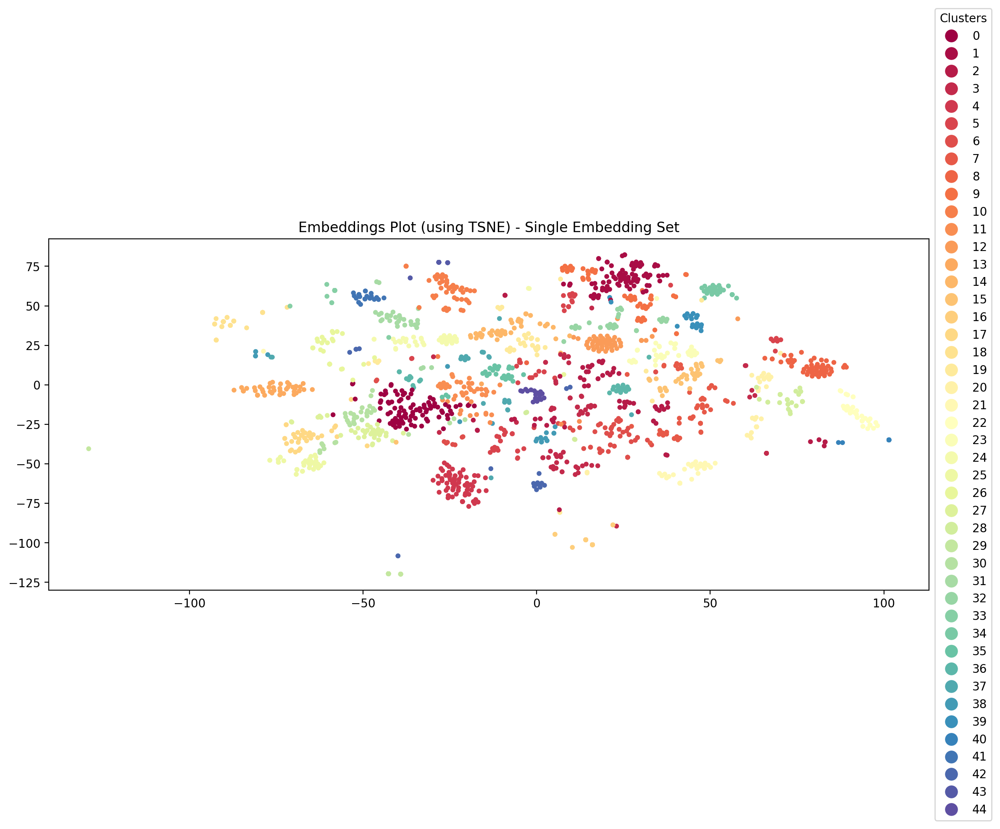

In [416]:
results, knn_graph, cluster_labels = plot_embeddings_neighborhood(dsu_c, method='TSNE', n_neighbors=15, min_dist=0.1, n_components=2, clustering_method='leiden')

In [334]:
int_weights_dic

{'DSU': array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.16329859, 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.16329859, 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 'SLLM': array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 0., 1., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 1., 0., 0.],
        [0., 0., 0., ..., 0., 1., 1.],
        [0., 0., 1., ..., 0., 0., 1.]]),
 'CBERT': array([[1., 0., 0., ..., 0., 0., 0.],
        [0., 1., 0., ..., 0., 0., 0.],
        [0., 1., 1., ..., 0., 0., 0.],
    

In [335]:
int_weights_dic['CBERT'].shape

(1883, 1883)

In [351]:
# Convert the dictionary values to a list of arrays
arrays = list(int_weights_dic.values())

# Stack arrays vertically and calculate the mean across the first axis
int_matrix = np.mean(np.array(arrays), axis=0)
np.fill_diagonal(int_matrix, 1)
# Function to filter top n neighbors for each row/column
def filter_top_n_neighbors(matrix, n):
    # Initialize the output matrix with zeros
    filtered_matrix = np.zeros_like(matrix)
    
    # Iterate over each row
    for i in range(matrix.shape[0]):
        # Get indices of top n values in the row
        top_n_indices = np.argsort(matrix[i])[-n:]
        
        # Set those top n values in the output matrix (for both row and column to ensure symmetry)
        for idx in top_n_indices:
            filtered_matrix[i, idx] = matrix[i, idx]
            filtered_matrix[idx, i] = matrix[idx, i]
    
    return filtered_matrix

# Filter the mean matrix for the top 2 neighbors
filtered_matrix = filter_top_n_neighbors(int_matrix, 10)
fil_mat = pd.DataFrame(filtered_matrix,index=adata_tt.obs.index,columns = adata_tt.obs.index)
fil_mat.head(5)

,CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,CHEMBL3989924|LUTETIUM DOTATATE LU-177,CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,CHEMBL256997|ATALUREN,CHEMBL1201556|BECAPLERMIN,CHEMBL1200689|NITRIC OXIDE,CHEMBL2010601|IVACAFTOR,CHEMBL1229908|ETHAMIVAN,CHEMBL1255943|GLUTAMIC ACID HYDROCHLORIDE,CHEMBL1261|CITRIC ACID,...,CHEMBL3833384|EFLAPEGRASTIM,CHEMBL1200343|PERINDOPRIL ERBUMINE,"CHEMBL1201466|ESTROGENS, CONJUGATED SYNTHETIC A",CHEMBL3989521|ISOPROTERENOL SULFATE,CHEMBL2068724|ACAMPROSATE CALCIUM,CHEMBL306823|SODIUM DICHLOROACETATE,CHEMBL2218917|CEVIMELINE HYDROCHLORIDE,CHEMBL2062257|BRIMONIDINE TARTRATE,CHEMBL1200479|DICYCLOMINE HYDROCHLORIDE,CHEMBL1590946|CEFSULODIN SODIUM
CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER,1.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.5,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CHEMBL3989924|LUTETIUM DOTATATE LU-177,0.0,1.0,0.000000,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM,0.0,0.0,1.000000,0.0,0.121595,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CHEMBL256997|ATALUREN,0.0,0.0,0.000000,1.0,0.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
CHEMBL1201556|BECAPLERMIN,0.0,0.0,0.621595,0.0,1.000000,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [344]:
filtered_matrix

array([[1. , 0. , 0. , ..., 0. , 0. , 0. ],
       [0. , 1. , 0. , ..., 0. , 0. , 0. ],
       [0. , 0. , 1. , ..., 0. , 0. , 0. ],
       ...,
       [0. , 0. , 0. , ..., 1. , 0. , 0. ],
       [0. , 0. , 0. , ..., 0. , 1. , 0.5],
       [0. , 0. , 0. , ..., 0. , 0. , 1. ]])

In [345]:
plt.rcdefaults()

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden clustering
    finished: found 36 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1234: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


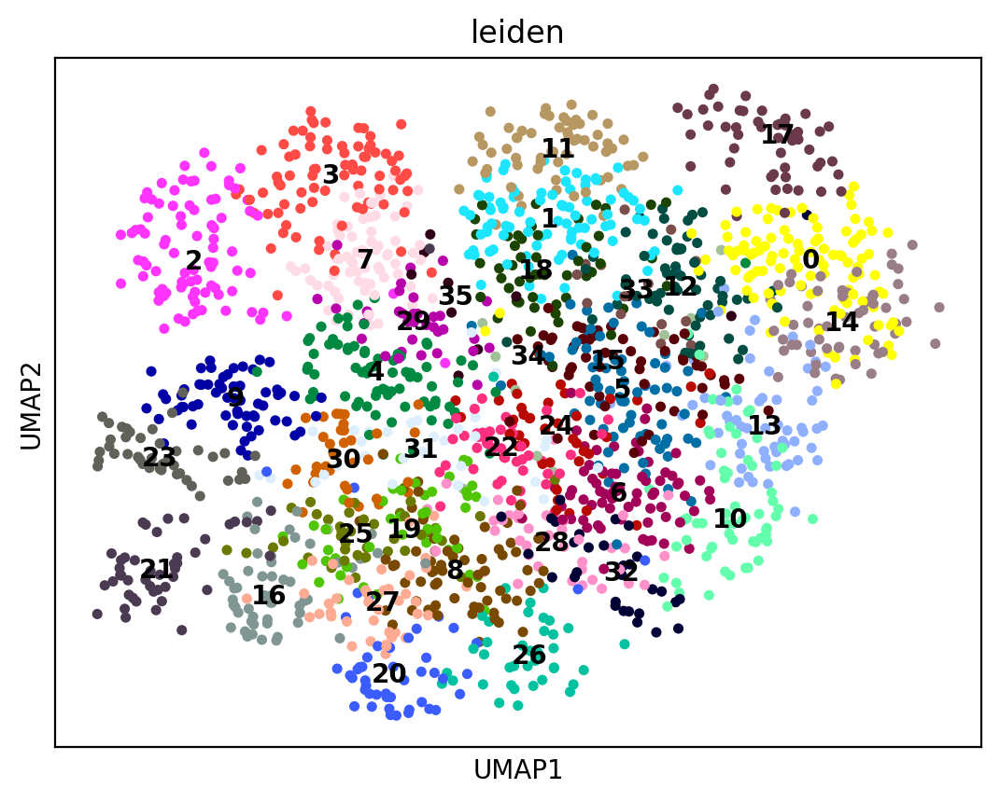

In [354]:
from scipy.sparse import csr_matrix
adata_tt.obsp['connectivities'] = csr_matrix(filtered_matrix)
sc.tl.umap(adata_tt,min_dist=0.5, spread=0.5)

# sc.tl.diffmap(adata_tt, n_comps=50,neighbors_key='neighbors', random_state=0, copy=False)
# sc.tl.paga(adata_tt, groups="leiden")
# sc.pl.paga(adata_tt,threshold=0.03, show=False)
# sc.tl.draw_graph(adata_tt, layout='fa', init_pos="paga", root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key='neighbors', obsp=None, copy=False)
# sc.tl.draw_graph(adata_tt, layout='drl', init_pos="paga", root=None, random_state=0, n_jobs=None, adjacency=None, key_added_ext=None, neighbors_key='neighbors', obsp=None, copy=False)

# bayes uncertainty: - in next iteration, create a GMM with num of comps == leiden clusters to assign cluster probability uncertainty to each node
sc.tl.leiden(adata_tt,resolution = 3)
sc.pl.umap(adata_tt,color = 'leiden',legend_loc='on data')
# sc.pl.diffmap(adata_tt,color = 'leiden')
# sc.pl.draw_graph(adata_tt,color = 'leiden', layout='fa')
# sc.pl.draw_graph(adata_tt,color = 'leiden', layout='drl')

In [350]:
adata_tt.obs['leiden']

CHEMBL1200797|TECHNETIUM TC 99M SUCCIMER               2
CHEMBL3989924|LUTETIUM DOTATATE LU-177                 7
CHEMBL2108709|COLLAGENASE CLOSTRIDIUM HISTOLYTICUM     0
CHEMBL256997|ATALUREN                                  0
CHEMBL1201556|BECAPLERMIN                              0
                                                      ..
CHEMBL306823|SODIUM DICHLOROACETATE                   12
CHEMBL2218917|CEVIMELINE HYDROCHLORIDE                 3
CHEMBL2062257|BRIMONIDINE TARTRATE                    11
CHEMBL1200479|DICYCLOMINE HYDROCHLORIDE                1
CHEMBL1590946|CEFSULODIN SODIUM                        1
Name: leiden, Length: 1883, dtype: category
Categories (18, object): ['0', '1', '2', '3', ..., '14', '15', '16', '17']

In [355]:
sampled_df = df
cluster_labels = np.array(adata_tt.obs['leiden'])

In [356]:
# Load T5 model and tokenizer
t5_model_name = "t5-base"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

# Build sentence descriptions for a given column and its top tokens
column_name = 'combined'  # Example column
top_tokens = top_tokens_dict[column_name] 
sampled_df[column_name] = (sampled_df[descriptors].apply(lambda x: '. '.join(x.dropna().astype(str)), axis=1)).astype(str)
sampled_df[column_name] = sampled_df[column_name].str.replace('nan','')
original_texts = sampled_df[column_name]

# Aggregate top tokens by cluster using the cluster labels
cluster_top_tokens = aggregate_top_tokens_by_cluster(top_tokens, cluster_labels)

# Prepare input text for each cluster
input_texts_for_clusters = prepare_input_text_for_cluster(cluster_top_tokens, original_texts.tolist(), cluster_labels)

# Generate summaries for each cluster
cluster_summaries = {}
for cluster, input_text in input_texts_for_clusters.items():
    summary = generate_text(input_text, max_length=50)  # You can adjust max_length as needed
    cluster_summaries[cluster] = summary

# Construct DataFrame
labels_df_T5 = pd.DataFrame(list(cluster_summaries.items()), columns=['Cluster', 'Summary'])
print(labels_df_T5)


Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(


   Cluster                                            Summary
0        6  polar s grow treatment dose membrane model let...
1       22  contain v human ion screening pub extend disea...
2       12  kv111 erg k channel open state k channel block...
3        0  cc inhibitors human d2 dopamine receptor hit v...
4       13  contain v human ion hunting pub value b activa...
5        1  human b activate pathway outcome via transport...
6       14  human filter l syndrome orphan probe product s...
7       20  local block ion disease organization center pa...
8       32  human block ion pub organization um center con...
9       24  p450cysteine inhibitors are a class of assays ...
10      17  qhts validation assay inhibitors bloomaposs sy...
11       3  ion determined p cell para decrease substrate ...
12       5  human ion ii is a stably induced inflammatory ...
13       2  sensory organs. ophthalmologicals. antiglaucom...
14       9  local block human ion pub n organization confi...
15      

In [ ]:
adata_tt.obs[adata_tt.obs['leiden'].isin(['33'])]

In [361]:
df = filtered_df.copy()
filtered_df.columns

# filter DF for relevant drugs
df['molecule_dictionary|chembl_id'] = df['molecule_dictionary|chembl_id'].astype(str)
df = df[df['molecule_dictionary|chembl_id'].isin(adata_tt.obs['chembl'])]

descriptors = [
               'atc_classification|level1_description',
               'atc_classification|level2_description',
               'atc_classification|level3_description',
               'atc_classification|level4_description','drug_mechanism|mechanism_of_action','drug_mechanism|tid','drug_mechanism|action_type','db_x_GO_CLASSIFICATION|path']

database_df = preprocess_columns_vectorized(df,descriptors,drug_name_column='molecule_dictionary|chembl_id' )
cluster_df = adata_tt.obs.copy()
cluster_df['chembl'] = cluster_df.index.str.split('|').str[0]

In [362]:
cluster_df['leiden'].unique()

['6', '22', '12', '0', '13', ..., '16', '7', '28', '21', '35']
Length: 36
Categories (36, object): ['0', '1', '2', '3', ..., '32', '33', '34', '35']

In [364]:
import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Assuming 'cluster_df' and 'database_df' are already defined and preprocessed

# Load T5 model and tokenizer
t5_model_name = "t5-small"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

def generate_text(input_text, max_length=50):
    input_text = "summarize: " + input_text
    inputs = t5_tokenizer.encode(input_text, return_tensors="pt", max_length=512, truncation=True)
    summary_ids = t5_model.generate(inputs, max_length=max_length, num_return_sequences=1, early_stopping=True)
    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return summary

def generate_semantic_labels(cluster_text, levels=[5, 10, 15]):
    semantic_labels = []
    for level in levels:
        summary = generate_text(cluster_text, max_length=level)
        semantic_labels.append(summary)
    return semantic_labels

# Iterate over clusters and assign semantic labels
cluster_summaries = []
for cluster_id in cluster_df['leiden'].unique():
    cluster_drugs = cluster_df.loc[cluster_df['leiden'] == cluster_id, 'chembl']
    cluster_data = database_df.loc[database_df['molecule_dictionary|chembl_id'].isin(cluster_drugs)]
    concatenated_text = ' '.join(cluster_data['atc_classification|level1_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level2_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level3_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level4_description'].fillna('').replace('nan', ''))
    concatenated_text = ' '.join([word for word in concatenated_text.split() if word.lower() != 'nan'])

    if concatenated_text.strip():
        semantic_labels = generate_semantic_labels(concatenated_text, levels=[5, 10, 15])
        cluster_summaries.append([cluster_id] + semantic_labels)
    else:
        cluster_summaries.append([cluster_id] + ['No Description'] * len(levels))

labels_df_T5 = pd.DataFrame(cluster_summaries, columns=['Cluster', 'Level_5', 'Level_10', 'Level_15'])
print(labels_df_T5)



Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.
/home/jovyan/my-conda-envs/LLM_found/lib/python3.10/site-packages/transformers/generation/configuration_utils.py:453: UserWarning: `num_beams` is set to 1. However, `early_stopping` is set to `True` -- this flag is only used in beam-based generation modes. You should set `num_beams>1` or unset `early_stopping`.
  warnings.warn(


   Cluster                              Level_5  \
0        6                              musculo   
1       22                           antiparasi   
2       12                       sensory organs   
3        0                       antineoplastic   
4       13  cardiovascular system agents acting   
5        1                       antiinfectives   
6       14                       antineoplastic   
7       20                          corticoster   
8       32         nervous system drugs nervous   
9       24                               genito   
10      17                       antineoplastic   
11       3                            angiotens   
12       5             respiratory system drugs   
13       2                        antiparkinson   
14       9                          corticoster   
15      11                          antiglaucom   
16      31                 dermatologicals anti   
17      15                      antidepressants   
18       4                     

# Let's find drugs clusters which have particular effects on populations

In [365]:
ll = list(adata_tt.var[adata_tt.var['level3_celltype'].isin(['TSK'])].index)

In [376]:
adata_tt.var

,sample_id,mad_prd,Status,Site,Tissue,Enrichment,Location,Sex,Age,stage,...,orig.ident,nCount_RNA,nFeature_RNA,patient,level1_celltype,level2_celltype,batch_id,auto_prd,batch,n_genes
AAACCTGAGCTACCGC-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,nan,0,715
AAACCTGCACCTCGGA-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,nan,0,743
AAACCTGGTCAGAAGC-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,nan,0,1131
AAACCTGGTCGAACAG-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,nan,0,1265
AAACCTGTCTCCGGTT-1-SKN8090524-0,SKN8090524,False,Eczema,non_lesion,Epidermis,Live_single_spike,Lower_back,Female,62.0,adult,...,nan,nan,nan,nan,nan,nan,nan,nan,0,955
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
P10_Normal_TTTGTCAAGAGTCTGG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,1.0,5585.0,1659.0,P10,Epithelial,Normal_KC_Diff,P10_Normal,False,1,1566
P10_Normal_TTTGTCAAGTCGTTTG-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,1.0,14207.0,3541.0,P10,LC,LC,P10_Normal,False,1,3354
P10_Normal_TTTGTCACAGTGGGAT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,1.0,10068.0,2540.0,P10,LC,LC,P10_Normal,False,1,2410
P10_Normal_TTTGTCATCCAGGGCT-1,nan,False,SCC,nan,nan,nan,nan,nan,nan,nan,...,1.0,5223.0,1849.0,P10,LC,LC,P10_Normal,False,1,1760


In [379]:
adata_tt.var['Status'].

AAACCTGAGCTACCGC-1-SKN8090524-0    Eczema
AAACCTGCACCTCGGA-1-SKN8090524-0    Eczema
AAACCTGGTCAGAAGC-1-SKN8090524-0    Eczema
AAACCTGGTCGAACAG-1-SKN8090524-0    Eczema
AAACCTGTCTCCGGTT-1-SKN8090524-0    Eczema
                                    ...  
P10_Normal_TTTGTCAAGAGTCTGG-1         SCC
P10_Normal_TTTGTCAAGTCGTTTG-1         SCC
P10_Normal_TTTGTCACAGTGGGAT-1         SCC
P10_Normal_TTTGTCATCCAGGGCT-1         SCC
P10_Normal_TTTGTCATCGAGGTAG-1         SCC
Name: Status, Length: 499758, dtype: category
Categories (4, object): ['Eczema', 'Healthy', 'Psoriasis', 'SCC']

computing score 'Eczema_score'
    finished: added
    'Eczema_score', score of gene set (adata.obs).
    909 total control genes are used. (0:00:14)


/tmp/ipykernel_8325/1597639927.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()


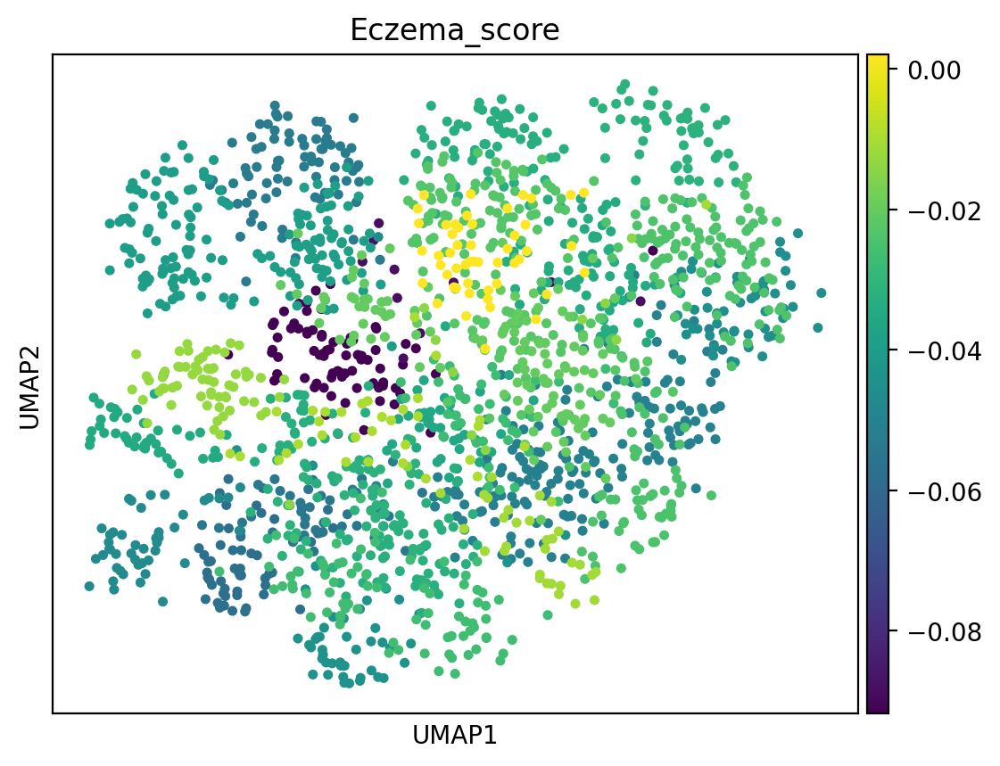

computing score 'SCC_score'
    finished: added
    'SCC_score', score of gene set (adata.obs).
    1072 total control genes are used. (0:00:10)


/tmp/ipykernel_8325/1597639927.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()


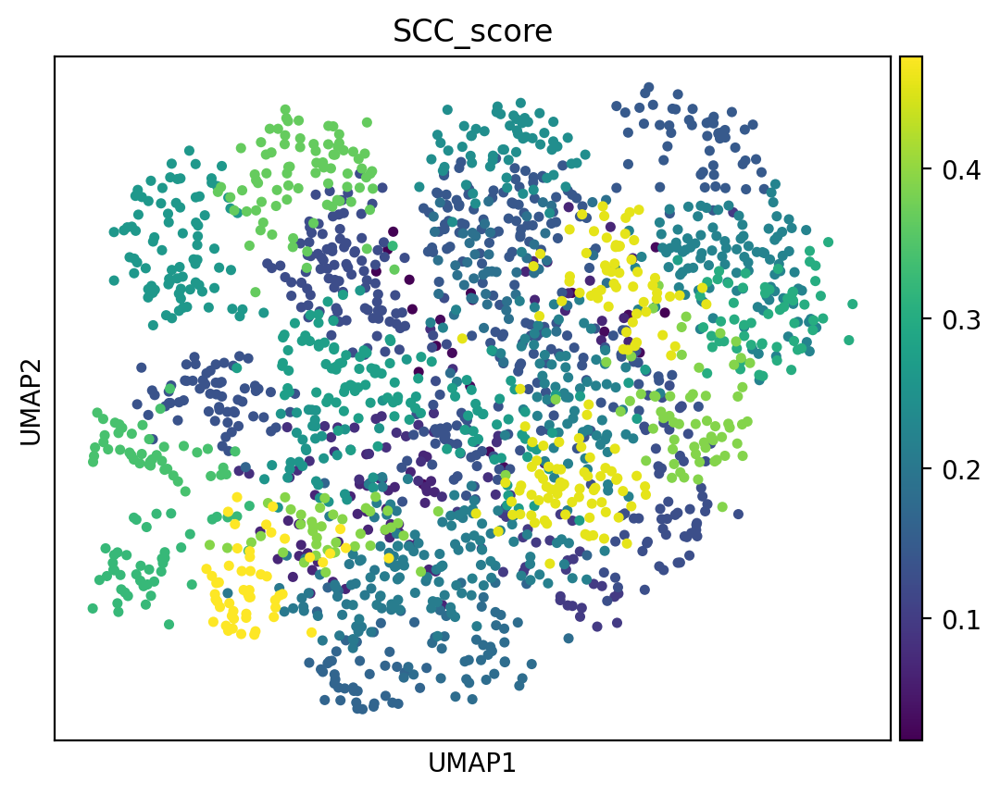

computing score 'Healthy_score'
    finished: added
    'Healthy_score', score of gene set (adata.obs).
    758 total control genes are used. (0:00:18)


/tmp/ipykernel_8325/1597639927.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()


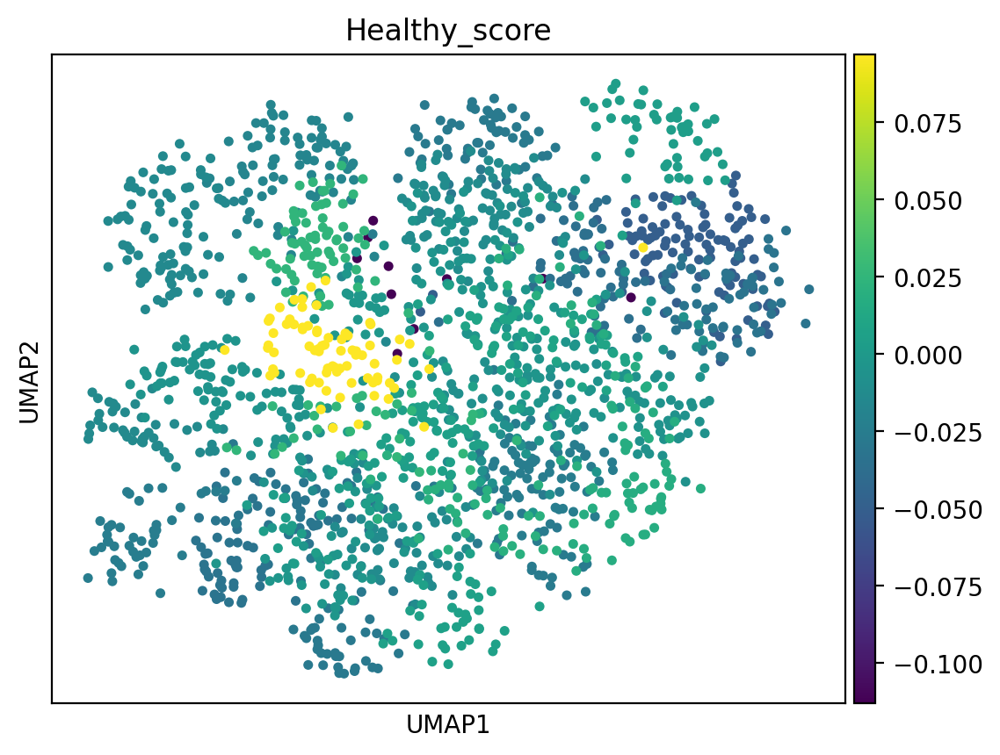

computing score 'Psoriasis_score'
    finished: added
    'Psoriasis_score', score of gene set (adata.obs).
    868 total control genes are used. (0:00:14)


/tmp/ipykernel_8325/1597639927.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()


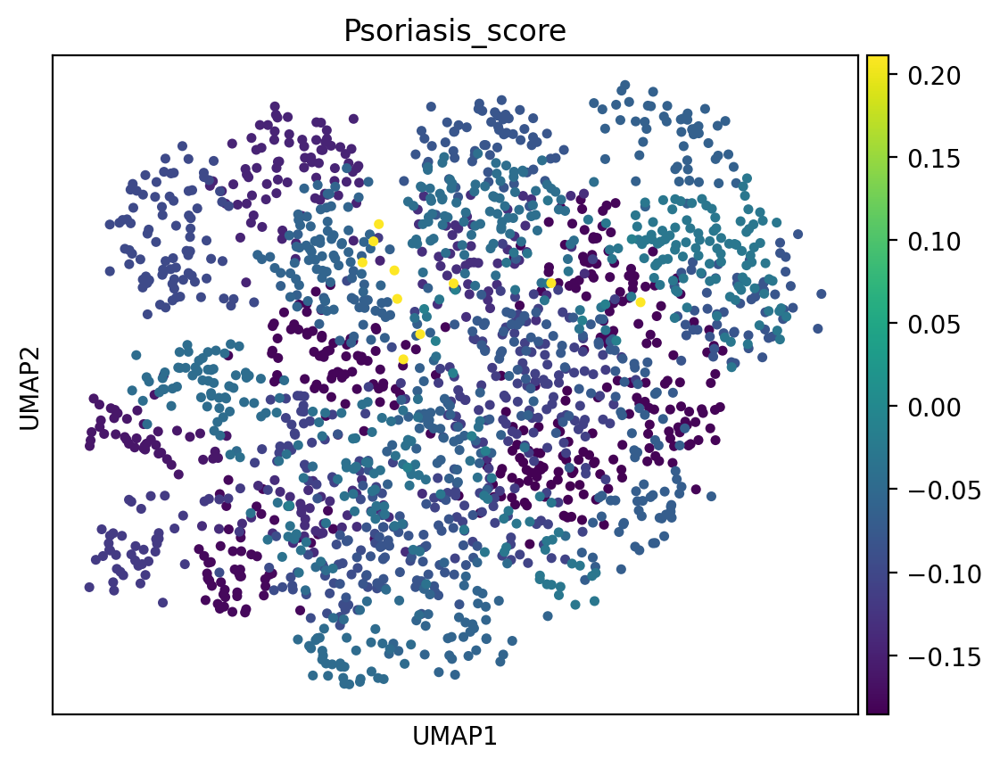

In [382]:
status = ['Eczema','SCC','Healthy','Psoriasis']
for i in status:
    ll = list(adata_tt.var[adata_tt.var['Status'].isin([i])].index)
    sc.tl.score_genes(adata_tt, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=False, use_raw=None)
    cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()
    adata_tt.obs[i+'_score'] = (adata_tt.obs['leiden'].map(cluster_scores)).astype(float)
    
    sc.pl.umap(adata_tt,color =i+'_score')

computing score 'Eczema_score'
    finished: added
    'Eczema_score', score of gene set (adata.obs).
    909 total control genes are used. (0:00:14)


/tmp/ipykernel_8325/422873452.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].median()


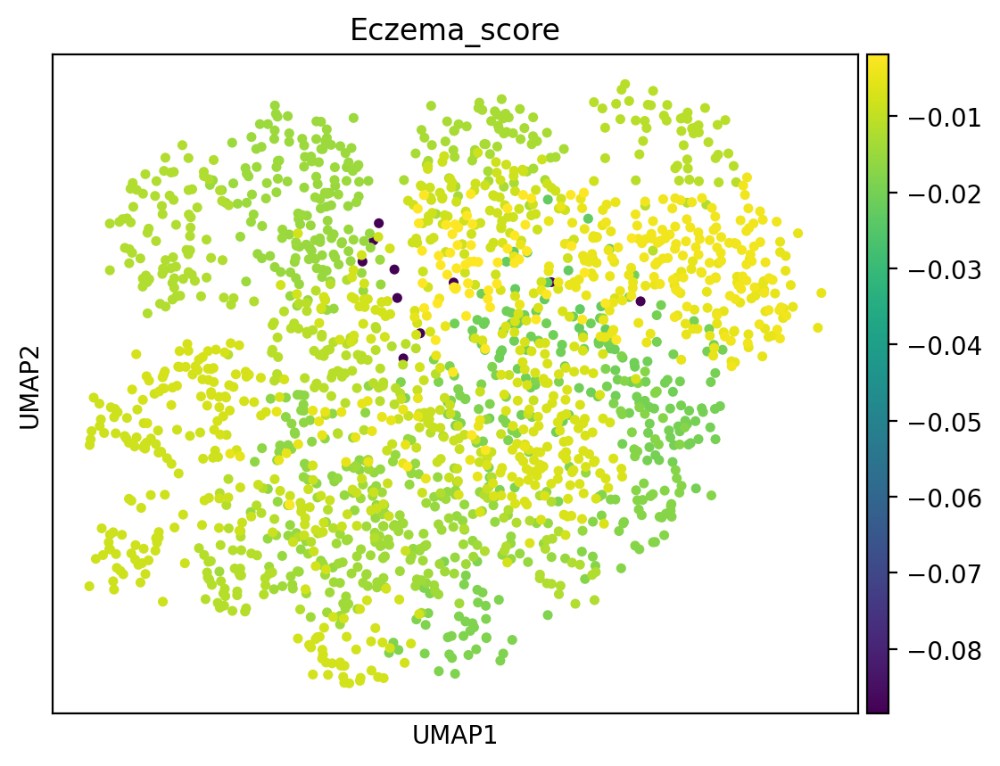

computing score 'SCC_score'
    finished: added
    'SCC_score', score of gene set (adata.obs).
    1072 total control genes are used. (0:00:10)


/tmp/ipykernel_8325/422873452.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].median()


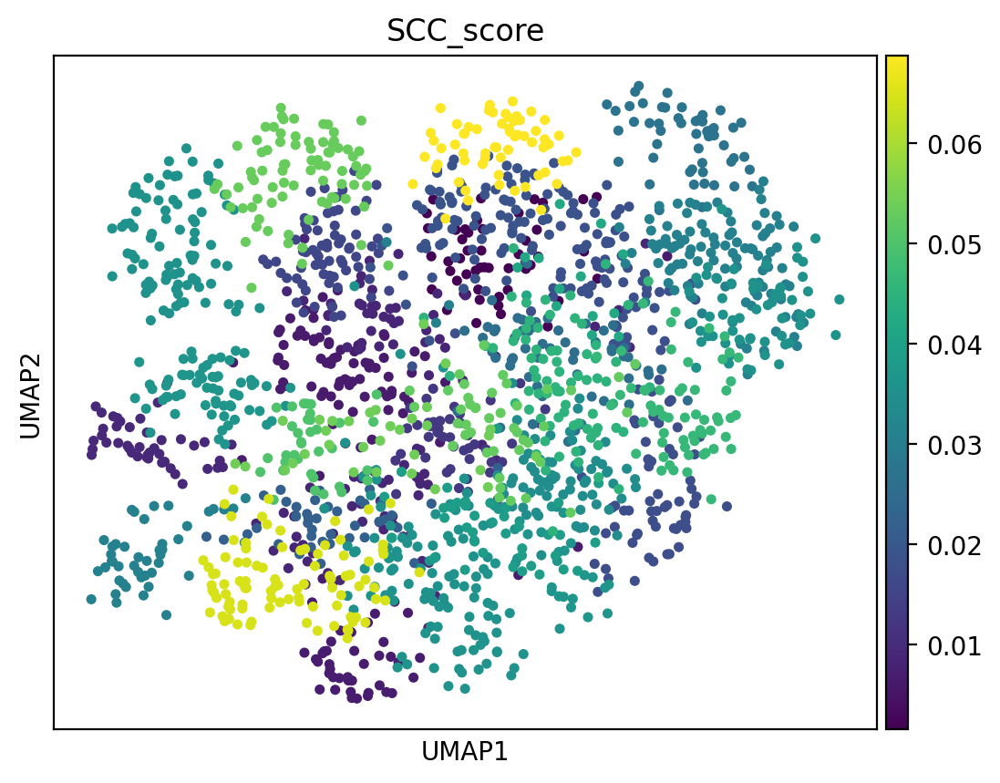

computing score 'Healthy_score'
    finished: added
    'Healthy_score', score of gene set (adata.obs).
    758 total control genes are used. (0:00:19)


/tmp/ipykernel_8325/422873452.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].median()


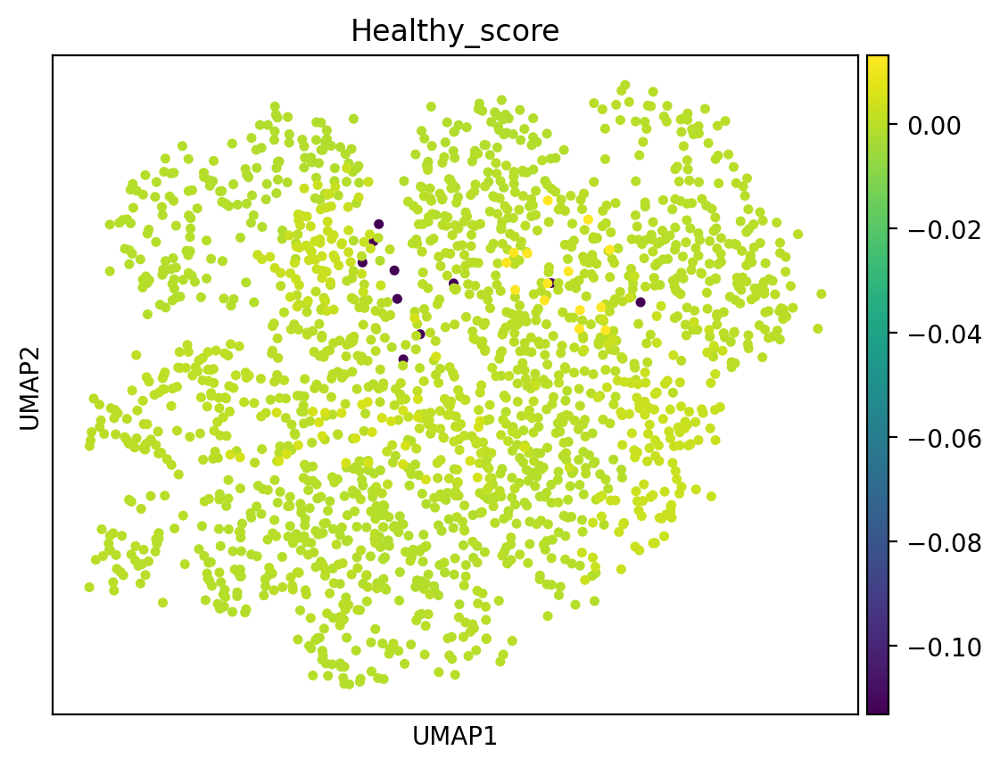

computing score 'Psoriasis_score'
    finished: added
    'Psoriasis_score', score of gene set (adata.obs).
    868 total control genes are used. (0:00:14)


/tmp/ipykernel_8325/422873452.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].median()


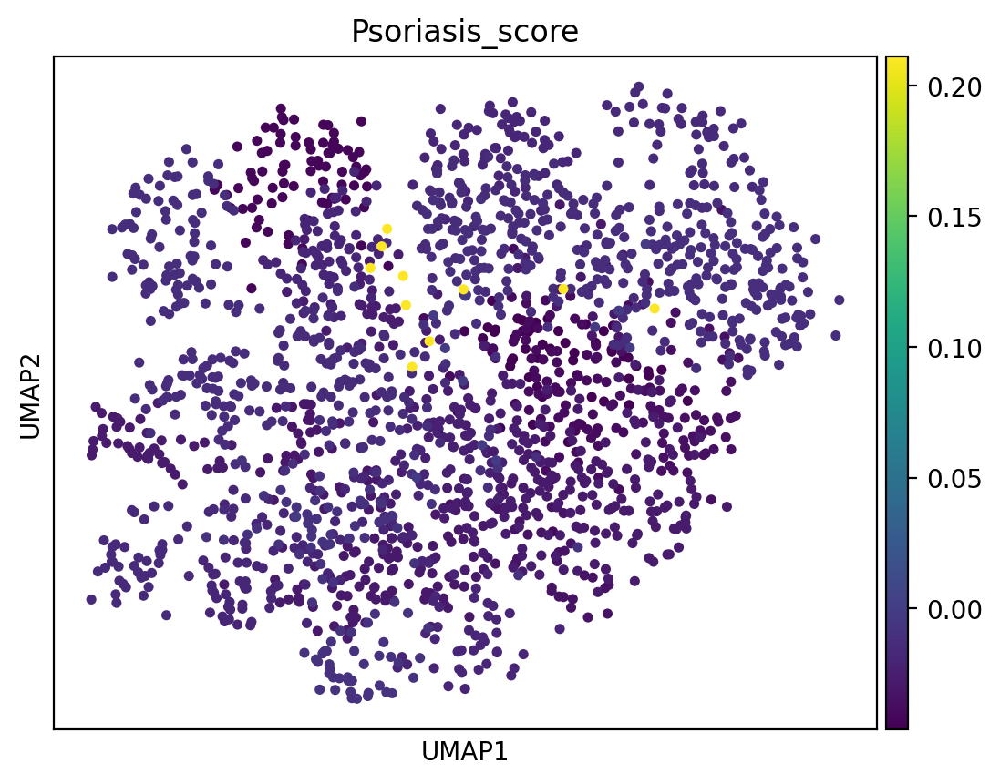

In [384]:
status = ['Eczema','SCC','Healthy','Psoriasis']
for i in status:
    ll = list(adata_tt.var[adata_tt.var['Status'].isin([i])].index)
    sc.tl.score_genes(adata_tt, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=False, use_raw=None)
    cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].median()
    adata_tt.obs[i+'_score'] = (adata_tt.obs['leiden'].map(cluster_scores)).astype(float)
    
    sc.pl.umap(adata_tt,color =i+'_score')

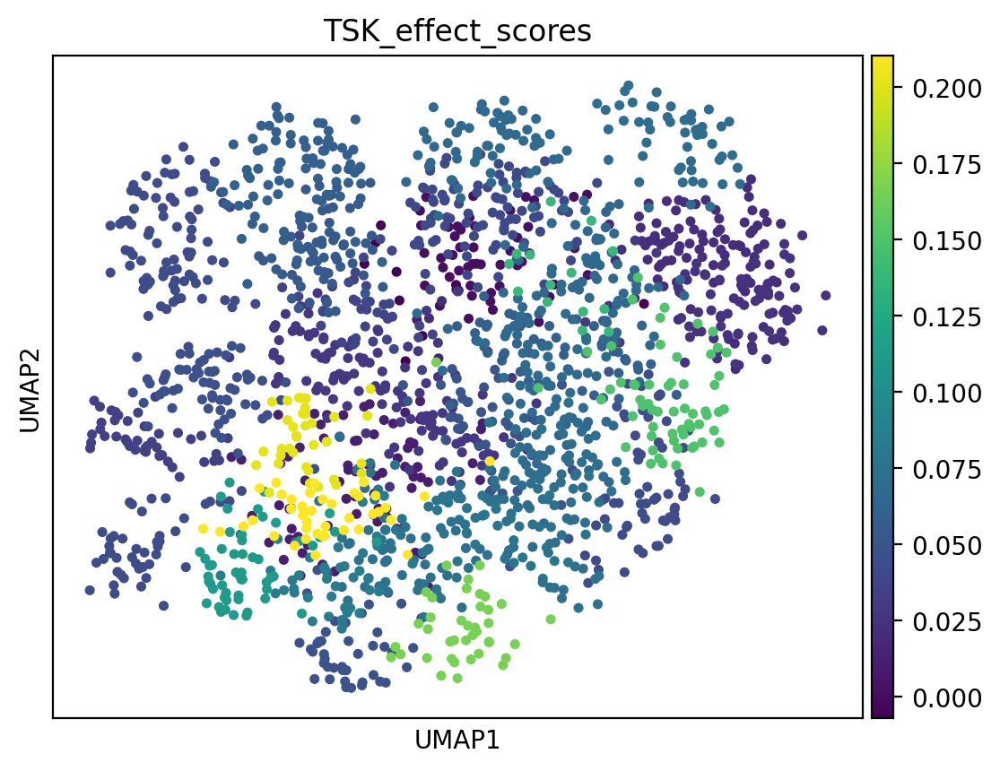

In [375]:
ll = list(adata_tt.var[adata_tt.var['level2_celltype'].isin(['TSK'])].index)
sc.tl.score_genes(adata_tt, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name='TSK_score', random_state=0, copy=False, use_raw=None)
cluster_scores= adata_tt.obs.groupby('leiden')['TSK_score'].median()
adata_tt.obs['TSK_effect_scores'] = adata_tt.obs['leiden'].map(cluster_scores)
sc.pl.umap(adata_tt,color ='TSK_effect_scores')

computing score 'Psoriasis_score'
    finished: added
    'Psoriasis_score', score of gene set (adata.obs).
    868 total control genes are used. (0:00:15)


/tmp/ipykernel_8325/4001745286.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()


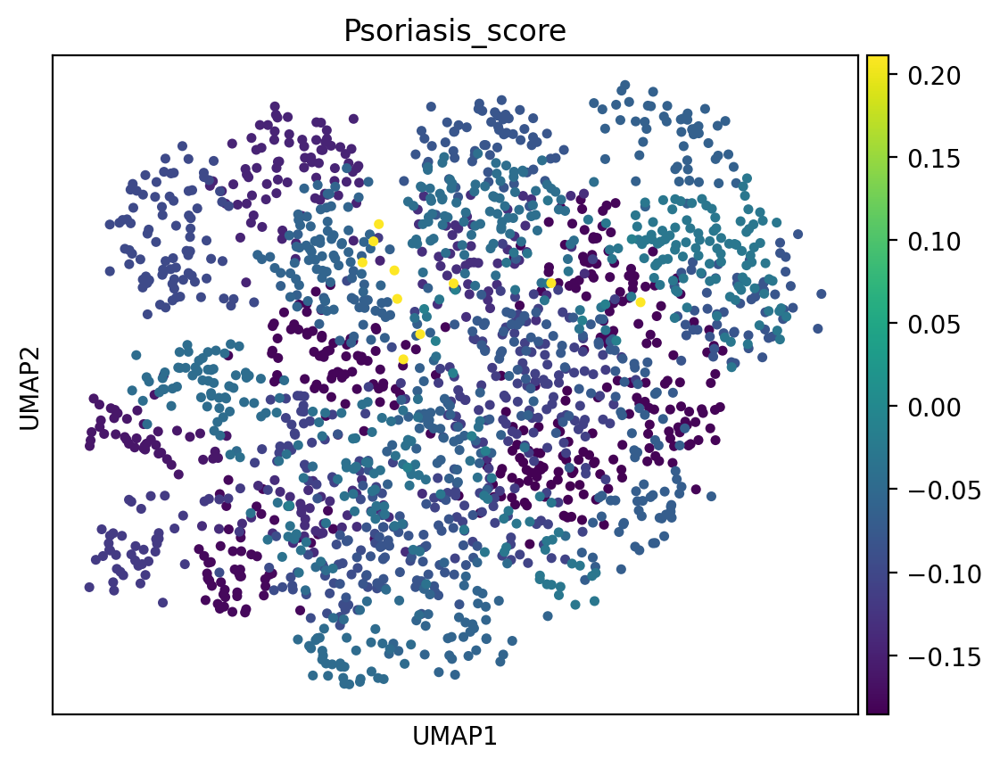

In [407]:
status = ['Psoriasis']
for i in status:
    ll = list(adata_tt.var[adata_tt.var['Status'].isin([i])].index)
    sc.tl.score_genes(adata_tt, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name=(i+'_score'), random_state=0, copy=False, use_raw=None)
    cluster_scores= adata_tt.obs.groupby('leiden')[i+'_score'].mean()
    adata_tt.obs[i+'_score'] = (adata_tt.obs['leiden'].map(cluster_scores)).astype(float)
    
    sc.pl.umap(adata_tt,color =i+'_score')

In [388]:
list(adata_tt.var['level3_celltype'].unique())

['Differentiated_KC',
 'Melanocyte',
 'Undifferentiated_KC',
 'LC_4',
 'Differentiated_KC*',
 'LE2',
 'F3',
 'VE1',
 'VE2',
 'Tc',
 'VE3',
 'LC_3',
 'Treg',
 'Mono_mac',
 'Pericyte_1',
 'MigDC',
 'Th',
 'F2',
 'Proliferating_KC',
 'LE1',
 'moDC_1',
 'moDC_2',
 'Macro_1',
 'F1',
 'Pericyte_2',
 'Schwann_1',
 'Schwann_2',
 'Macro_2',
 'moDC_3',
 'Tc_IL13_IL22',
 'LC_1',
 'DC2',
 'DC1',
 'Inf_mac',
 'NK',
 'Mast_cell',
 'ILC1_3',
 'ILC2',
 'LC_2',
 'Plasma',
 'Tc17_Th17',
 'ILC1_NK',
 'Tumor_KC_Diff',
 'Keratinocyte',
 'Tumor_KC_Basal',
 'Tumor_KC_Cyc',
 'Endothelial Cell',
 'Pilosebaceous',
 'Fibroblast',
 'TSK',
 'Multiplet',
 'Eccrine',
 'LC',
 'PDC',
 'Normal_KC_Basal',
 'Normal_KC_Diff',
 'Normal_KC_Cyc',
 'CLEC9A',
 'CD1C',
 'Mig_CD1C',
 'Mac',
 'ASDC',
 'CD8_Exh',
 'Mig_LC',
 'MDSC',
 'CD4_Exh',
 'B Cell',
 'CD8_EM',
 'CD4_Naive',
 'CD4_Pre_Exh',
 'Mig_CLEC9A',
 'CD8_EMRA',
 'CD8_Naive',
 'CD4_RGCC']

computing score 'CD8_Exh_score'
    finished: added
    'CD8_Exh_score', score of gene set (adata.obs).
    1200 total control genes are used. (0:00:07)


/tmp/ipykernel_8325/4261828516.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cluster_scores= adata_tt.obs.groupby('leiden')['CD8_Exh_score'].mean()


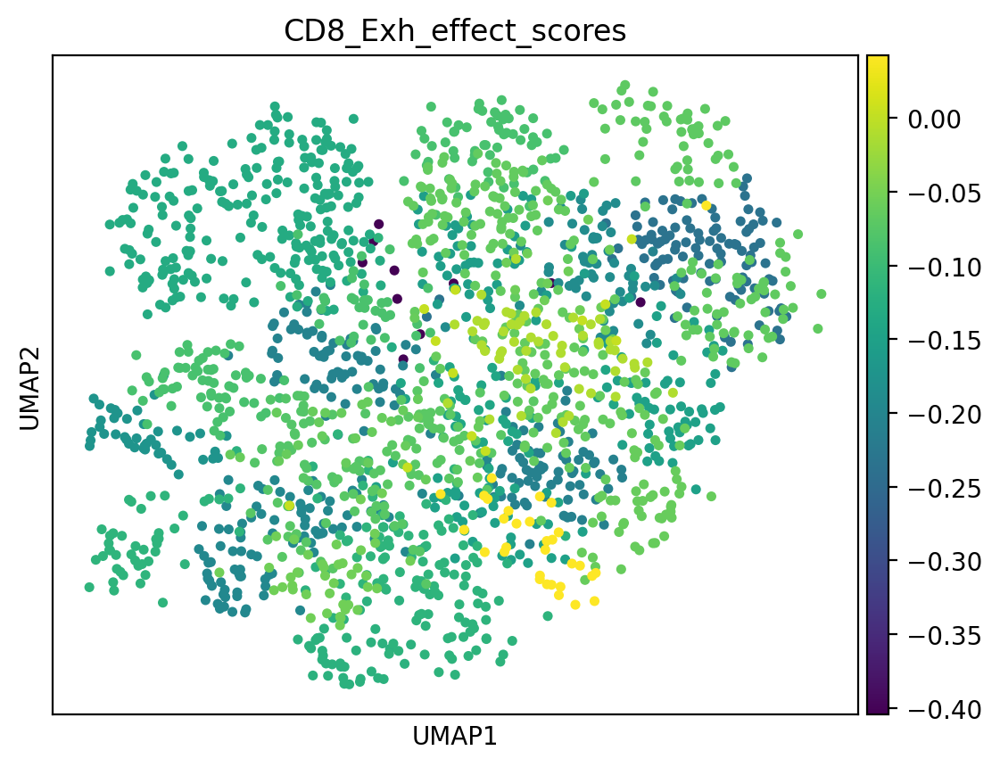

In [395]:
ll = list(adata_tt.var[adata_tt.var['level3_celltype'].isin(['CD8_Exh'])].index)
sc.tl.score_genes(adata_tt, ll, ctrl_size=50, gene_pool=None, n_bins=25, score_name='CD8_Exh_score', random_state=0, copy=False, use_raw=None)
cluster_scores= adata_tt.obs.groupby('leiden')['CD8_Exh_score'].mean()
adata_tt.obs['CD8_Exh_effect_scores'] = (adata_tt.obs['leiden'].map(cluster_scores))
adata_tt.obs['CD8_Exh_effect_scores'] = adata_tt.obs['CD8_Exh_effect_scores'].astype(float)
sc.pl.umap(adata_tt,color ='CD8_Exh_effect_scores')

In [401]:
adata_tt.obs['CD8_Exh_effect_scores'] = adata_tt.obs['CD8_Exh_effect_scores']**2

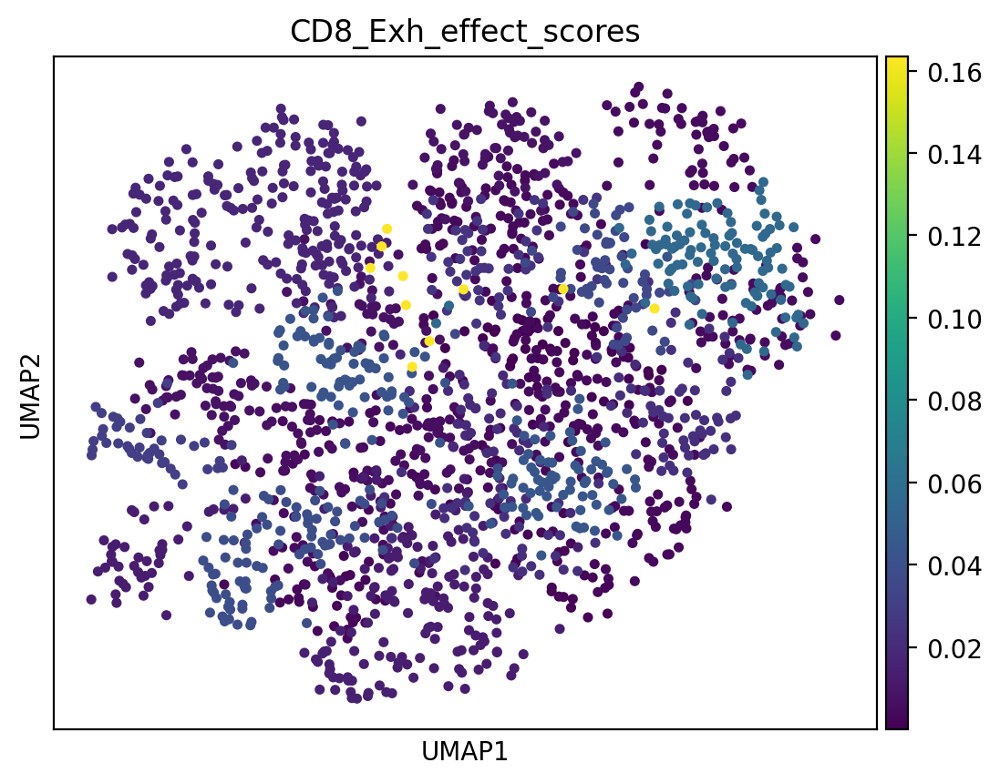

In [402]:
sc.pl.umap(adata_tt,color ='CD8_Exh_effect_scores')

In [397]:
adata_tt.obs.groupby('leiden')['CD8_Exh_effect_scores'].max()

/tmp/ipykernel_8325/2935055037.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_tt.obs.groupby('leiden')['CD8_Exh_effect_scores'].max()


leiden
0    -0.233641
1    -0.065290
2    -0.131778
3    -0.131222
4    -0.204995
5    -0.064773
6    -0.209073
7    -0.130506
8    -0.113653
9    -0.087005
10   -0.060508
11   -0.087668
12   -0.188975
13   -0.150525
14   -0.067036
15   -0.010520
16   -0.195324
17   -0.068937
18   -0.156418
19   -0.072951
20   -0.118930
21   -0.113306
22   -0.072142
23   -0.172862
24   -0.140450
25   -0.195557
26   -0.115747
27   -0.053910
28   -0.151175
29   -0.085632
30   -0.076909
31   -0.061419
32    0.042646
33   -0.055571
34    0.003701
35   -0.404398
Name: CD8_Exh_effect_scores, dtype: float64

In [385]:
adata_tt.obs.groupby('leiden')['TSK_score'].max()

/tmp/ipykernel_8325/3682038114.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata_tt.obs.groupby('leiden')['TSK_score'].max()


leiden
0     20.577513
1     10.191220
2     12.438272
3     22.331414
4     21.412098
5     22.331414
6     22.331414
7      7.500095
8     11.156221
9      7.535157
10     8.368321
11    22.331414
12    22.331414
13    22.331414
14    15.425394
15     5.632878
16    22.331414
17    16.451936
18    22.331414
19     5.134707
20     7.900155
21    22.331414
22     5.625843
23    22.331414
24    22.331414
25    22.331414
26     7.427348
27     5.916197
28    24.311629
29     5.134707
30     7.966526
31     2.791247
32     4.368891
33     9.340031
34     0.449969
35    -0.007139
Name: TSK_score, dtype: float64

# Create a ranking mode for drugs within clusters of mechanisms

In [398]:
sc.tl.embedding_density(adata_tt, basis='umap', groupby='leiden')

computing density on 'umap'
--> added
    'umap_density_leiden', densities (adata.obs)
    'umap_density_leiden_params', parameter (adata.uns)


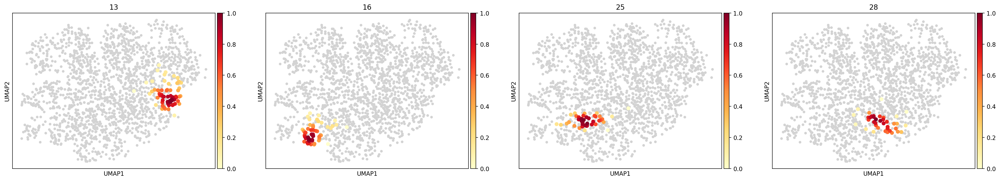

In [400]:
sc.pl.embedding_density(adata_tt, basis='umap', key=None, groupby='leiden', group=['13','16','25','28'], color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, vcenter=None, norm=None, ncols=4, hspace=0.25)

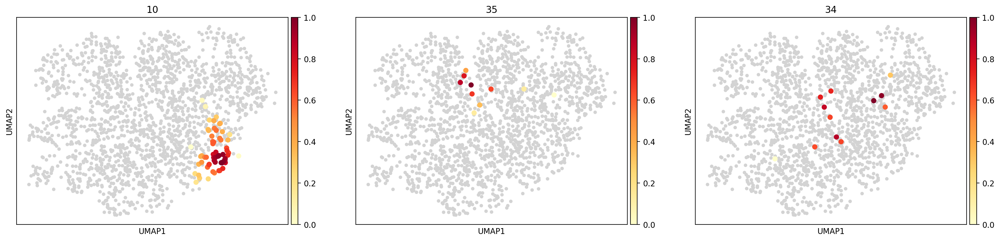

In [405]:
sc.pl.embedding_density(adata_tt, basis='umap', key=None, groupby='leiden', group=['10','35','34'], color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, vcenter=None, norm=None, ncols=4, hspace=0.25)

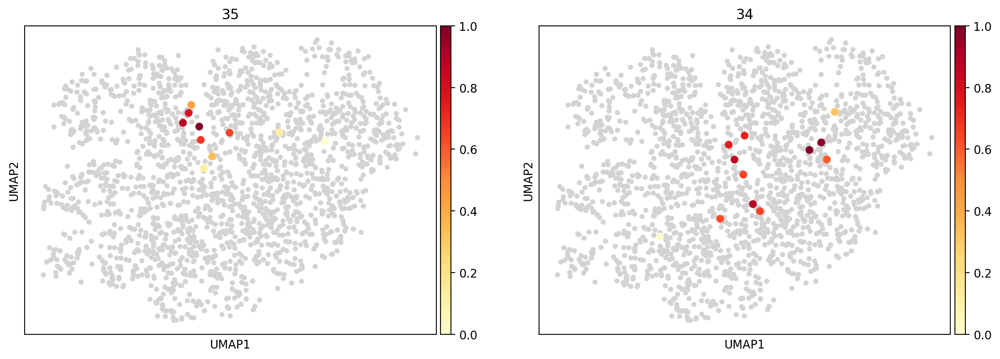

In [409]:
sc.pl.embedding_density(adata_tt, basis='umap', key=None, groupby='leiden', group=['35','34'], color_map='YlOrRd', bg_dotsize=80, fg_dotsize=180, vmax=1, vmin=0, vcenter=None, norm=None, ncols=4, hspace=0.25)

In [406]:
selection = ['13','16','25','28']

selected_data = adata_tt.obs[adata_tt.obs['leiden'].isin(selection)]
result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(3))
del result['leiden']
result = result.reset_index()
result

/tmp/ipykernel_8325/1758985512.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(3))
/tmp/ipykernel_8325/1758985512.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(3))


,leiden,level_1,genes,all_genes,chembl,TSK_score,cluster_scores,TSK_effect_scores,Eczema_score,SCC_score,Healthy_score,Psoriasis_score,CD8_Exh_score,CD8_Exh_effect_scores,umap_density_leiden
0,13,CHEMBL1208|CINOXACIN,LMNA,LMNA,CHEMBL1208,22.331414,0.149863,0.149863,-0.019975,0.046505,0.002437,-0.035556,-3.091574,0.022658,0.683467
1,13,CHEMBL13828|OXATOMIDE,"HRH1,KCNH2,HIF1A,TDP1,PKM,CACNA1H,CYP2D6","PKM,KCNH2,TDP1,HRH1,CACNA1H,CYP2D6,HIF1A",CHEMBL13828,11.173946,0.149863,0.149863,-0.019975,0.046505,0.002437,-0.035556,-0.191587,0.022658,0.900797
2,13,CHEMBL24|ATENOLOL,"LMNA,ADRB1","LMNA,ADRB1",CHEMBL24,11.166200,0.149863,0.149863,-0.019975,0.046505,0.002437,-0.035556,-1.545602,0.022658,0.171686
3,16,CHEMBL1200370|BENZOYL PEROXIDE,LMNA,LMNA,CHEMBL1200370,22.331414,0.111295,0.111295,-0.011506,0.064629,-0.000675,-0.018916,-3.091574,0.038152,0.113033
4,16,CHEMBL1305|ANTAZOLINE,"LMNA,CYP2D6","LMNA,CYP2D6",CHEMBL1305,11.167250,0.111295,0.111295,-0.011506,0.064629,-0.000675,-0.018916,-1.547870,0.038152,0.761246
5,16,CHEMBL1238|AZELAIC ACID,"LMNA,NFKB1","LMNA,NFKB1",CHEMBL1238,11.107817,0.111295,0.111295,-0.011506,0.064629,-0.000675,-0.018916,-1.712593,0.038152,0.945312
6,25,CHEMBL637|VENLAFAXINE,LMNA,LMNA,CHEMBL637,22.331414,0.210328,0.210328,-0.008787,0.021927,-0.000631,-0.010025,-3.091574,0.038242,0.710179
7,25,CHEMBL1200699|DOXYCYCLINE,"MMP7,MMP8,MMP1,MMP13","MMP7,MMP1,MMP8,MMP13",CHEMBL1200699,9.340031,0.210328,0.210328,-0.008787,0.021927,-0.000631,-0.010025,-0.347847,0.038242,0.281676
8,25,CHEMBL3039540|ADUCANUMAB,APP,APP,CHEMBL3039540,8.461381,0.210328,0.210328,-0.008787,0.021927,-0.000631,-0.010025,-0.978796,0.038242,0.942452
9,28,CHEMBL15023|TRIFLUPERIDOL,"MTOR,PKM,CYP2D6","PKM,CYP2D6,MTOR",CHEMBL15023,24.311629,0.076691,0.076691,-0.015505,0.038666,-0.000156,-0.025703,-0.404043,0.022854,0.843222


In [410]:
selection = ['6','10','35','34']

selected_data = adata_tt.obs[adata_tt.obs['leiden'].isin(selection)]
result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))
del result['leiden']
result = result.reset_index()
result

/tmp/ipykernel_8325/1470254191.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))
/tmp/ipykernel_8325/1470254191.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))


,leiden,level_1,genes,all_genes,chembl,TSK_score,cluster_scores,TSK_effect_scores,Eczema_score,SCC_score,Healthy_score,Psoriasis_score,CD8_Exh_score,CD8_Exh_effect_scores,umap_density_leiden
0,6,CHEMBL471|SOTALOL,LMNA,LMNA,CHEMBL471,22.331414,0.071087,0.071087,-0.006729,0.034139,-0.000590,-0.185435,-3.091574,0.043712,0.968678
1,6,CHEMBL62193|SULFADIMETHOXINE,LMNA,LMNA,CHEMBL62193,22.331414,0.071087,0.071087,-0.006729,0.034139,-0.000590,-0.185435,-3.091574,0.043712,0.482332
2,6,CHEMBL268869|SULFAMETHOXYPYRIDAZINE,LMNA,LMNA,CHEMBL268869,22.331414,0.071087,0.071087,-0.006729,0.034139,-0.000590,-0.185435,-3.091574,0.043712,0.000000
3,6,CHEMBL2364574|DOXYCYCLINE CALCIUM,"MMP7,MMP8,MMP1,MMP13","MMP7,MMP1,MMP8,MMP13",CHEMBL2364574,9.340031,0.071087,0.071087,-0.006729,0.034139,-0.000590,-0.185435,-0.347847,0.043712,0.675868
4,6,CHEMBL3301589|ENFORTUMAB VEDOTIN,"TUBA3E,TUBA4A,TUBB2A,TUBB2B,TUBB,TUBB4B,TUBB8,...","TUBB4B,TUBA1C,TUBA4A,TUBB2A,TUBB2B,TUBB8,TUBA1...",CHEMBL3301589,5.134707,0.071087,0.071087,-0.006729,0.034139,-0.000590,-0.185435,-0.203265,0.043712,0.987664
5,10,CHEMBL1401|NITAZOXANIDE,"NFE2L2,SMN2,SMN1,AHR,NPSR1,VDR,PKM,TP53,NPC1","PKM,NPSR1,VDR,AHR,NPC1,NFE2L2,SMN2,TP53,SMN1",CHEMBL1401,8.368321,0.042940,0.042940,-0.017638,0.017402,0.003370,-0.068202,-0.283508,0.003661,0.558023
6,10,CHEMBL1643|RIBAVIRIN,"RORC,LMNA,IMPDH1,ALDH1A1,TDP1,TP53","RORC,LMNA,TDP1,IMPDH1,ALDH1A1,TP53,CXCL8",CHEMBL1643,4.086668,0.042940,0.042940,-0.017638,0.017402,0.003370,-0.068202,-0.508164,0.003661,0.570886
7,10,CHEMBL534|KETOTIFEN,"LMNA,HTR2B,HRH1,DRD1,HTR2A,CYP2D6","DRD1,LMNA,HTR2B,HTR2A,HRH1,CYP2D6",CHEMBL534,3.747597,0.042940,0.042940,-0.017638,0.017402,0.003370,-0.068202,-0.536867,0.003661,0.527996
8,10,CHEMBL1614|DESLANOSIDE,"ATP1A1,ATP1A2,ATP1A4,ATP1B1,ATP1B3,FXYD2,TDP1,...","ATP1B2,TDP1,ATP1A4,ATP1A2,ATP1A1,ATP1B1,ATP1A3...",CHEMBL1614,2.932586,0.042940,0.042940,-0.017638,0.017402,0.003370,-0.068202,-0.278909,0.003661,0.037131
9,10,CHEMBL635|PREDNISONE,"NR3C1,HSD17B10","NR3C1,HSD17B10",CHEMBL635,2.249202,0.042940,0.042940,-0.017638,0.017402,0.003370,-0.068202,-0.040185,0.003661,0.570903


In [408]:
selection = ['34','35']

selected_data = adata_tt.obs[adata_tt.obs['leiden'].isin(selection)]
result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))
del result['leiden']
result = result.reset_index()
result

/tmp/ipykernel_8325/2141571104.py:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))
/tmp/ipykernel_8325/2141571104.py:4: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  result = selected_data.groupby('leiden').apply(lambda x: x.sort_values('TSK_score', ascending=False).head(5))


,leiden,level_1,genes,all_genes,chembl,TSK_score,cluster_scores,TSK_effect_scores,Eczema_score,SCC_score,Healthy_score,Psoriasis_score,CD8_Exh_score,CD8_Exh_effect_scores,umap_density_leiden
0,34,CHEMBL1201561|PEGINTERFERON ALFA-2B,"IFNAR2,IFNAR1","IFNAR1,IFNAR2",CHEMBL1201561,0.449969,0.027241,0.027241,-0.002257,0.008735,0.000247,-0.014211,-0.029769,0.000014,0.969266
1,34,CHEMBL846|CALCITRIOL,"GMNN,VDR,TDP1","VDR,GMNN,TDP1",CHEMBL846,0.288036,0.027241,0.027241,-0.002257,0.008735,0.000247,-0.014211,0.106358,0.000014,0.311226
2,34,CHEMBL1568698|GANAXOLONE,"GABRD,GABRG1,GABRA2,GABRA4,GABRB1,GABRB2,GABRA...","GABRA3,GABRA4,EHMT2,GABRP,GABRG1,GABRG2,GABRA1...",CHEMBL1568698,0.041760,0.027241,0.027241,-0.002257,0.008735,0.000247,-0.014211,-0.001443,0.000014,0.632222
3,34,CHEMBL967|TEMAZEPAM,"GABRD,GABRG1,GABRA2,GABRA4,GABRB1,GABRB2,GABRA...","GABRA3,GABRA4,GABRP,GABRG1,GABRG2,GABRA1,GABRG...",CHEMBL967,0.027241,0.027241,0.027241,-0.002257,0.008735,0.000247,-0.014211,-0.003414,0.000014,0.653523
4,34,CHEMBL1102|GLUTETHIMIDE,"GABRD,GABRG1,GABRA2,GABRA4,GABRB1,GABRB2,GABRA...","GABRA3,GABRA4,GABRP,GABRG1,GABRG2,GABRA1,GABRG...",CHEMBL1102,0.027241,0.027241,0.027241,-0.002257,0.008735,0.000247,-0.014211,-0.003414,0.000014,0.650919
5,35,CHEMBL3989676|OXYPHENBUTAZONE,"PTGS2,PTGS1","PTGS2,PTGS1",CHEMBL3989676,-0.007139,-0.007139,-0.007139,-0.088438,0.018700,-0.113096,0.211179,-0.404398,0.163538,0.129248
6,35,CHEMBL139|DICLOFENAC,"PTGS2,PTGS1","PTGS2,PTGS1",CHEMBL139,-0.007139,-0.007139,-0.007139,-0.088438,0.018700,-0.113096,0.211179,-0.404398,0.163538,0.343190
7,35,CHEMBL751|BROMFENAC SODIUM,"PTGS2,PTGS1","PTGS2,PTGS1",CHEMBL751,-0.007139,-0.007139,-0.007139,-0.088438,0.018700,-0.113096,0.211179,-0.404398,0.163538,0.126576
8,35,CHEMBL1201141|IBUPROFEN LYSINE,"PTGS2,PTGS1","PTGS2,PTGS1",CHEMBL1201141,-0.007139,-0.007139,-0.007139,-0.088438,0.018700,-0.113096,0.211179,-0.404398,0.163538,0.682390
9,35,CHEMBL3989754|FLURBIPROFEN SODIUM,"PTGS2,PTGS1","PTGS2,PTGS1",CHEMBL3989754,-0.007139,-0.007139,-0.007139,-0.088438,0.018700,-0.113096,0.211179,-0.404398,0.163538,0.868342


In [394]:
database_df = database_df.loc[database_df['molecule_dictionary|chembl_id'].isin(list(result['level_1'].str.split('|').str[0]))]
levels=[5, 10, 15]

In [396]:
database_df

,molecule_dictionary|chembl_id,atc_classification|level1_description,atc_classification|level2_description,atc_classification|level3_description,atc_classification|level4_description,drug_mechanism|mechanism_of_action,drug_mechanism|tid,drug_mechanism|action_type
28,CHEMBL107,musculoskeletal system,antigout preparations,antigout preparations,preparations effect uric acid metabolism,"tubulin inhibitor, nan","nan, 1047660","nan, inhibitor"
128,CHEMBL1200370,dermatologicals,antiacne preparations,antiacne preparations topical use,peroxides,nan,nan,nan
281,CHEMBL1200809,nan,nan,nan,nan,"histamine h1 receptor antagonist, nan","1270, nan","antagonist, nan"
356,CHEMBL1201012,dermatologicals,corticosteroids dermatological preparations,corticosteroids plain,corticosteroids potent group iii,"glucocorticoid receptor agonist, nan","nan, 250","agonist, nan"
550,CHEMBL1208,antiinfectives systemic use,antibacterials systemic use,quinolone antibacterials,quinolones,nan,nan,nan
664,CHEMBL13828,respiratory system,antihistamines systemic use,antihistamines systemic use,piperazine derivatives,nan,nan,nan
678,CHEMBL1410,nan,nan,nan,nan,nan,nan,nan
689,CHEMBL1431,alimentary tract metabolism,drugs used diabetes,blood glucose lowering drugs excl insulins,biguanides,nan,nan,nan
728,CHEMBL1501,"dermatologicals, cardiovascular system","vasoprotectives, corticosteroids dermatological preparations","corticosteroids plain, agents treatment hemorrhoids anal fissures topical use","corticosteroids potent group iii, corticosteroids","glucocorticoid receptor agonist, nan","nan, 250","agonist, nan"
874,CHEMBL1722,nan,nan,nan,nan,"norepinephrine transporter inhibitor, dopamine transporter inhibitor, nan","1000, nan, 1550","nan, inhibitor"


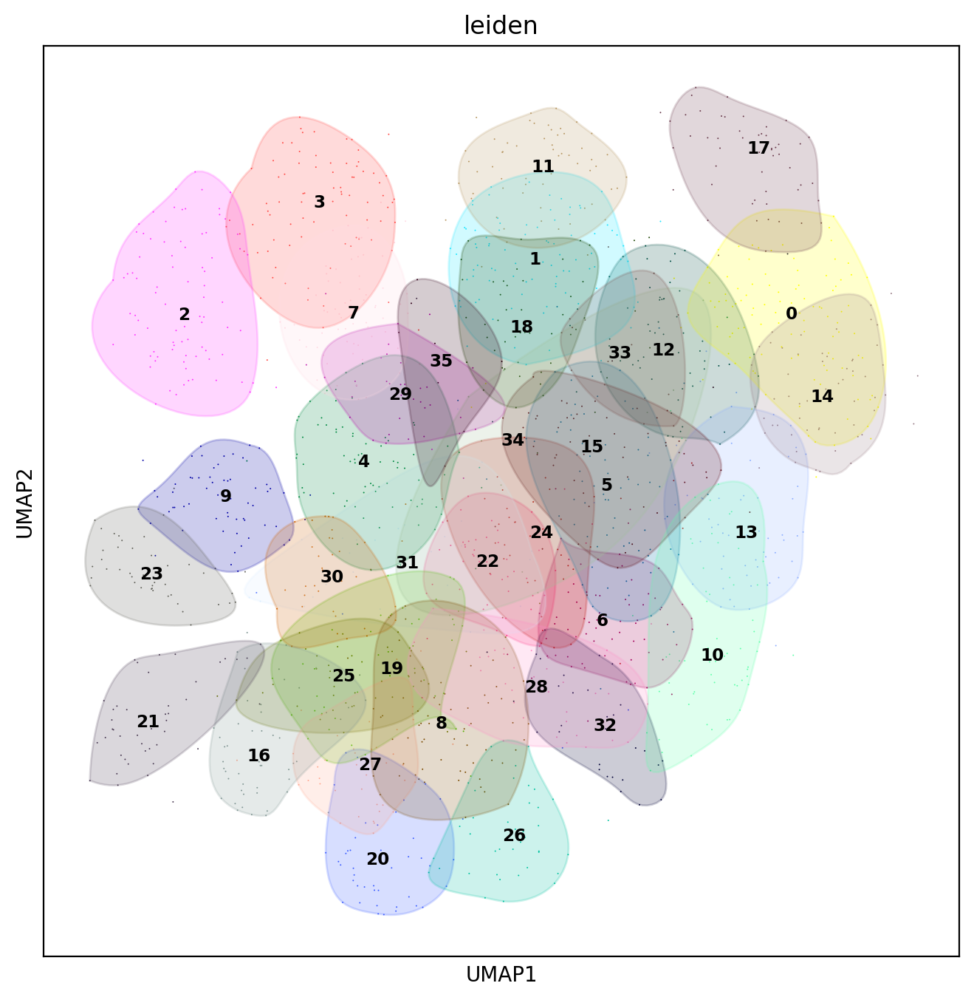

In [429]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance
from scipy import interpolate
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import scanpy as sc

def plot_clusters(data, var, embedding='X_umap', n_neighbors=3, interp_points=100):
    # Filter data by tissue

    fig, ax = plt.subplots(figsize=(8, 8))
     # Extracting colors for each leiden cluster
    leiden_colors = data.uns[f'{var}_colors']
    unique_clusters = data.obs[var].unique().astype(int)
    col_pal = {str(cluster): leiden_colors[cluster] for cluster in unique_clusters}


    # Plot UMAP with the colors
    sc.pl.umap(data, color=var, legend_loc='on data', size=2, legend_fontsize='small', ax=ax, show=False, palette=col_pal)

    umap_coord = pd.DataFrame(data.obsm[embedding], columns=['dim_1', 'dim_2'])
    umap_coord['cluster'] = data.obs[var].values

    for i in umap_coord.cluster.unique():
        points = umap_coord[umap_coord.cluster == i][['dim_1', 'dim_2']].values

        # KMeans to find the centroid
        kmeans = KMeans(n_clusters=1).fit(points)
        centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
        points = points[centroid_distance[0] <= centroid_distance[0].mean() + 1.96 * centroid_distance[0].std()]

        # KNN to filter outliers
        neigh = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
        neigh.fit(points)
        dist, _ = neigh.kneighbors(points)
        distances = pd.DataFrame([dist[i][n_neighbors - 1] for i in range(len(dist))])
        points = points[distances[0] <= distances[0].mean() + 1.96 * distances[0].std()]

        # Convex hull
        if len(points) > 3:  # ConvexHull needs at least 3 points
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices, 0], points[hull.vertices, 0][0])
            y_hull = np.append(points[hull.vertices, 1], points[hull.vertices, 1][0])

            # Interpolation for smoother shape
            dist_along = np.concatenate(([0], np.sqrt(np.diff(x_hull)**2 + np.diff(y_hull)**2).cumsum()))
            spline, _ = interpolate.splprep([x_hull, y_hull], u=dist_along, s=0)
            interp_d = np.linspace(dist_along[0], dist_along[-1], interp_points)
            interp_x, interp_y = interpolate.splev(interp_d, spline)

            # Plotting
            ax.fill(interp_x, interp_y, '--', c=col_pal[i], alpha=0.2)

    plt.show()

# Example usage
plot_clusters(data=adata_tt, var='leiden', embedding='X_umap')

In [400]:
database_df['molecule_dictionary|chembl_id']

28          CHEMBL107
128     CHEMBL1200370
281     CHEMBL1200809
356     CHEMBL1201012
550        CHEMBL1208
664       CHEMBL13828
678        CHEMBL1410
689        CHEMBL1431
728        CHEMBL1501
874        CHEMBL1722
1114      CHEMBL23588
1132         CHEMBL24
1158     CHEMBL268869
1263     CHEMBL349803
1526        CHEMBL521
1535        CHEMBL534
1610      CHEMBL62193
1624        CHEMBL640
1726        CHEMBL822
1744         CHEMBL86
1749        CHEMBL869
1763      CHEMBL90555
1769        CHEMBL917
1788         CHEMBL94
1802        CHEMBL960
Name: molecule_dictionary|chembl_id, dtype: object

In [402]:
cluster_drugs

CHEMBL1200762|BETAMETHASONE SODIUM PHOSPHATE    CHEMBL1200762
CHEMBL1370|BUDESONIDE                              CHEMBL1370
CHEMBL597|PHENTOLAMINE                              CHEMBL597
CHEMBL783|NATEGLINIDE                               CHEMBL783
CHEMBL1201745|CHOLINE FENOFIBRATE               CHEMBL1201745
CHEMBL565|CLOFIBRATE                                CHEMBL565
CHEMBL503|LOVASTATIN                                CHEMBL503
CHEMBL457|GEMFIBROZIL                               CHEMBL457
CHEMBL559|DEXTROTHYROXINE                           CHEMBL559
CHEMBL1138|EZETIMIBE                               CHEMBL1138
CHEMBL264374|BEZAFIBRATE                         CHEMBL264374
CHEMBL181|DIAZOXIDE                                 CHEMBL181
CHEMBL923|RISEDRONIC ACID                           CHEMBL923
CHEMBL566315|OBETICHOLIC ACID                    CHEMBL566315
CHEMBL1200395|ORPHENADRINE CITRATE              CHEMBL1200395
CHEMBL1233|CARISOPRODOL                            CHEMBL1233
CHEMBL33

In [405]:
set(cluster_drugs).intersection(set(database_df['molecule_dictionary|chembl_id']))

set()

In [410]:
selection = ['0','1','9','10','17']
cluster_df.loc[cluster_df['leiden'].isin(selection),'leiden'].unique()

['9', '10', '0', '1', '17']
Categories (19, object): ['0', '1', '2', '3', ..., '15', '16', '17', '18']

In [411]:
import pandas as pd
from transformers import T5Tokenizer, T5ForConditionalGeneration

# Assuming 'cluster_df' and 'database_df' are already defined and preprocessed

# Load T5 model and tokenizer
t5_model_name = "t5-small"
t5_tokenizer = T5Tokenizer.from_pretrained(t5_model_name)
t5_model = T5ForConditionalGeneration.from_pretrained(t5_model_name)

def generate_text(input_text, max_length=50):
    input_text = "summarize: " + input_text
    inputs = t5_tokenizer.encode(input_text, return_tensors="pt", max_length=512, truncation=True)
    summary_ids = t5_model.generate(inputs, max_length=max_length, num_return_sequences=1, early_stopping=True)
    summary = t5_tokenizer.decode(summary_ids[0], skip_special_tokens=True)
    return summary

def generate_semantic_labels(cluster_text, levels=[5, 10, 15]):
    semantic_labels = []
    for level in levels:
        summary = generate_text(cluster_text, max_length=level)
        semantic_labels.append(summary)
    return semantic_labels

# Iterate over clusters and assign semantic labels
cluster_summaries = []
for cluster_id in cluster_df.loc[cluster_df['leiden'].isin(selection),'leiden'].unique():
    cluster_drugs = cluster_df.loc[cluster_df['leiden'] == cluster_id, 'chembl']
    
    cluster_data = database_df.loc[database_df['molecule_dictionary|chembl_id'].isin(cluster_drugs)]
    concatenated_text = ' '.join(cluster_data['atc_classification|level1_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level2_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level3_description'].fillna('').replace('nan', '') +
                                 ' ' + cluster_data['atc_classification|level4_description'].fillna('').replace('nan', ''))
    concatenated_text = ' '.join([word for word in concatenated_text.split() if word.lower() != 'nan'])

    if concatenated_text.strip():
        semantic_labels = generate_semantic_labels(concatenated_text, levels=[5, 10, 15])
        cluster_summaries.append([cluster_id] + semantic_labels)
    else:
        cluster_summaries.append([cluster_id] + ['No Description'] * len(levels))

labels_df_T5_fil = pd.DataFrame(cluster_summaries, columns=['Cluster', 'Level_5', 'Level_10', 'Level_15'])
(labels_df_T5_fil)

Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


,Cluster,Level_5,Level_10,Level_15
0,9,musculo,musculoskeletal system antigout,musculoskeletal system antigout preparations effect uri
1,10,dermatologicals anti,dermatologicals antiacne preparation,dermatologicals antiacne preparations topical use per
2,0,antiinfectives,antiinfectives systemic use antibacterial,antiinfectives systemic use antibacterials systemic use
3,1,musculo,musculoskeletal system antiinflammatory anti,musculoskeletal system antiinflammatory antirheumatic products
4,17,dermatologicals cor,dermatologicals corticosteroids dermatolog,dermatologicals corticosteroids dermatological preparations cortic


In [412]:
labels_df_T5_fil['Level_15']

0               musculoskeletal system antigout preparations effect uri
1                 dermatologicals antiacne preparations topical use per
2               antiinfectives systemic use antibacterials systemic use
3        musculoskeletal system antiinflammatory antirheumatic products
4    dermatologicals corticosteroids dermatological preparations cortic
Name: Level_15, dtype: object

In [360]:
adata_tt.obs[adata_tt.obs['leiden'].isin(['17'])].sort_values('TSK_score',ascending=False)

,genes,all_genes,leiden,TSK_score,Tumor_KC_Diff_score,CD8_EMRA,umap_density_leiden
CHEMBL268869|SULFAMETHOXYPYRIDAZINE,LMNA,LMNA,17,16.341882,3.732453,-7.315742,0.584862
CHEMBL534|KETOTIFEN,"LMNA,HRH1,CYP2D6","DRD1,HRH1,HTR2A,LMNA,HTR2B,CYP2D6",17,5.475287,1.264611,-2.494395,0.495371
CHEMBL1201012|FLURANDRENOLIDE,"NR3C1,HIF1A","HIF1A,NR3C1",17,2.652745,0.632187,-0.724985,0.787551
CHEMBL1501|FLUOCINONIDE,"NR3C1,HIF1A","HIF1A,NR3C1",17,2.652745,0.632187,-0.724985,0.675636
CHEMBL13828|OXATOMIDE,"HIF1A,CYP2D6,KCNH2,CACNA1H","PKM,CACNA1H,TDP1,KCNH2,CYP2D6,HIF1A",17,1.168909,0.255557,-0.294430,0.371762
CHEMBL4297522|PEMIGATINIB,"FGFR3,FGFR1,FGFR2","FGFR1,FGFR2,FGFR3",17,0.266606,0.273793,-0.251415,0.085280
CHEMBL114|SAQUINAVIR,ATXN2,"CACNA1C,CACNA1D,IDH1,CACNA1S,ATXN2,CACNA1F",17,0.235360,0.123500,-0.084297,0.918524
CHEMBL729|LOPINAVIR,SMAD3,"TDP1,SMAD3",17,0.221430,-0.050137,-0.210753,0.305901
CHEMBL1435|CEFAZOLIN,EHMT2,"EHMT2,KDM4A",17,0.155985,0.148925,-0.095985,0.236388
CHEMBL9|NORFLOXACIN,EHMT2,"EHMT2,KDM4E",17,0.155985,0.148925,-0.095985,0.945053


In [ ]:
adata.TT

In [ ]:
CHEMBL1200699|DOXYCYCLINE

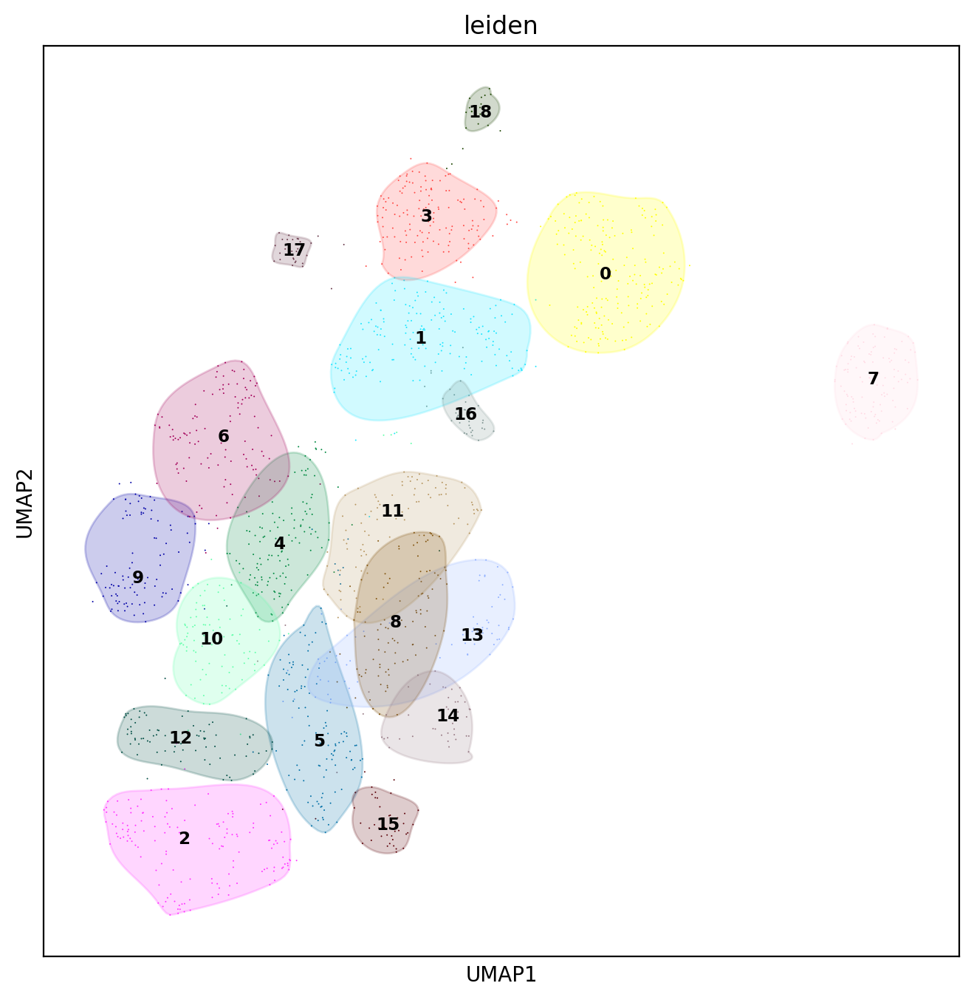

In [355]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, distance
from scipy import interpolate
from sklearn.cluster import KMeans
from sklearn.neighbors import NearestNeighbors
import scanpy as sc

def plot_clusters(data, var, embedding='X_umap', n_neighbors=3, interp_points=100):
    # Filter data by tissue

    fig, ax = plt.subplots(figsize=(8, 8))
     # Extracting colors for each leiden cluster
    leiden_colors = data.uns[f'{var}_colors']
    unique_clusters = data.obs[var].unique().astype(int)
    col_pal = {str(cluster): leiden_colors[cluster] for cluster in unique_clusters}


    # Plot UMAP with the colors
    sc.pl.umap(data, color=var, legend_loc='on data', size=2, legend_fontsize='small', ax=ax, show=False, palette=col_pal)

    umap_coord = pd.DataFrame(data.obsm[embedding], columns=['dim_1', 'dim_2'])
    umap_coord['cluster'] = data.obs[var].values

    for i in umap_coord.cluster.unique():
        points = umap_coord[umap_coord.cluster == i][['dim_1', 'dim_2']].values

        # KMeans to find the centroid
        kmeans = KMeans(n_clusters=1).fit(points)
        centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
        points = points[centroid_distance[0] <= centroid_distance[0].mean() + 1.96 * centroid_distance[0].std()]

        # KNN to filter outliers
        neigh = NearestNeighbors(n_neighbors=n_neighbors, n_jobs=-1)
        neigh.fit(points)
        dist, _ = neigh.kneighbors(points)
        distances = pd.DataFrame([dist[i][n_neighbors - 1] for i in range(len(dist))])
        points = points[distances[0] <= distances[0].mean() + 1.96 * distances[0].std()]

        # Convex hull
        if len(points) > 3:  # ConvexHull needs at least 3 points
            hull = ConvexHull(points)
            x_hull = np.append(points[hull.vertices, 0], points[hull.vertices, 0][0])
            y_hull = np.append(points[hull.vertices, 1], points[hull.vertices, 1][0])

            # Interpolation for smoother shape
            dist_along = np.concatenate(([0], np.sqrt(np.diff(x_hull)**2 + np.diff(y_hull)**2).cumsum()))
            spline, _ = interpolate.splprep([x_hull, y_hull], u=dist_along, s=0)
            interp_d = np.linspace(dist_along[0], dist_along[-1], interp_points)
            interp_x, interp_y = interpolate.splev(interp_d, spline)

            # Plotting
            ax.fill(interp_x, interp_y, '--', c=col_pal[i], alpha=0.2)

    plt.show()

# Example usage
plot_clusters(data=adata_tt, var='leiden', embedding='X_umap')


In [114]:
adata_tt.obs[adata_tt.obs['leiden'].isin(['32'])]

,genes,all_genes,leiden,TSK_score
CHEMBL869|NITROFURAZONE,LMNA,"LMNA,NFE2L2,TDP1",32,17.488737
CHEMBL822|TERBINAFINE,LMNA,LMNA,32,17.488737
CHEMBL1208|CINOXACIN,LMNA,LMNA,32,17.488737
CHEMBL62193|SULFADIMETHOXINE,LMNA,LMNA,32,17.488737
CHEMBL268869|SULFAMETHOXYPYRIDAZINE,LMNA,LMNA,32,17.488737
CHEMBL1373|MODAFINIL,LMNA,"LMNA,SLC6A3",32,17.488737
CHEMBL637|VENLAFAXINE,LMNA,LMNA,32,17.488737
CHEMBL1431|METFORMIN,LMNA,LMNA,32,17.488737
CHEMBL1233|CARISOPRODOL,LMNA,"LMNA,CBX1",32,17.488737
CHEMBL578|ENALAPRIL,LMNA,"APEX1,LMNA",32,17.488737


In [259]:
adata_tt.obs[adata_tt.obs['leiden'].isin(['27'])]

,genes,all_genes,leiden,TSK_score,Tumor_KC_Diff_score,CD8_EMRA
CHEMBL1591|DEMECLOCYCLINE,FEN1,FEN1,27,0.022978,-0.175780,-0.198191
CHEMBL1054|TRICHLORMETHIAZIDE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000
CHEMBL1587|POLYTHIAZIDE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000
CHEMBL406|INDAPAMIDE,SLC12A3,"APEX1,SLC12A3",27,0.000000,-0.001295,0.000000
CHEMBL1532|QUINETHAZONE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000
CHEMBL878|METOLAZONE,SLC12A3,"SLC12A3,HSD17B10",27,0.000000,-0.001295,0.000000
CHEMBL1763|HYDROFLUMETHIAZIDE,SLC12A3,"SLC12A3,KDM4E",27,0.000000,-0.001295,0.000000
CHEMBL1577|METHYCLOTHIAZIDE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000
CHEMBL1055|CHLORTHALIDONE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000
CHEMBL842|CHLOROTHIAZIDE,SLC12A3,SLC12A3,27,0.000000,-0.001295,0.000000


In [170]:
list(adata_tt.var['level3_celltype'].unique())

['Tumor_KC_Diff',
 'Keratinocyte',
 'Tumor_KC_Basal',
 'Tumor_KC_Cyc',
 'Endothelial Cell',
 'Pilosebaceous',
 'Fibroblast',
 'Melanocyte',
 'TSK',
 'Multiplet',
 'Eccrine',
 'LC',
 'PDC',
 'Normal_KC_Basal',
 'Normal_KC_Diff',
 'Normal_KC_Cyc',
 'CLEC9A',
 'CD1C',
 'Mig_CD1C',
 'Mac',
 'ASDC',
 'CD8_Exh',
 'Mig_LC',
 'Treg',
 'MDSC',
 'CD4_Exh',
 'B Cell',
 'CD8_EM',
 'CD4_Naive',
 'CD4_Pre_Exh',
 'Mig_CLEC9A',
 'NK',
 'CD8_EMRA',
 'CD8_Naive',
 'CD4_RGCC']

computing score 'TSK_score'
    finished: added
    'TSK_score', score of gene set (adata.obs).
    1146 total control genes are used. (0:00:00)


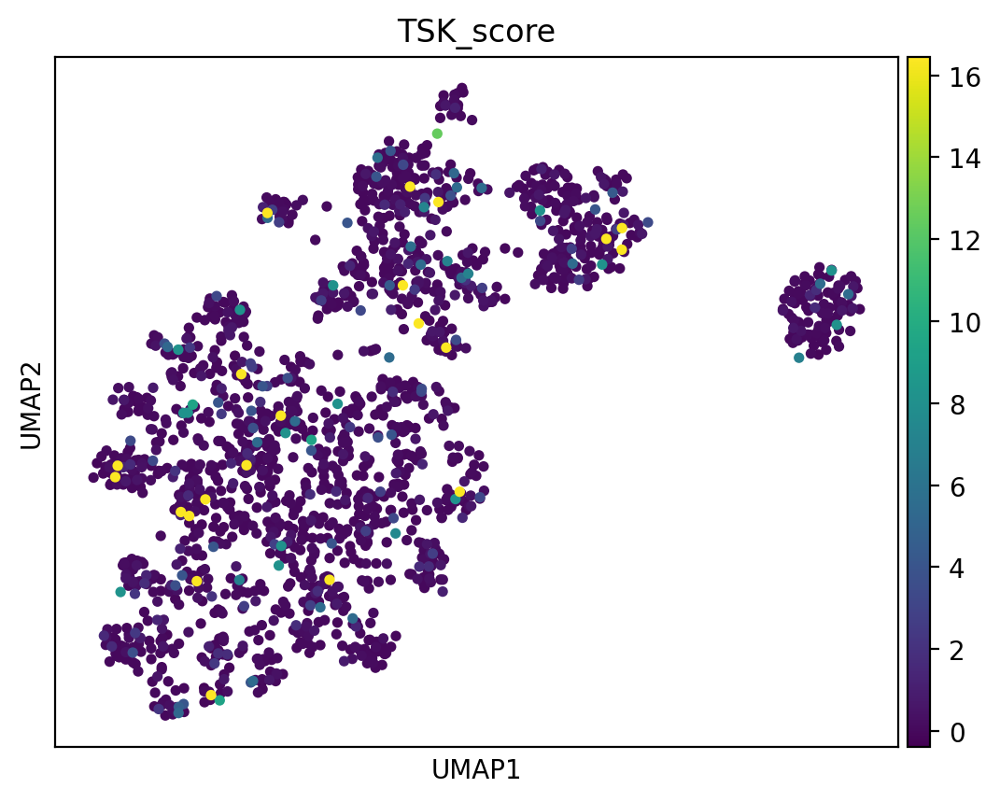

In [357]:
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt

# Your dictionary with scores as keys and gene lists as values
scores_dict = {
    'TSK_score': ['TSK'],
#     'Tumor_KC_Diff_score':['Tumor_KC_Diff'],
#     'CD8_EMRA':['CD8_EMRA'],
}

control_grp = 'Keratinocyte'

# Iterate over the dictionary to calculate and plot scores
for score_name, genes in scores_dict.items():
    
    tt_temp = adata_tt[:,list(adata_tt.var.loc[adata_tt.var['level3_celltype'].isin(scores_dict[score_name] + [control_grp])].index)]
    ll = list(tt_temp.var[tt_temp.var['level3_celltype'].isin(scores_dict[score_name])].index)
    
    # Calculate the score
    sc.tl.score_genes(tt_temp, gene_list=ll, ctrl_size=50, n_bins=25,
                      score_name=score_name, random_state=0, use_raw=None)

    adata_tt.obs[score_name] = 0
    adata_tt.obs.loc[adata_tt.obs.index.isin(tt_temp.obs.index),score_name] = tt_temp.obs[score_name]
    # KDE plot of the score on the UMAP embedding
    sc.pl.umap(adata_tt,color ='TSK_score')
    plt.show()

In [240]:
import pandas as pd
import numpy as np
from scipy.sparse import issparse

def create_gene_means_by_category(adata, category_column):
    """
    Calculate the mean expression of genes grouped by a specified category in adata.var.

    Parameters:
    - adata: An AnnData object containing the single-cell dataset.
    - category_column: A string specifying the column in adata.var to group genes by.

    Returns:
    - gene_means: A DataFrame containing the mean expression of genes for each category.
    """

    # Initialize a DataFrame to store mean expressions
    gene_means = pd.DataFrame()

    # Check if the data is stored in a sparse matrix format and convert to dense if true
    if issparse(adata.X):
        data_dense = adata.X.toarray()
    else:
        data_dense = adata.X

    # Iterate over each category and calculate mean expression
    for category in adata.var[category_column].unique():
        # Find indices of genes belonging to the current category
        gene_indices = adata.var[adata.var[category_column] == category].index
        
        # Calculate mean expression for these genes
        mean_expression = data_dense[:, adata.var.index.isin(gene_indices)].sum(axis=1)
        
        # Add mean expression to the gene_means DataFrame
        gene_means[category] = mean_expression

    # Optional: Transpose the DataFrame to have categories as columns
    gene_means = gene_means.T

    return gene_means

# Usage example
category_column = 'level3_celltype'
gene_means_by_category = create_gene_means_by_category(adata_tt, category_column)

# # `gene_means_by_category` is now a DataFrame with mean expressions of genes for each category in 'level3_celltype'

# import anndata as ad
# import pandas as pd

# def create_anndata_from_gene_means(gene_means, original_adata):
#     """
#     Create a new AnnData object from a DataFrame of gene mean expressions.

#     Parameters:
#     - gene_means: DataFrame with mean expressions of genes, rows as categories.
#     - original_adata: Original AnnData object to copy variable annotations from.

#     Returns:
#     - new_adata: An AnnData object with gene means as data and categories as observations.
#     """
#     # Ensure gene_means columns align with original_adata.var names
#     gene_means = gene_means[original_adata.var_names]

#     # Create new AnnData object with gene means
#     new_adata = ad.AnnData(X=gene_means.values)

#     # Set observations (obs) names to categories from gene_means DataFrame
#     new_adata.obs_names = gene_means.index

#     # Set variables (var) names to gene names
#     new_adata.var_names = gene_means.columns

#     # Optionally, include categories as a column in obs
#     new_adata.obs['category'] = gene_means.index

#     return new_adata

# # Usage example
# group_by = 'level3_celltype'  # Specify the column to group by
# metacells = create_metacells(adata_tt, group_by)

# # Ensure gene_means_by_category columns align with adata_tt.var_names
# gene_means_by_category_aligned = gene_means_by_category.reindex(columns=adata_tt.var_names)

# # Create new AnnData object with aligned gene means
# meta_nn = create_anndata_from_gene_means(gene_means_by_category_aligned.T, adata_tt)


In [248]:
nn_data = ad.AnnData(X=gene_means_by_category.values).T
#nn_data.var.index = list(adata_tt.var['level3_celltype'].unique())
nn_data.obs = adata_tt.obs
nn_data.obsm = adata_tt.obsm
nn_data.uns = adata_tt.uns

sc.pp.scale(nn_data, max_value=10)

In [243]:
nn_data.var.index 

Index(['Tumor_KC_Diff', 'Keratinocyte', 'Tumor_KC_Basal', 'Tumor_KC_Cyc',
       'Endothelial Cell', 'Pilosebaceous', 'Fibroblast', 'Melanocyte', 'TSK',
       'Multiplet', 'Eccrine', 'LC', 'PDC', 'Normal_KC_Basal',
       'Normal_KC_Diff', 'Normal_KC_Cyc', 'CLEC9A', 'CD1C', 'Mig_CD1C', 'Mac',
       'ASDC', 'CD8_Exh', 'Mig_LC', 'Treg', 'MDSC', 'CD4_Exh', 'B Cell',
       'CD8_EM', 'CD4_Naive', 'CD4_Pre_Exh', 'Mig_CLEC9A', 'NK', 'CD8_EMRA',
       'CD8_Naive', 'CD4_RGCC'],
      dtype='object')

# Run scentinel to obtain rankings for drugs